[*********************100%%**********************]  1 of 1 completed


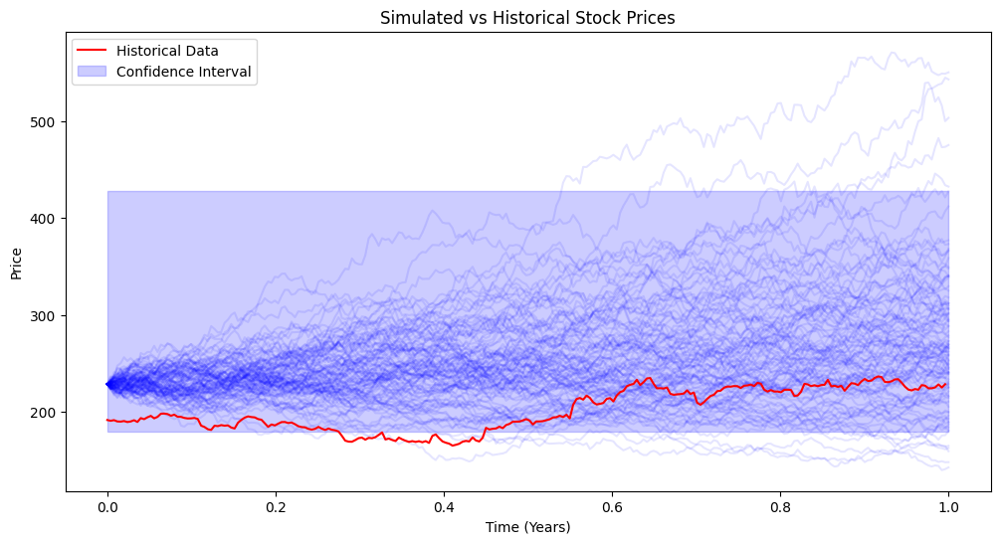

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf




def fetch_historical_data(ticker, period="1y"):
    """
    Fetches historical stock price data.
    :param ticker: Stock ticker symbol.
    :param period: Time period to fetch (default: 1 year).
    :return: DataFrame with historical data.
    """
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252  # Annualized mean return
    sigma = daily_returns.std() * np.sqrt(252)  # Annualized volatility
    current_price = historical_prices.iloc[-1]  # Most recent closing price
    return current_price, mu, sigma, historical_prices

# Plot Simulated vs Historical Data
def plot_simulations_and_historical(time, simulated, historical, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.plot(np.linspace(0, len(historical) / 252, len(historical)), historical, color='red', label='Historical Data')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated vs Historical Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    """
    Simulates Geometric Brownian Motion for stock price movements.
    :param S0: Initial stock price.
    :param mu: Drift (mean return).
    :param sigma: Volatility (standard deviation of returns).
    :param T: Time period (in years).
    :param dt: Time step (e.g., 1/252 for daily data).
    :param simulations: Number of simulation paths.
    :return: Array of simulated price paths.
    """
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        # Wiener process
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        # GBM formula
        prices[t] = prices[t-1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    """
    Runs the Monte Carlo simulation for a given stock.
    :param ticker: Stock ticker symbol.
    :param S0: Initial stock price.
    :param mu: Drift.
    :param sigma: Volatility.
    :param T: Time period.
    :param dt: Time step.
    :param simulations: Number of simulation paths.
    """
    S0, mu, sigma, historical = fetch_historical_data(ticker)
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)

    lower_bound = np.percentile(simulated[-1], 5)
    upper_bound = np.percentile(simulated[-1], 95)

    plot_simulations_and_historical(time, simulated, historical, (lower_bound, upper_bound))

# Parameters
ticker = "AAPL"  # Example stock
T = 1  # 1 year
dt = 1/252  # Daily time steps
simulations = 100  # Number of paths

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


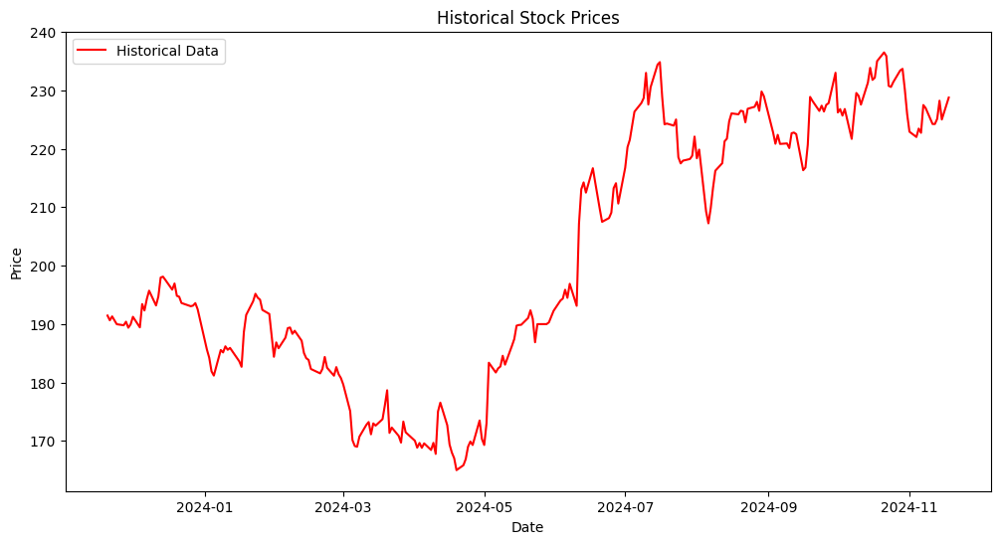

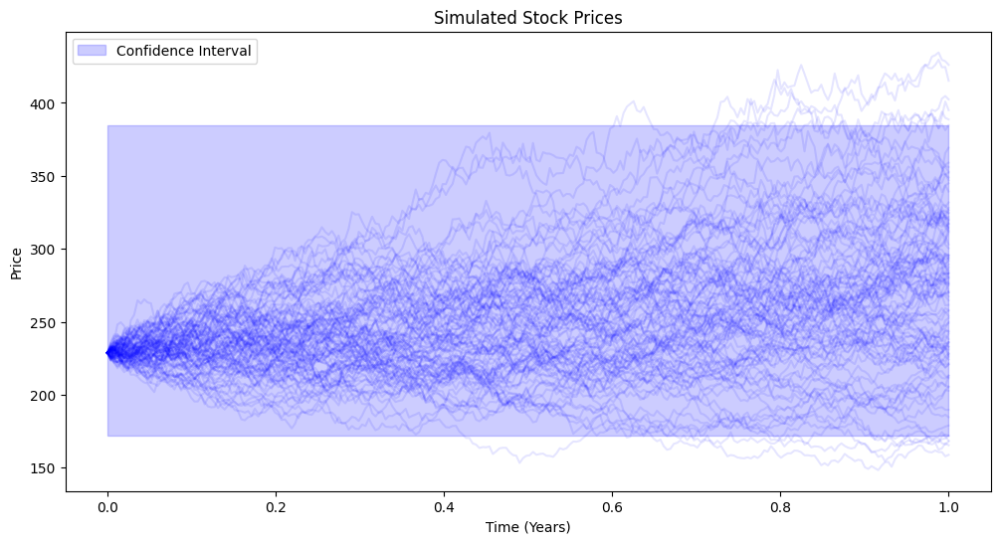

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

# Fetch Historical Data and Metrics
def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252  # Annualized mean return
    sigma = daily_returns.std() * np.sqrt(252)  # Annualized volatility
    current_price = historical_prices.iloc[-1]  # Most recent closing price
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    # Fetch stock data and calculate metrics
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    # Simulate GBM
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)
    # Calculate confidence intervals
    lower_bound = np.percentile(simulated[-1], 5)
    upper_bound = np.percentile(simulated[-1], 95)
    # Plot historical and simulated data separately
    plot_historical(historical)
    plot_simulations(time, simulated, (lower_bound, upper_bound))

# Parameters
ticker = "AAPL"  # Example stock
T = 1  # 1 year
dt = 1/252  # Daily time steps
simulations = 100  # Number of paths

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


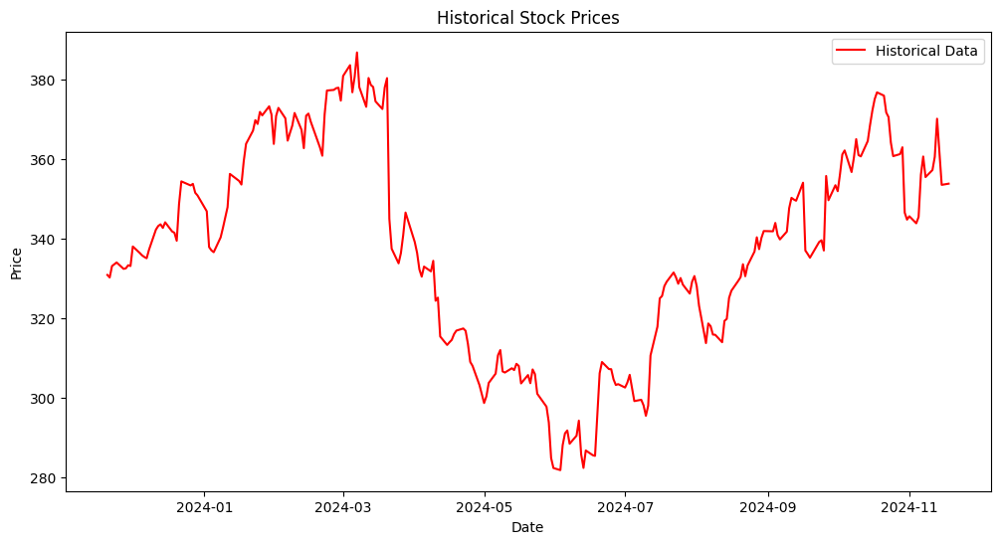

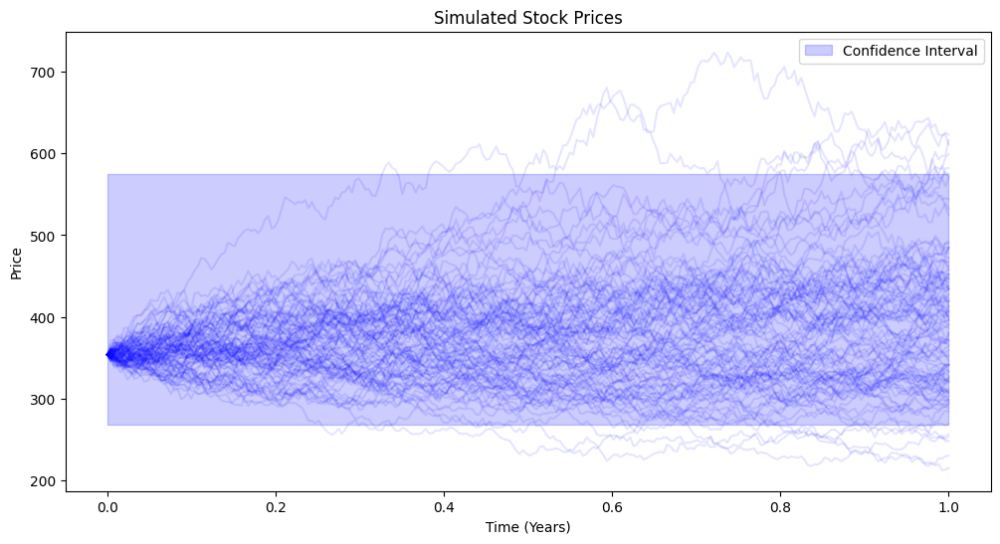

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)
    lower_bound = np.percentile(simulated[-1], 5)
    upper_bound = np.percentile(simulated[-1], 95)
    plot_historical(historical)
    plot_simulations(time, simulated, (lower_bound, upper_bound))

# Parameters
ticker = "ACN"  # Example stock
T = 1  # 1 year
dt = 1/252  # Daily time steps
simulations = 100  # Number of paths

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


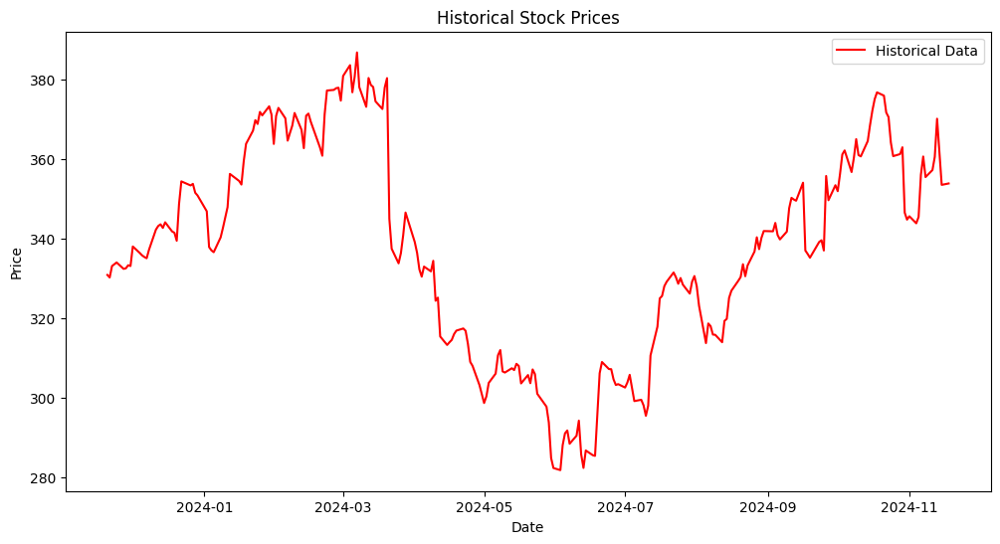

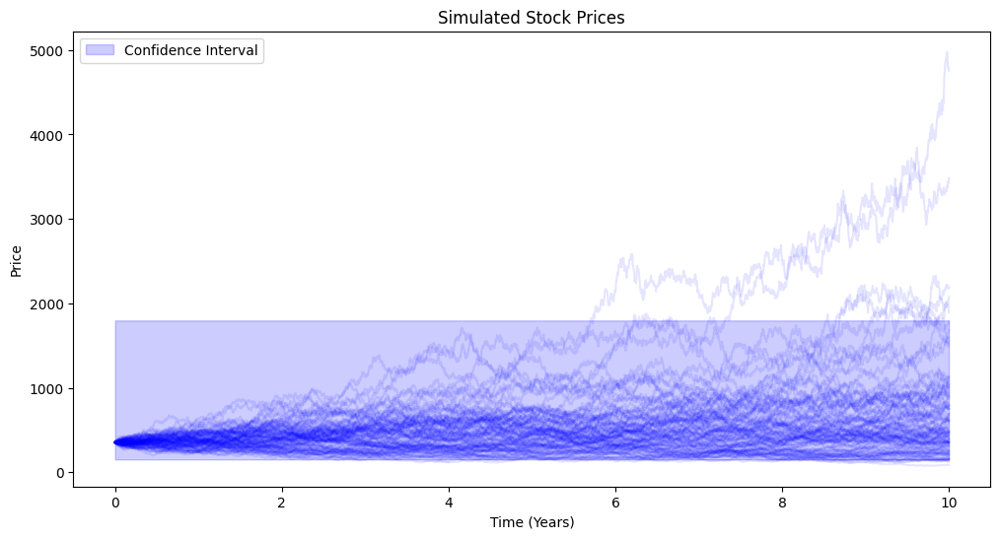

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)
    lower_bound = np.percentile(simulated[-1], 5)
    upper_bound = np.percentile(simulated[-1], 95)
    plot_historical(historical)
    plot_simulations(time, simulated, (lower_bound, upper_bound))

# Parameters
ticker = "ACN"  # Example stock
T = 10  # 1 year
dt = 1/252  # Daily time steps
simulations = 100  # Number of paths

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


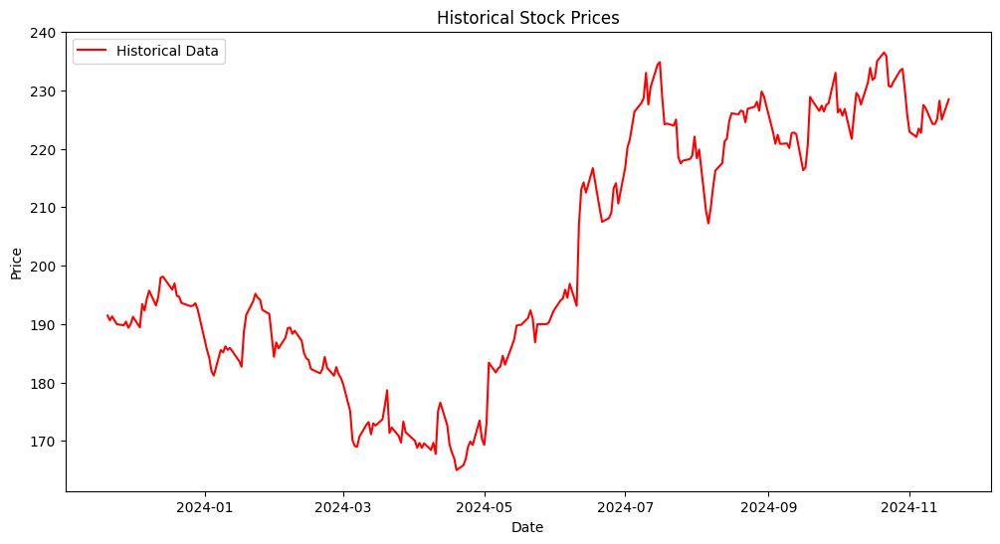

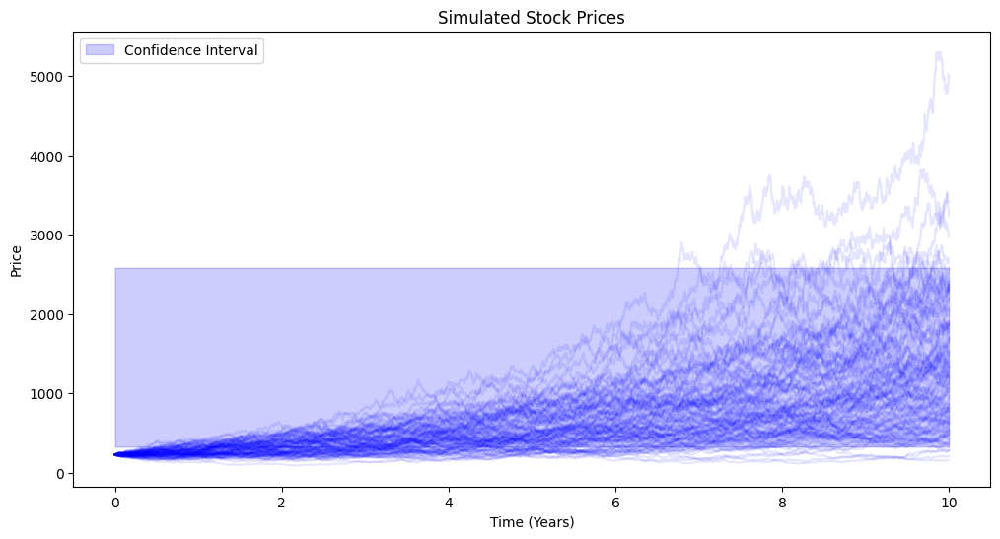

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)
    lower_bound = np.percentile(simulated[-1], 5)
    upper_bound = np.percentile(simulated[-1], 95)
    plot_historical(historical)
    plot_simulations(time, simulated, (lower_bound, upper_bound))

# Parameters
ticker = "AAPL"  # Example stock
T = 10  # 1 year
dt = 1/252  # Daily time steps
simulations = 100  # Number of paths

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


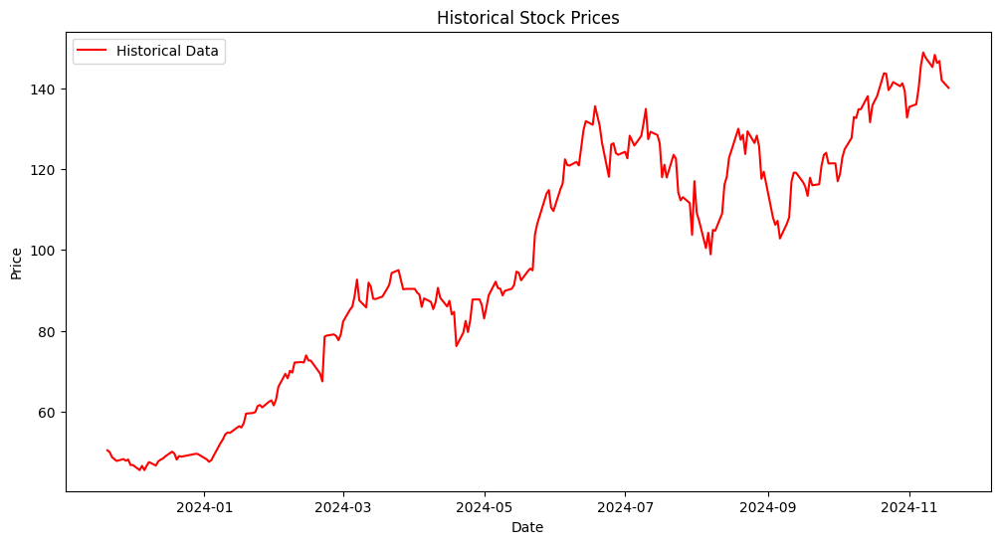

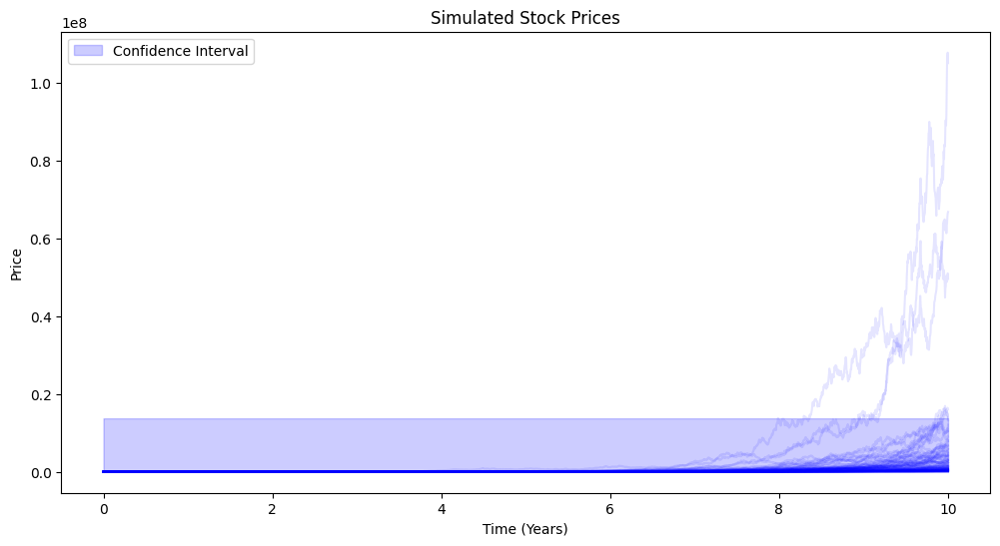

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)
    lower_bound = np.percentile(simulated[-1], 5)
    upper_bound = np.percentile(simulated[-1], 95)
    plot_historical(historical)
    plot_simulations(time, simulated, (lower_bound, upper_bound))

# Parameters
ticker = "NVDA"  # Example stock
T = 10  # 1 year
dt = 1/252  # Daily time steps
simulations = 100  # Number of paths

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


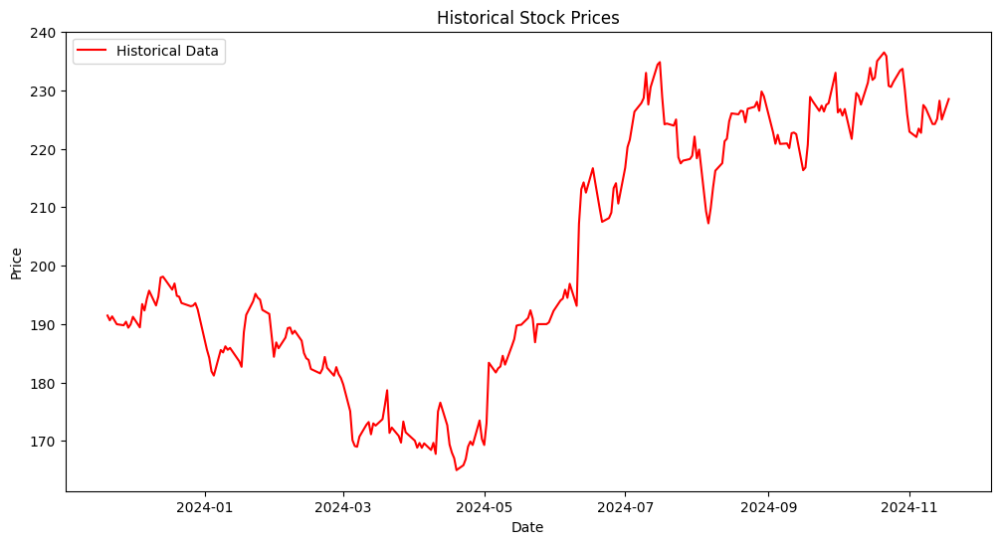

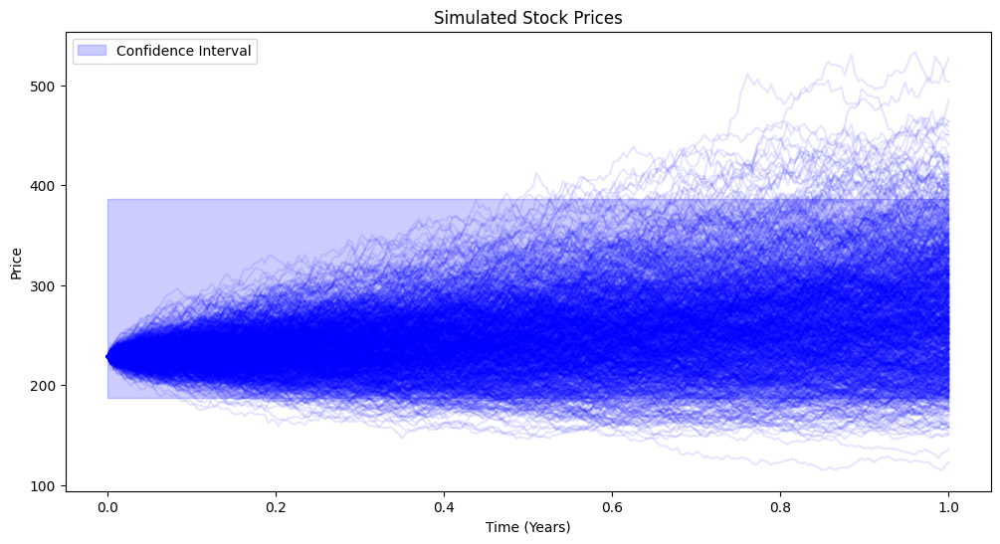

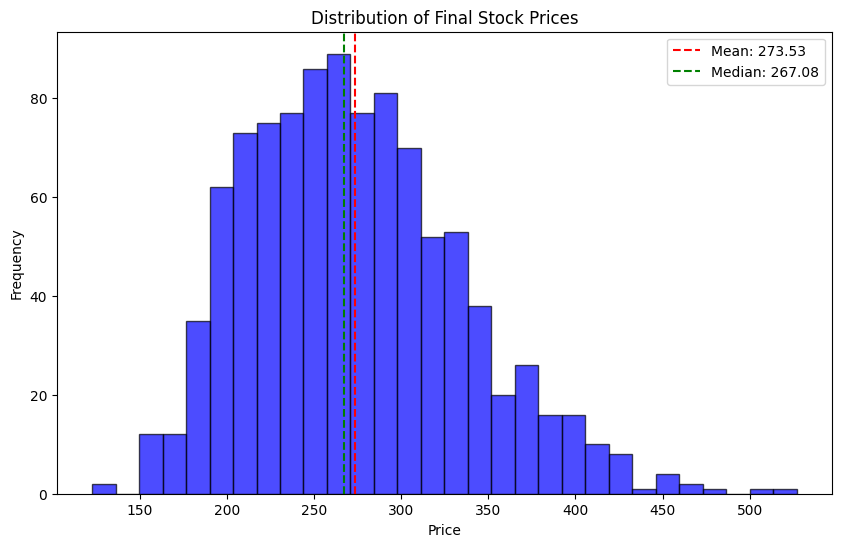

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

# Fetch Historical Data and Metrics
def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252  # Annualized mean return
    sigma = daily_returns.std() * np.sqrt(252)  # Annualized volatility
    current_price = historical_prices.iloc[-1]  # Most recent closing price
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Histogram of Final Prices
def plot_final_price_distribution(final_prices):
    plt.figure(figsize=(10, 6))
    plt.hist(final_prices, bins=30, color='blue', alpha=0.7, edgecolor='black')
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.legend()
    plt.show()

# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    # Fetch stock data and calculate metrics
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    # Simulate GBM
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)
    # Calculate confidence intervals
    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot historical data
    plot_historical(historical)
    # Plot simulated data
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    # Plot final price distribution
    plot_final_price_distribution(final_prices)

# Parameters
ticker = "AAPL"  # Example stock
T = 1  # 1 year
dt = 1/252  # Daily time steps
simulations = 1000  # Number of paths

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


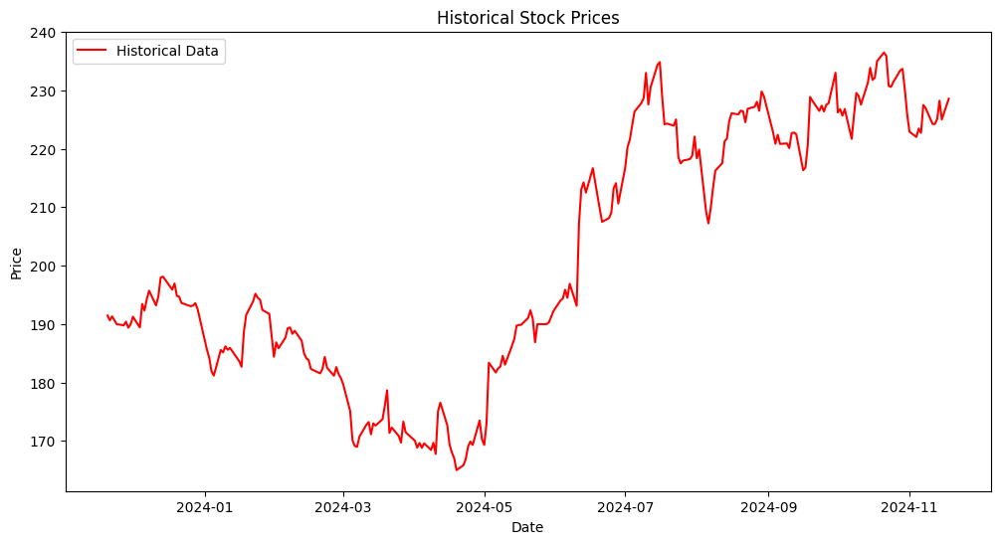

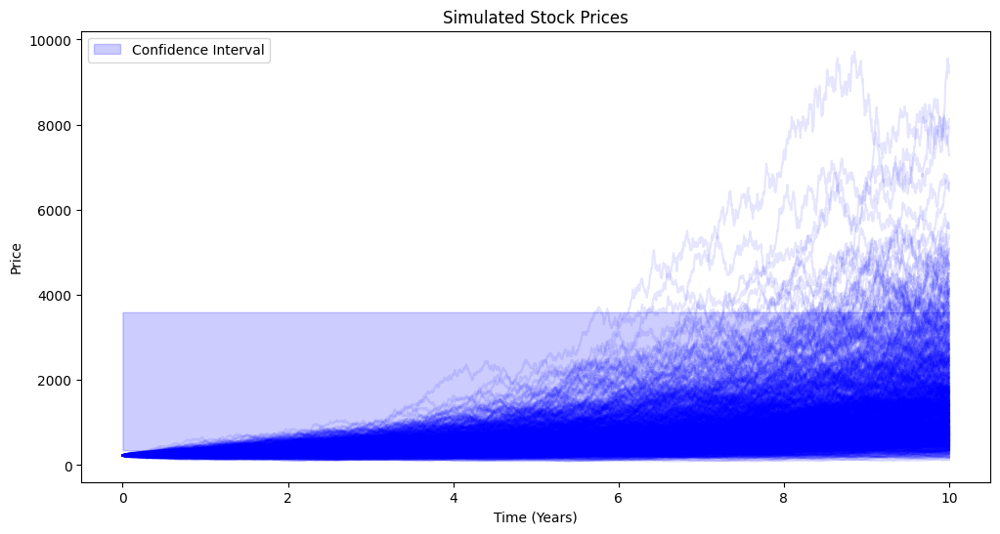

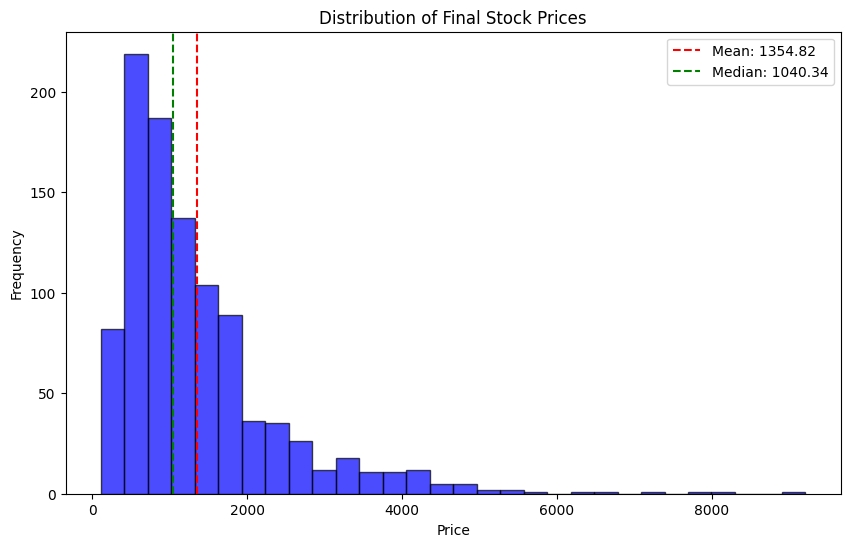

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

# Fetch Historical Data and Metrics
def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252  # Annualized mean return
    sigma = daily_returns.std() * np.sqrt(252)  # Annualized volatility
    current_price = historical_prices.iloc[-1]  # Most recent closing price
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Histogram of Final Prices
def plot_final_price_distribution(final_prices):
    plt.figure(figsize=(10, 6))
    plt.hist(final_prices, bins=30, color='blue', alpha=0.7, edgecolor='black')
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.legend()
    plt.show()

# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    # Fetch stock data and calculate metrics
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    # Simulate GBM
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)
    # Calculate confidence intervals
    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot historical data
    plot_historical(historical)
    # Plot simulated data
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    # Plot final price distribution
    plot_final_price_distribution(final_prices)

# Parameters
ticker = "AAPL"  # Example stock
T = 10 # 1 year
dt = 1/252  # Daily time steps
simulations = 1000  # Number of paths

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


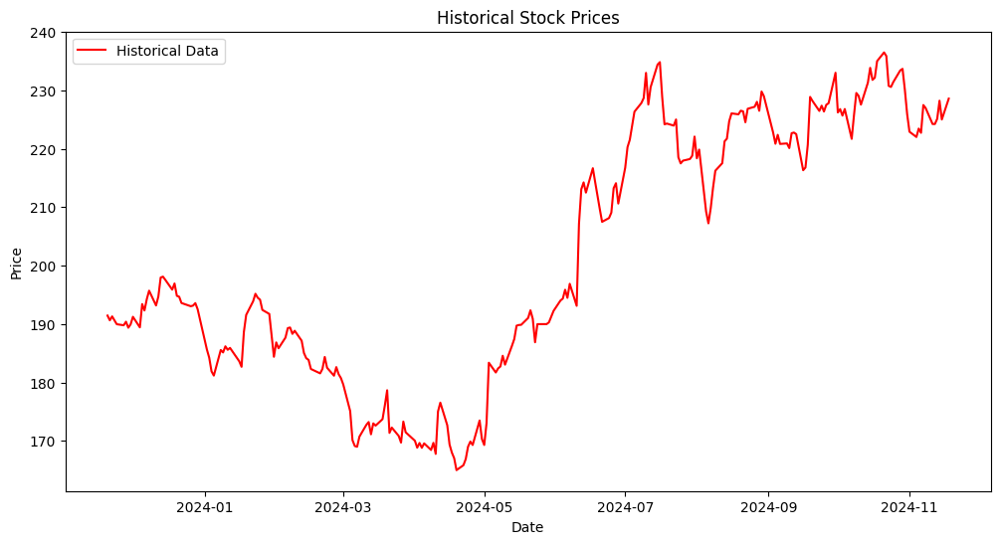

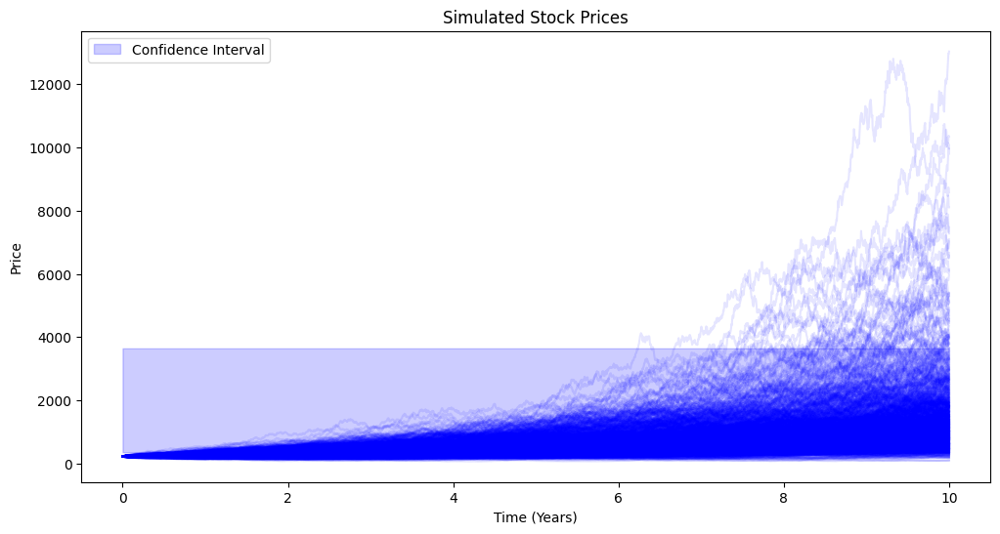

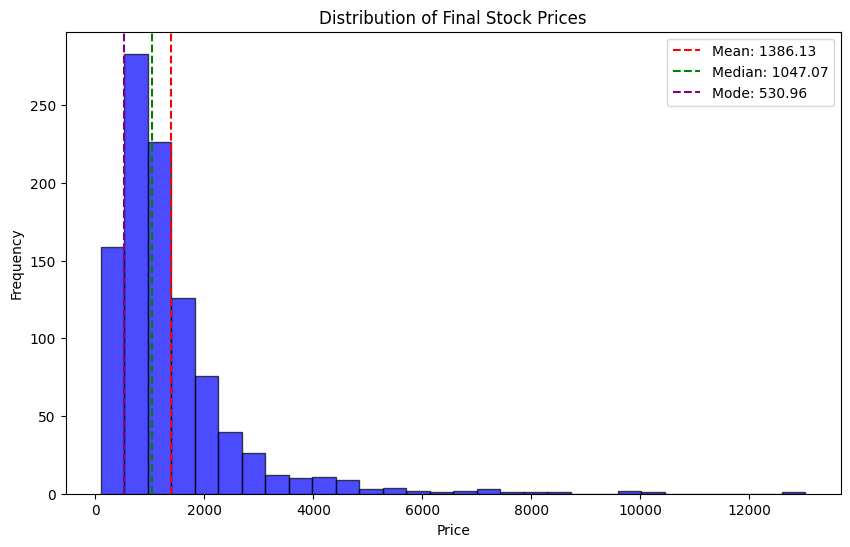

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

# Fetch Historical Data and Metrics
def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252  # Annualized mean return
    sigma = daily_returns.std() * np.sqrt(252)  # Annualized volatility
    current_price = historical_prices.iloc[-1]  # Most recent closing price
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Histogram of Final Prices
def plot_final_price_distribution(final_prices):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=30, color='blue', alpha=0.7, edgecolor='black')
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)]  # The bin with the highest frequency
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()

# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    # Fetch stock data and calculate metrics
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    # Simulate GBM
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)
    # Calculate confidence intervals
    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot historical data
    plot_historical(historical)
    # Plot simulated data
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    # Plot final price distribution
    plot_final_price_distribution(final_prices)

# Parameters
ticker = "AAPL"  # Example stock
T = 10 # 1 year
dt = 1/252  # Daily time steps
simulations = 1000  # Number of paths

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


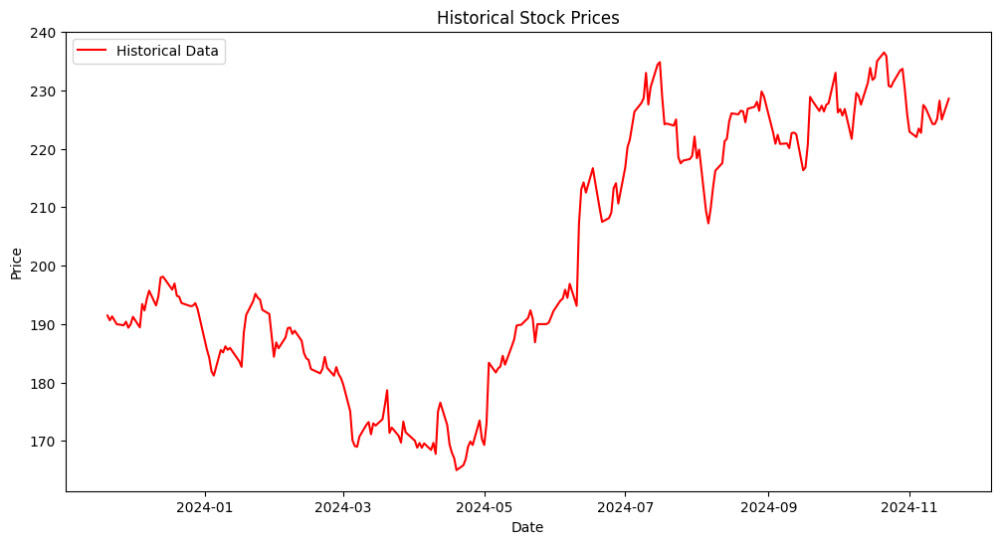

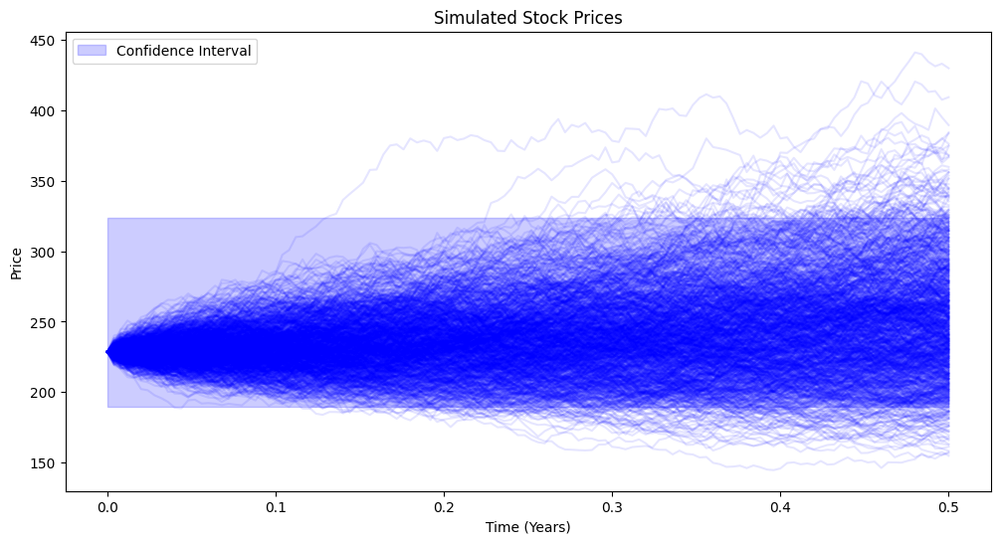

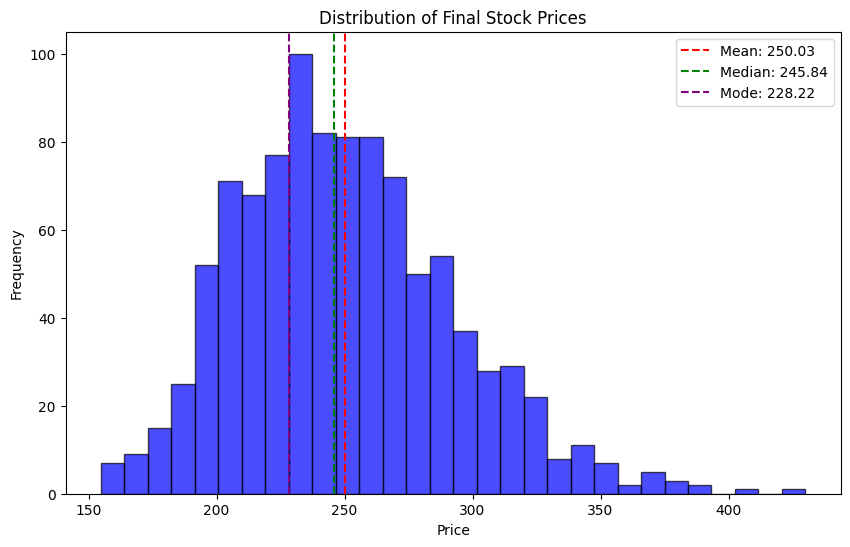

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

# Fetch Historical Data and Metrics
def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252  # Annualized mean return
    sigma = daily_returns.std() * np.sqrt(252)  # Annualized volatility
    current_price = historical_prices.iloc[-1]  # Most recent closing price
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Histogram of Final Prices
def plot_final_price_distribution(final_prices):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=30, color='blue', alpha=0.7, edgecolor='black')
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)]  # The bin with the highest frequency
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()

# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    # Fetch stock data and calculate metrics
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    # Simulate GBM
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)
    # Calculate confidence intervals
    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot historical data
    plot_historical(historical)
    # Plot simulated data
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    # Plot final price distribution
    plot_final_price_distribution(final_prices)

# Parameters
ticker = "AAPL"  # Example stock
T = 0.5 # 1 year
dt = 1/252  # Daily time steps
simulations = 1000  # Number of paths

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

# Fetch Historical Data and Metrics
def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252  # Annualized mean return
    sigma = daily_returns.std() * np.sqrt(252)  # Annualized volatility
    current_price = historical_prices.iloc[-1]  # Most recent closing price
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Histogram of Final Prices
def plot_final_price_distribution(final_prices):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=30, color='blue', alpha=0.7, edgecolor='black')
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)]  # The bin with the highest frequency
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()

# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    # Fetch stock data and calculate metrics
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    # Simulate GBM
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)
    # Calculate confidence intervals
    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot historical data
    plot_historical(historical)
    # Plot simulated data
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    # Plot final price distribution
    plot_final_price_distribution(final_prices)

# Parameters
ticker = "AAPL"  # Example stock
T = 0.5 # 1 year
dt = 1/252  # Daily time steps
simulations = 1000  # Number of paths

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


TypeError: plot_historical() missing 1 required positional argument: 'current_price'

[*********************100%%**********************]  1 of 1 completed


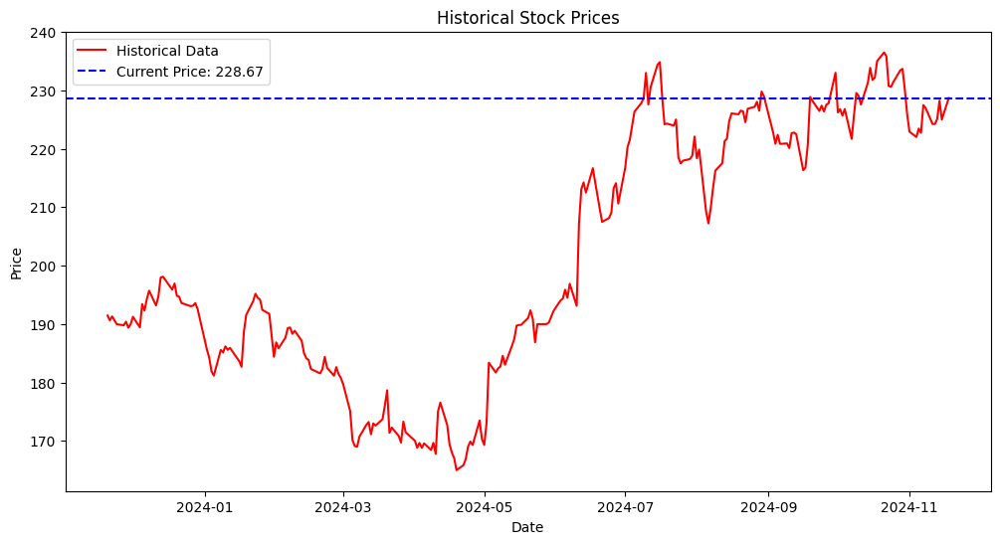

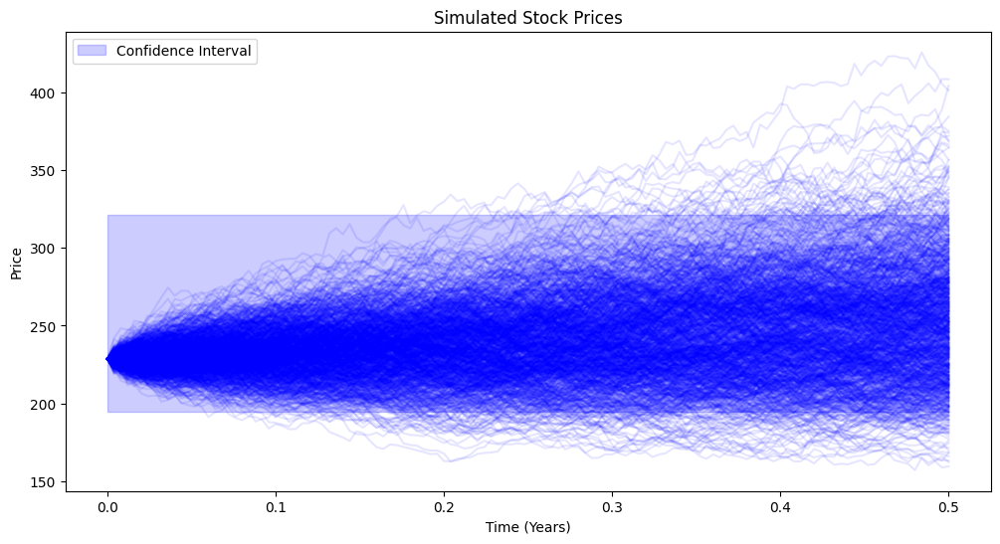

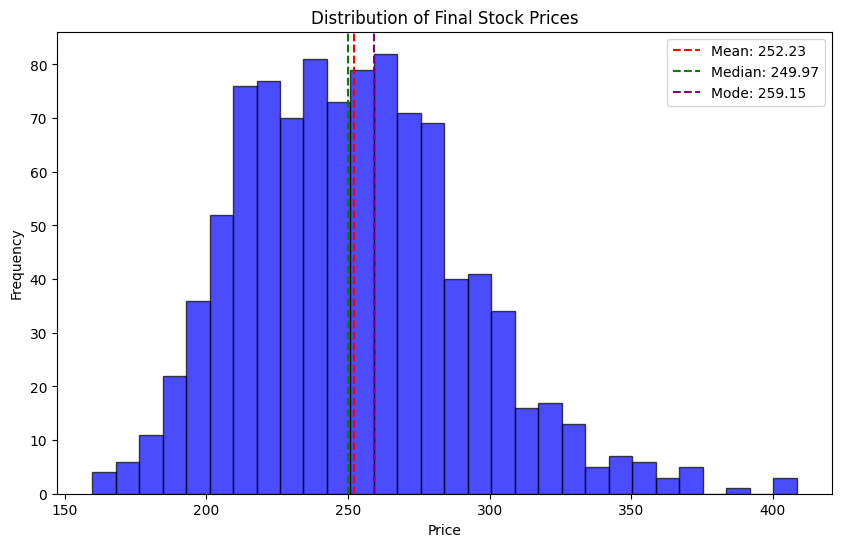

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

# Fetch Historical Data and Metrics
def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252  # Annualized mean return
    sigma = daily_returns.std() * np.sqrt(252)  # Annualized volatility
    current_price = historical_prices.iloc[-1]  # Most recent closing price
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Histogram of Final Prices
def plot_final_price_distribution(final_prices):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=30, color='blue', alpha=0.7, edgecolor='black')
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)]  # The bin with the highest frequency
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()

# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    # Fetch stock data and calculate metrics
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    # Simulate GBM
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)
    # Calculate confidence intervals
    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot historical data
    plot_historical(historical, S0)
    # Plot simulated data
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    # Plot final price distribution
    plot_final_price_distribution(final_prices)

# Parameters
ticker = "AAPL"  # Example stock
T = 0.5 # 1 year
dt = 1/252  # Daily time steps
simulations = 1000  # Number of paths

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


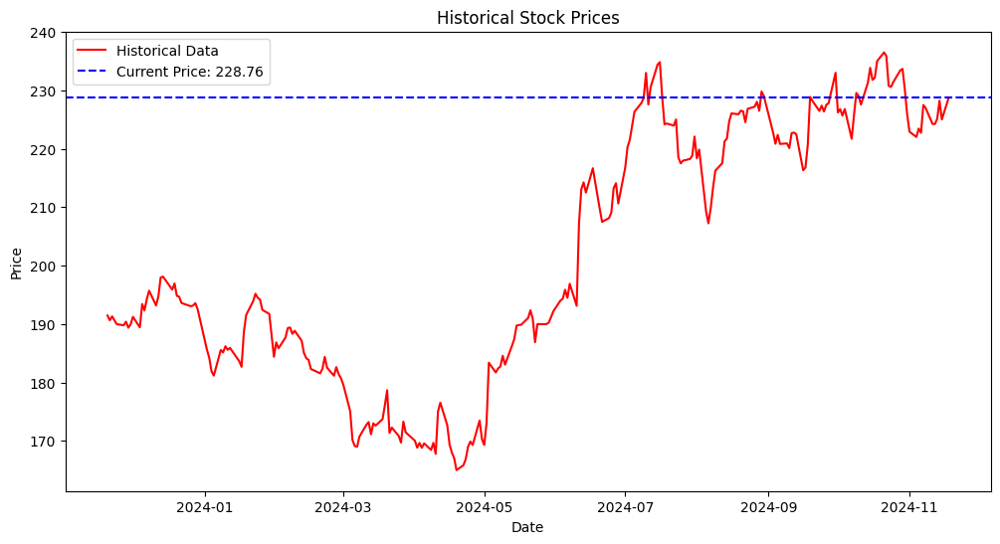

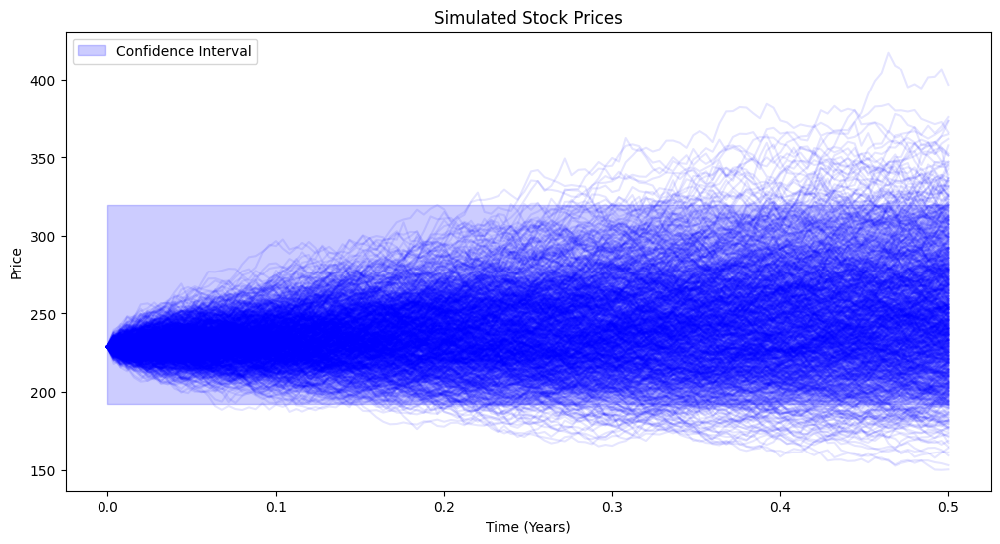

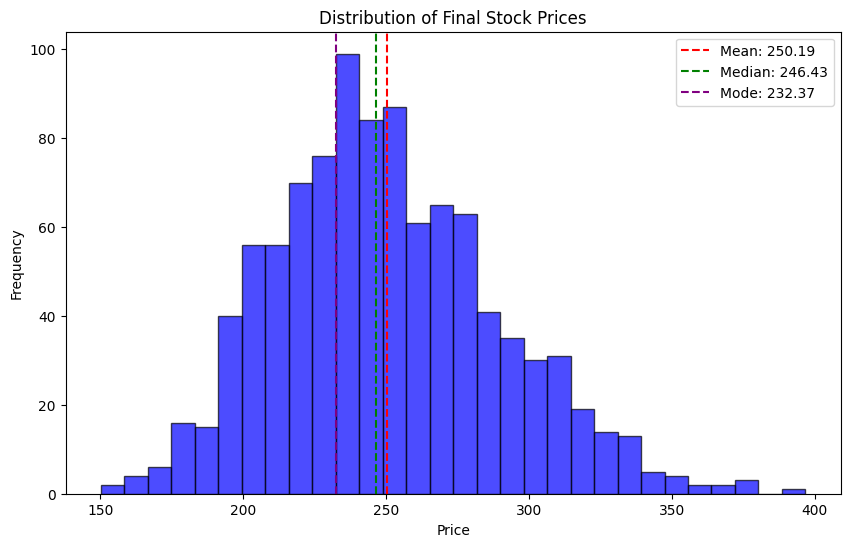

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

# Fetch Historical Data and Metrics
def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252  # Annualized mean return
    sigma = daily_returns.std() * np.sqrt(252)  # Annualized volatility
    current_price = historical_prices.iloc[-1]  # Most recent closing price
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Histogram of Final Prices
def plot_final_price_distribution(final_prices):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=30, color='blue', alpha=0.7, edgecolor='black')
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)]  # The bin with the highest frequency
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()

# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    # Fetch stock data and calculate metrics
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    # Simulate GBM
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)
    # Calculate confidence intervals
    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot historical data
    plot_historical(historical, S0)
    # Plot simulated data
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    # Plot final price distribution
    plot_final_price_distribution(final_prices)

# Parameters
ticker = "AAPL"
T = 0.5
dt = 1/252
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


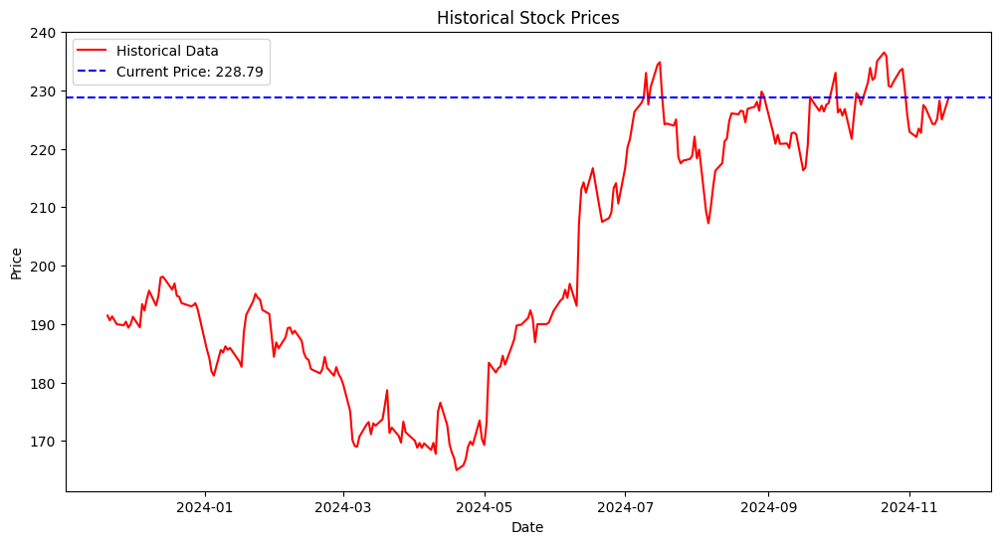

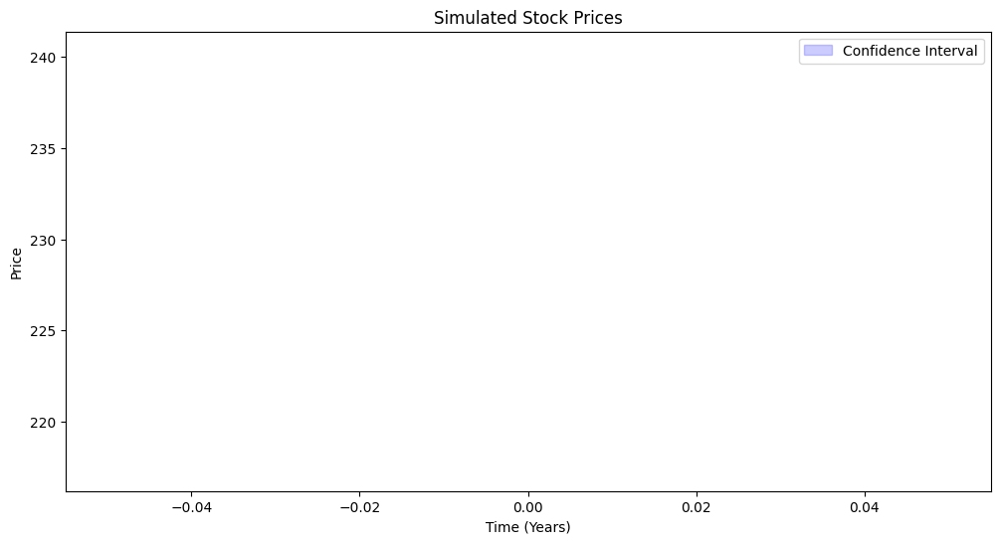

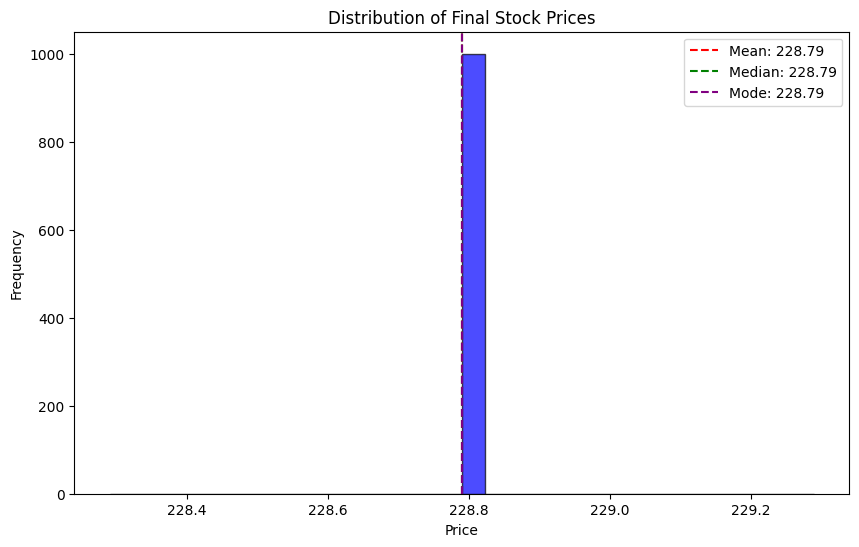

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

# Fetch Historical Data and Metrics
def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252  # Annualized mean return
    sigma = daily_returns.std() * np.sqrt(252)  # Annualized volatility
    current_price = historical_prices.iloc[-1]  # Most recent closing price
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Histogram of Final Prices
def plot_final_price_distribution(final_prices):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=30, color='blue', alpha=0.7, edgecolor='black')
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)]  # The bin with the highest frequency
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()

# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    # Fetch stock data and calculate metrics
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    # Simulate GBM
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)
    # Calculate confidence intervals
    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot historical data
    plot_historical(historical, S0)
    # Plot simulated data
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    # Plot final price distribution
    plot_final_price_distribution(final_prices)

# Parameters
ticker = "AAPL"
T = 1/252
dt = 1/252
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


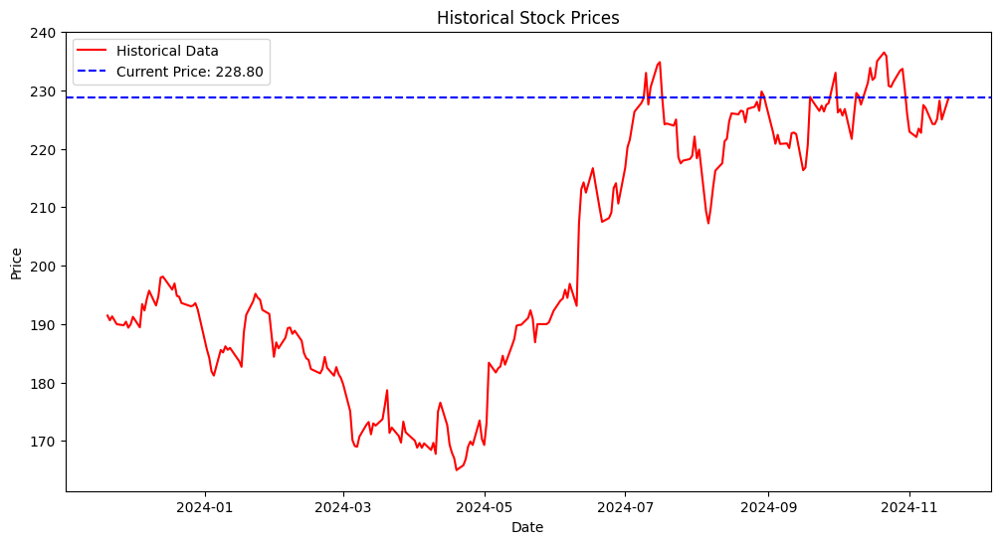

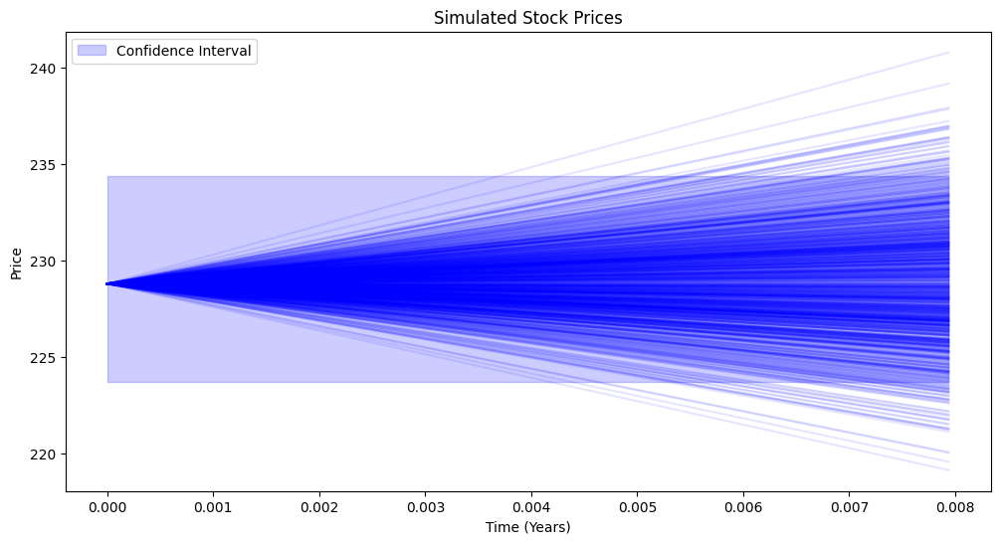

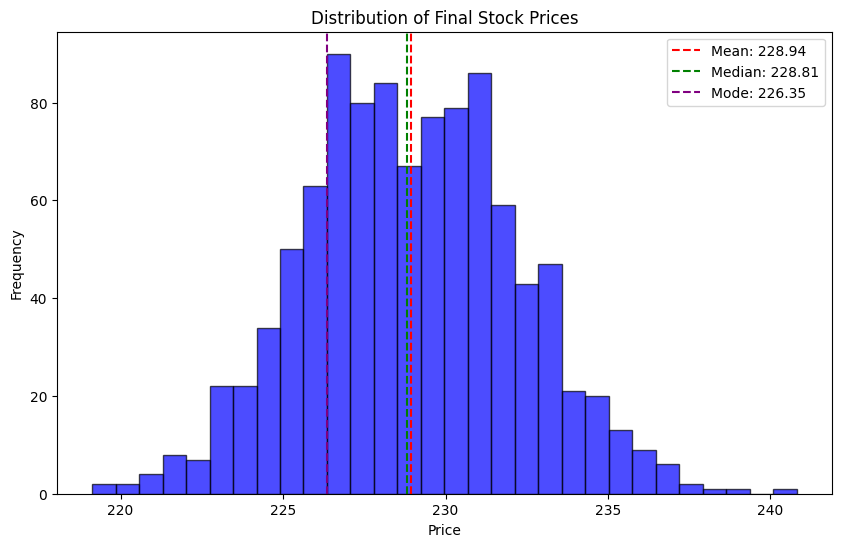

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

# Fetch Historical Data and Metrics
def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252  # Annualized mean return
    sigma = daily_returns.std() * np.sqrt(252)  # Annualized volatility
    current_price = historical_prices.iloc[-1]  # Most recent closing price
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Histogram of Final Prices
def plot_final_price_distribution(final_prices):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=30, color='blue', alpha=0.7, edgecolor='black')
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)]  # The bin with the highest frequency
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()

# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    # Fetch stock data and calculate metrics
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    # Simulate GBM
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)
    # Calculate confidence intervals
    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot historical data
    plot_historical(historical, S0)
    # Plot simulated data
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    # Plot final price distribution
    plot_final_price_distribution(final_prices)

# Parameters
ticker = "AAPL"
T = 2/252
dt = 1/252
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


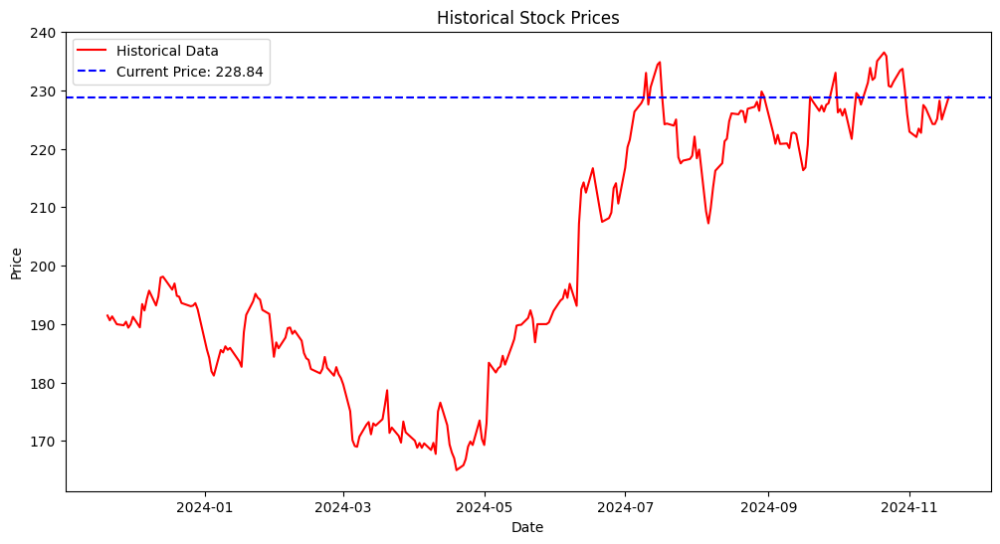

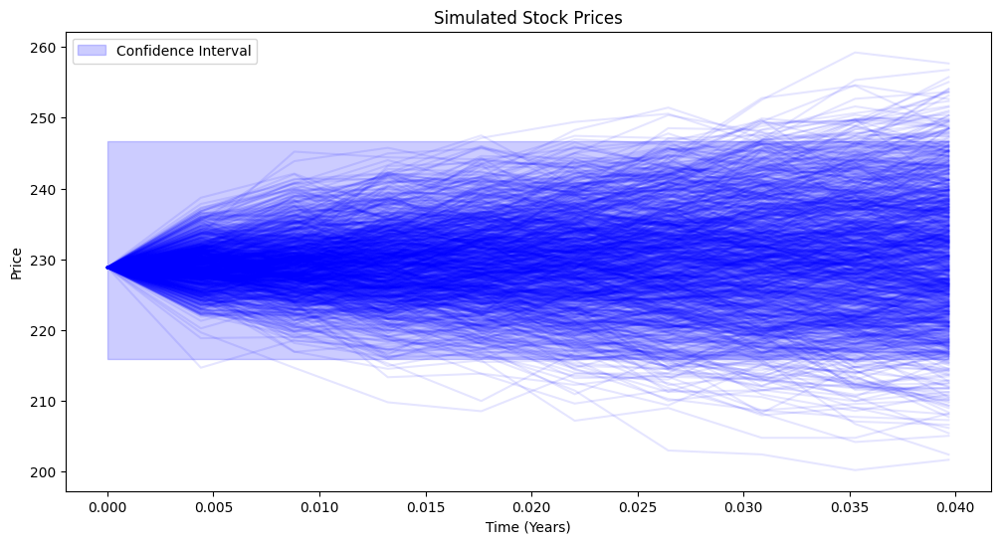

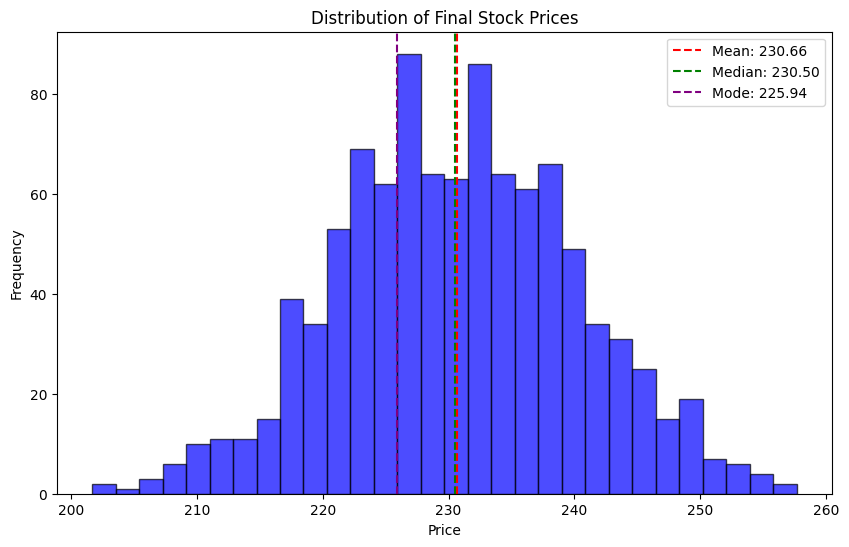

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

# Fetch Historical Data and Metrics
def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252  # Annualized mean return
    sigma = daily_returns.std() * np.sqrt(252)  # Annualized volatility
    current_price = historical_prices.iloc[-1]  # Most recent closing price
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Histogram of Final Prices
def plot_final_price_distribution(final_prices):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=30, color='blue', alpha=0.7, edgecolor='black')
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)]  # The bin with the highest frequency
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()

# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    # Fetch stock data and calculate metrics
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    # Simulate GBM
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)
    # Calculate confidence intervals
    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot historical data
    plot_historical(historical, S0)
    # Plot simulated data
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    # Plot final price distribution
    plot_final_price_distribution(final_prices)

# Parameters
ticker = "AAPL"
T = 10/252
dt = 1/252
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


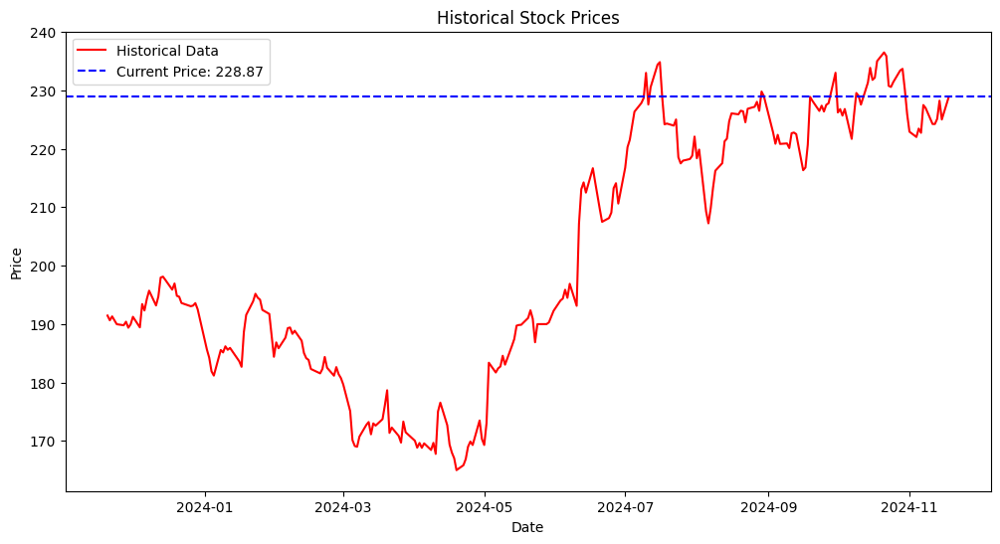

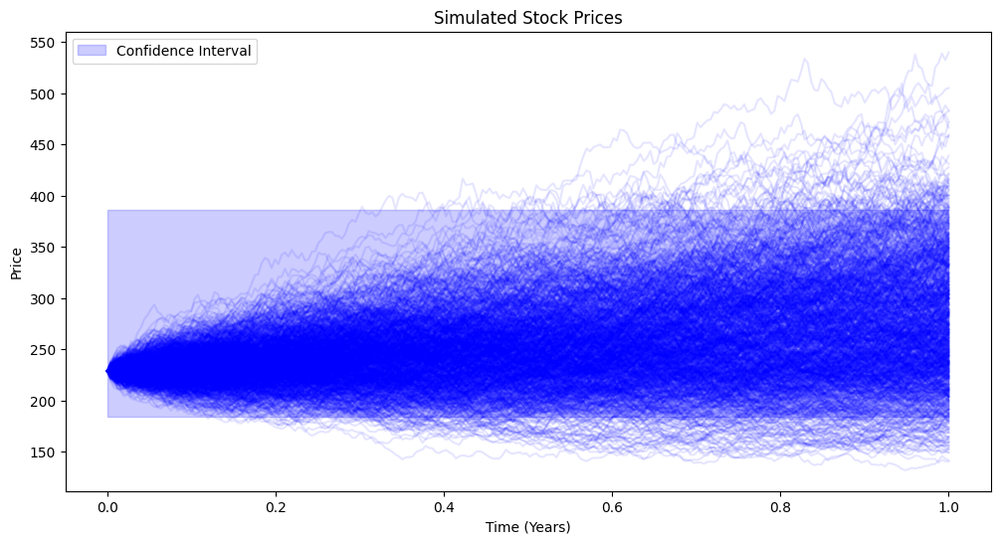

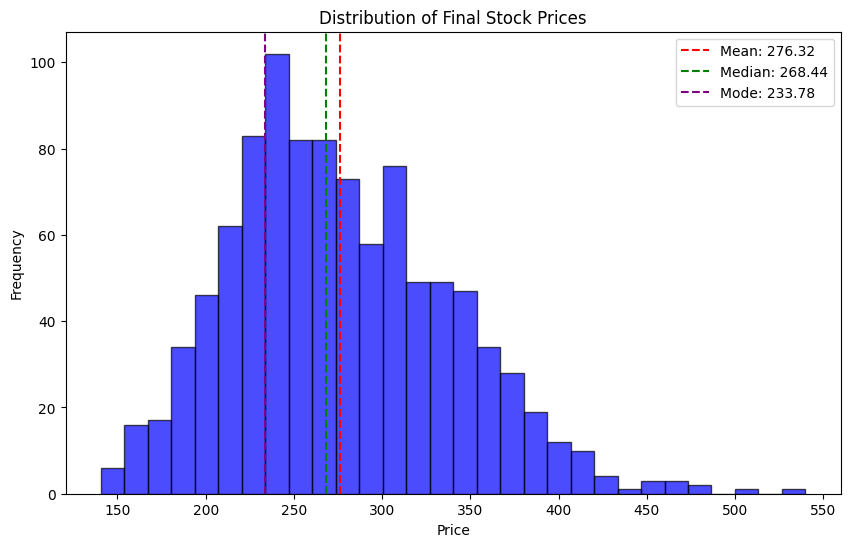

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

# Fetch Historical Data and Metrics
def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252  # Annualized mean return
    sigma = daily_returns.std() * np.sqrt(252)  # Annualized volatility
    current_price = historical_prices.iloc[-1]  # Most recent closing price
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Histogram of Final Prices
def plot_final_price_distribution(final_prices):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=30, color='blue', alpha=0.7, edgecolor='black')
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)]  # The bin with the highest frequency
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()

# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    # Fetch stock data and calculate metrics
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    # Simulate GBM
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)
    # Calculate confidence intervals
    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot historical data
    plot_historical(historical, S0)
    # Plot simulated data
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    # Plot final price distribution
    plot_final_price_distribution(final_prices)

# Parameters
ticker = "AAPL"
T = 252/252
dt = 1/252
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


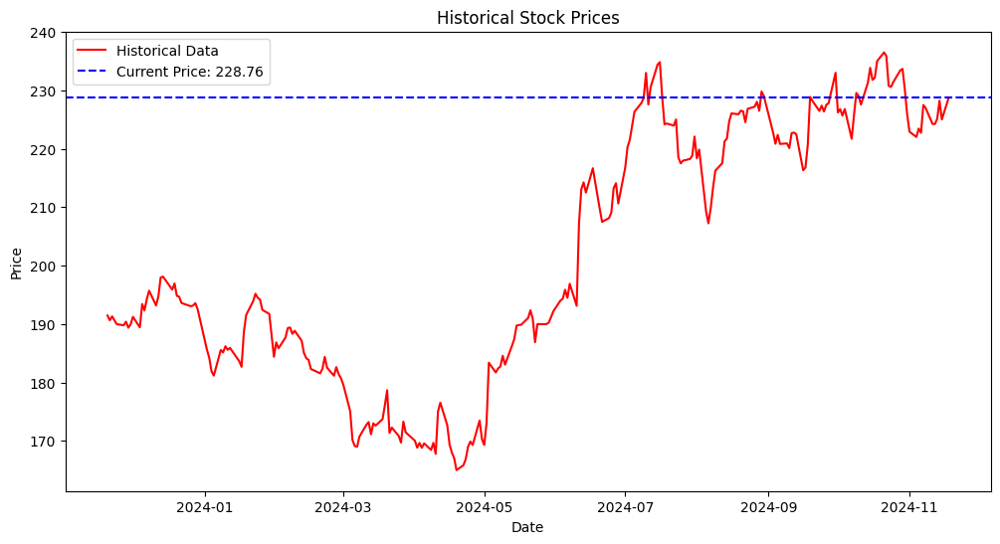

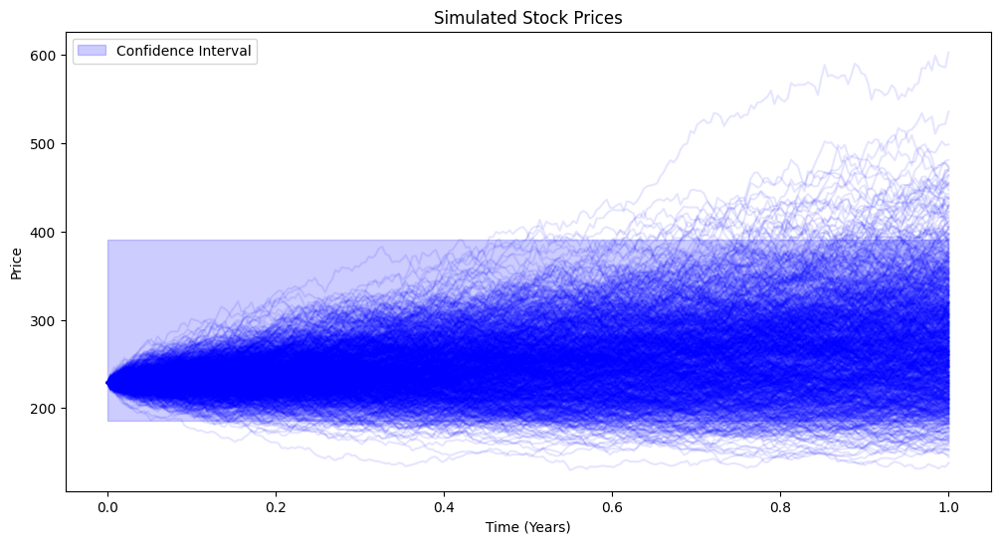

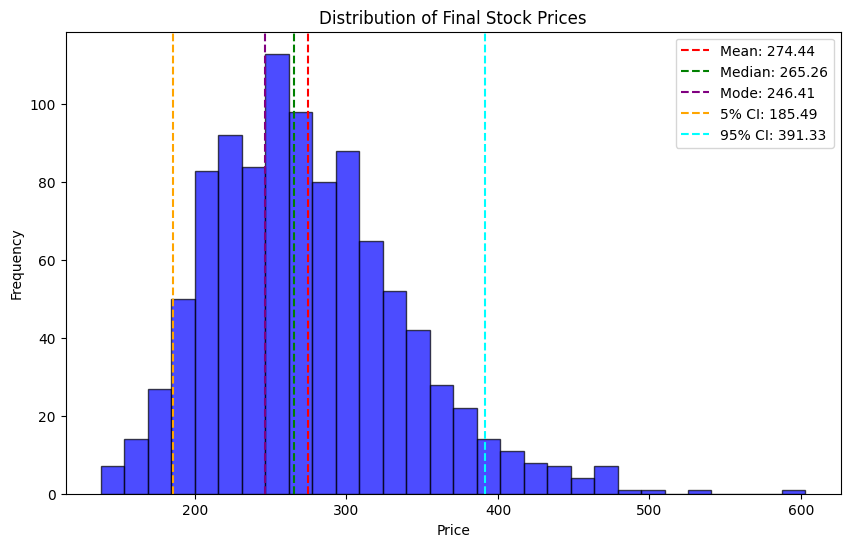

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

# Fetch Historical Data and Metrics
def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252  # Annualized mean return
    sigma = daily_returns.std() * np.sqrt(252)  # Annualized volatility
    current_price = historical_prices.iloc[-1]  # Most recent closing price
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Histogram of Final Prices
# Plot Histogram of Final Prices with Confidence Intervals
def plot_final_price_distribution(final_prices):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=30, color='blue', alpha=0.7, edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)]  # The bin with the highest frequency
    lower_bound = np.percentile(final_prices, 5)  # 5% confidence interval
    upper_bound = np.percentile(final_prices, 95)  # 95% confidence interval

    # Add vertical lines
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    # Fetch stock data and calculate metrics
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    # Simulate GBM
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)
    # Calculate confidence intervals
    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot historical data
    plot_historical(historical, S0)
    # Plot simulated data
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    # Plot final price distribution
    plot_final_price_distribution(final_prices)

# Parameters
ticker = "AAPL"
T = 252/252
dt = 1/252
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


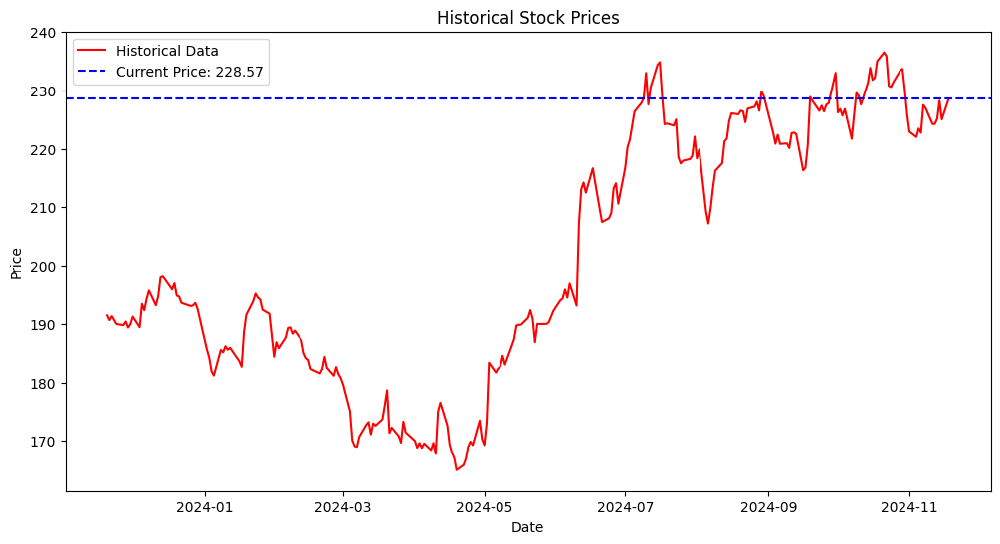

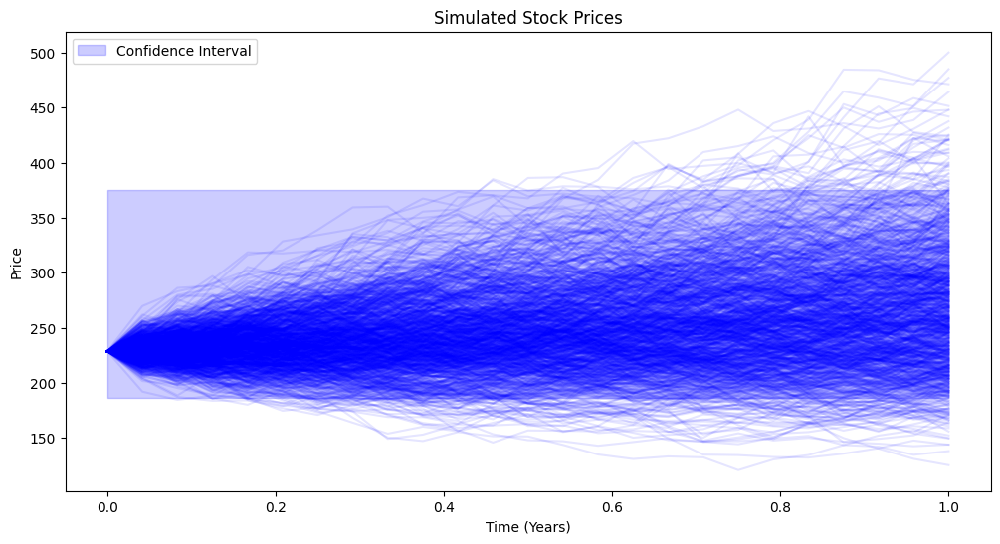

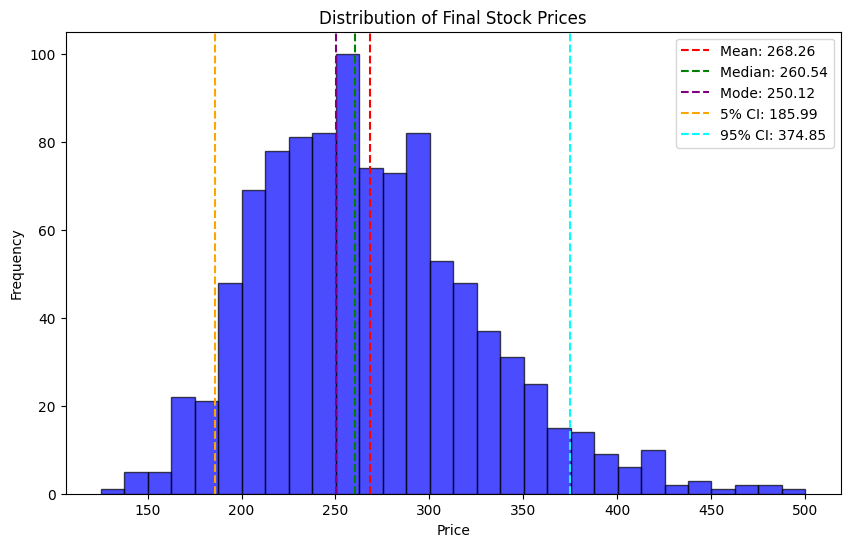

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_final_price_distribution(final_prices):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=30, color='blue', alpha=0.7, edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)]  # The bin with the highest frequency
    lower_bound = np.percentile(final_prices, 5)  # 5% confidence interval
    upper_bound = np.percentile(final_prices, 95)  # 95% confidence interval

    # Add vertical lines
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    # Fetch stock data and calculate metrics
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    # Simulate GBM
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)
    # Calculate confidence intervals
    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot historical data
    plot_historical(historical, S0)
    # Plot simulated data
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    # Plot final price distribution
    plot_final_price_distribution(final_prices)

# Parameters
ticker = "AAPL"
T = 252/252
dt = 10/252
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


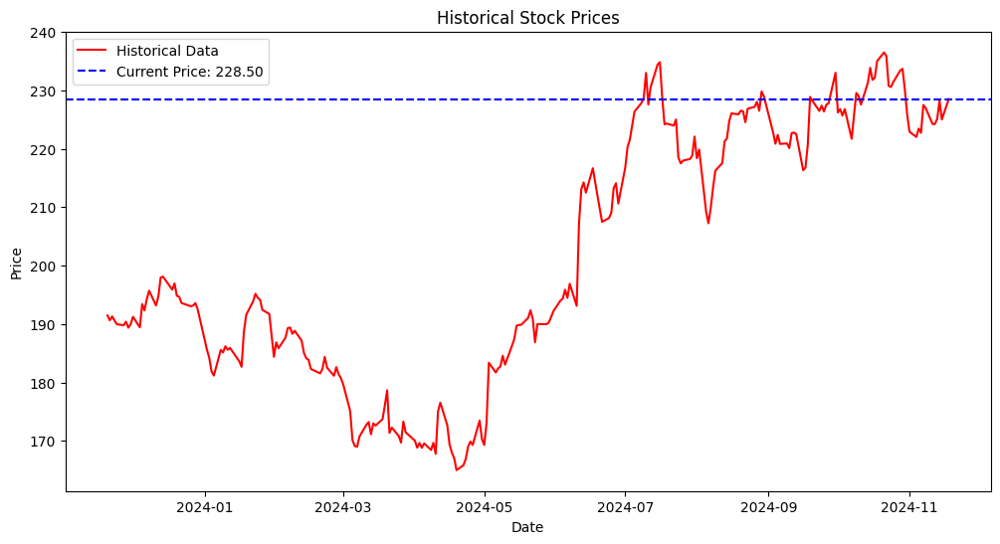

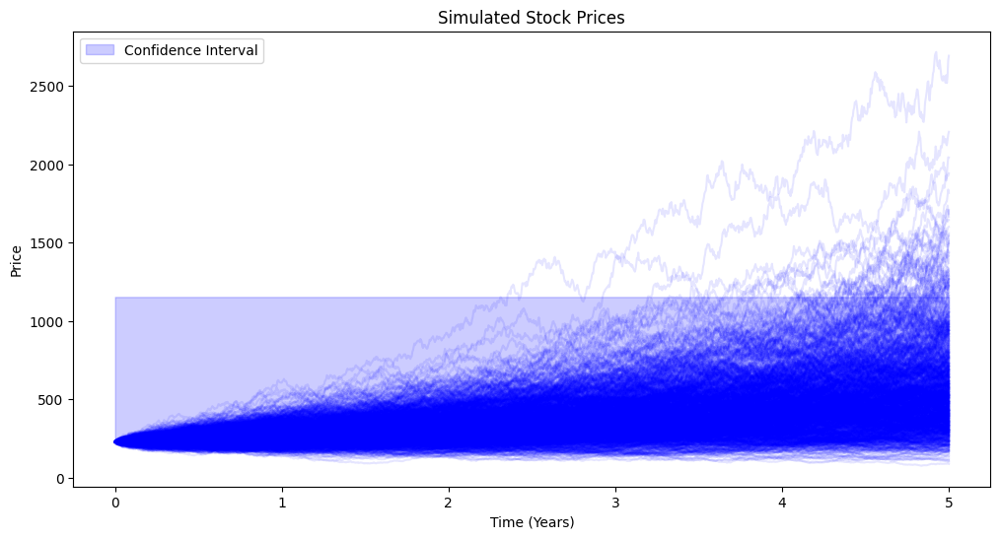

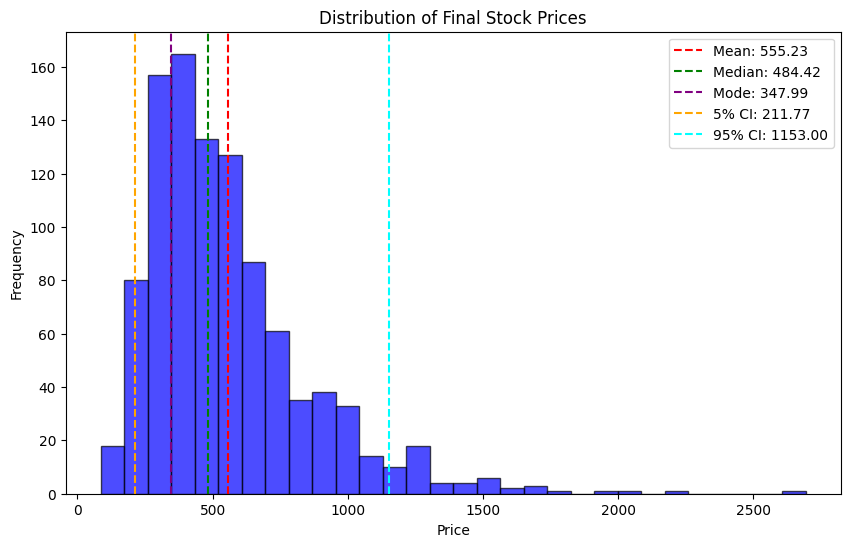

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_final_price_distribution(final_prices):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=30, color='blue', alpha=0.7, edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)]  # The bin with the highest frequency
    lower_bound = np.percentile(final_prices, 5)  # 5% confidence interval
    upper_bound = np.percentile(final_prices, 95)  # 95% confidence interval

    # Add vertical lines
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    # Fetch stock data and calculate metrics
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    # Simulate GBM
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)
    # Calculate confidence intervals
    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot historical data
    plot_historical(historical, S0)
    # Plot simulated data
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    # Plot final price distribution
    plot_final_price_distribution(final_prices)

# Parameters
ticker = "AAPL"
T = 5
dt = 1/252
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


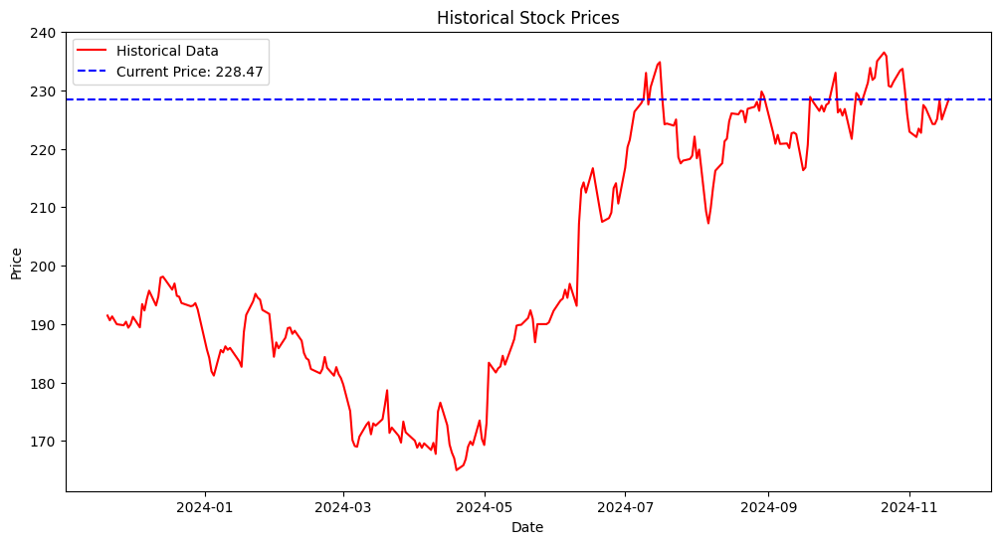

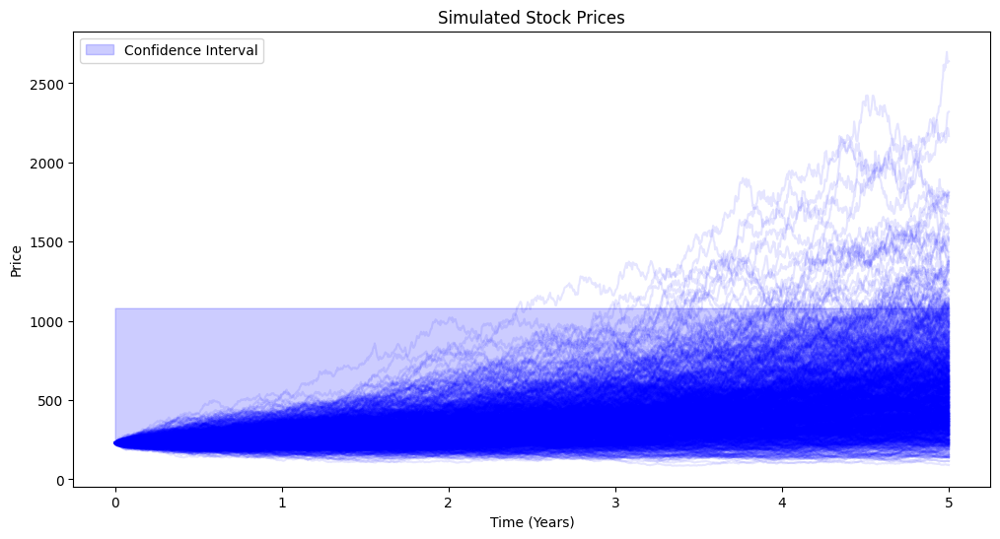

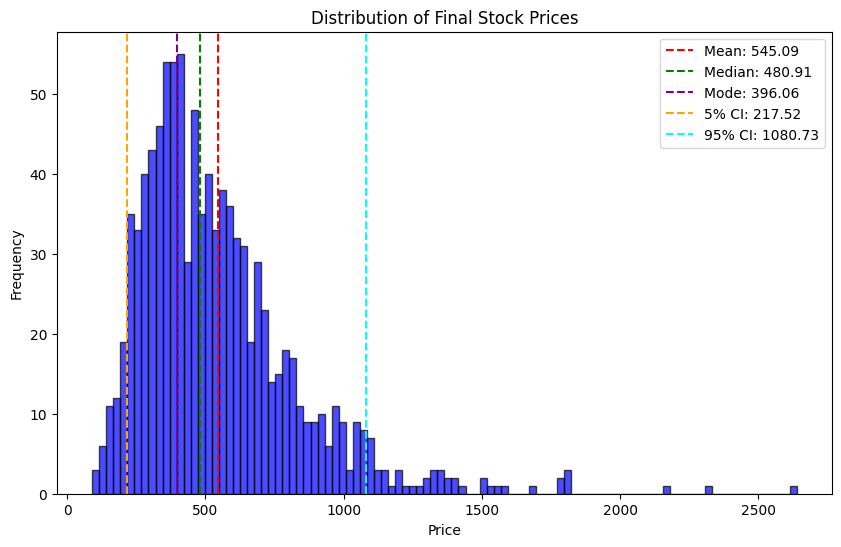

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_final_price_distribution(final_prices):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=100, color='blue', alpha=0.7, edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)] 
    lower_bound = np.percentile(final_prices, 5)  # 5% confidence interval
    upper_bound = np.percentile(final_prices, 95)  # 95% confidence interval

    # Add vertical lines
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    # Fetch stock data and calculate metrics
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    # Simulate GBM
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)
    # Calculate confidence intervals
    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot historical data
    plot_historical(historical, S0)
    # Plot simulated data
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    # Plot final price distribution
    plot_final_price_distribution(final_prices)

# Parameters
ticker = "AAPL"
T = 5
dt = 1/252
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


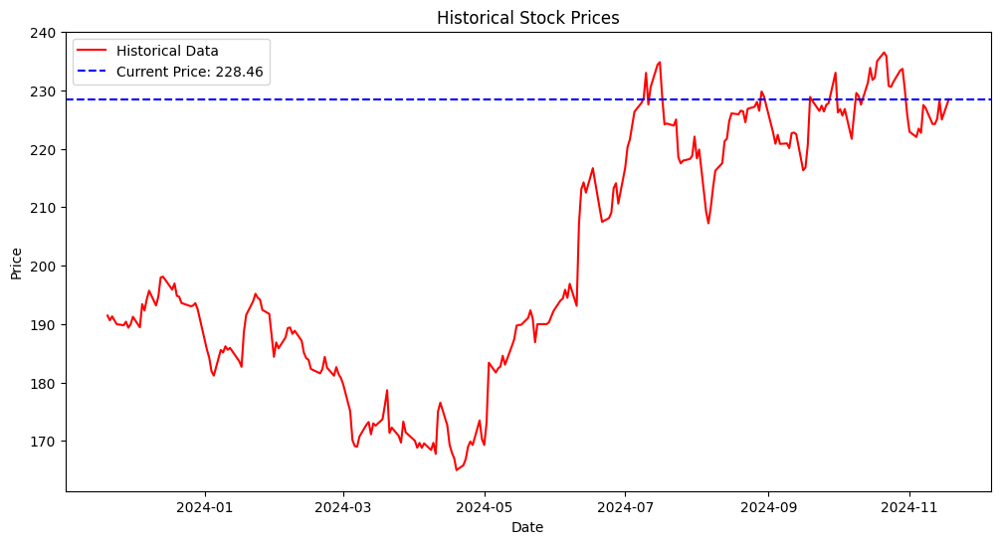

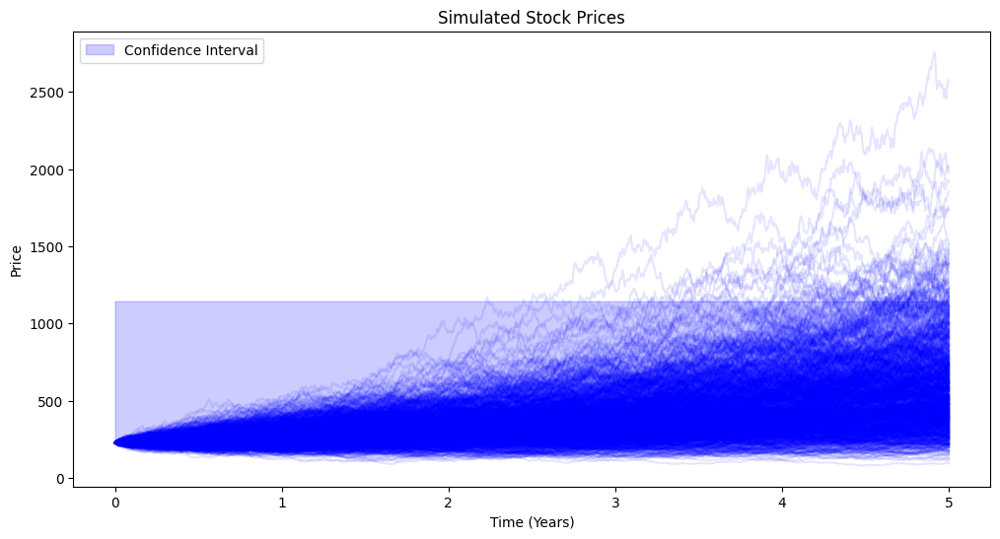

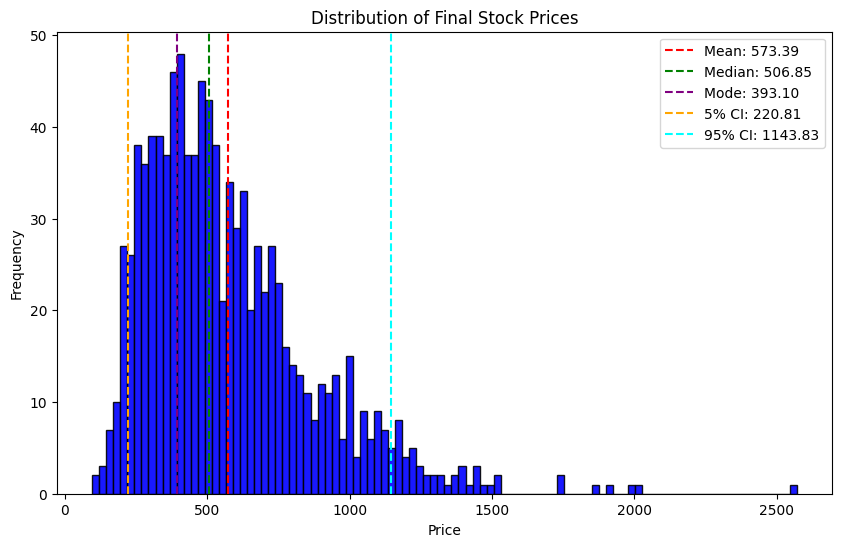

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_final_price_distribution(final_prices):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=100, color='blue', alpha=0.9, edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)] 
    lower_bound = np.percentile(final_prices, 5)  # 5% confidence interval
    upper_bound = np.percentile(final_prices, 95)  # 95% confidence interval

    # Add vertical lines
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    # Fetch stock data and calculate metrics
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    # Simulate GBM
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)
    # Calculate confidence intervals
    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot historical data
    plot_historical(historical, S0)
    # Plot simulated data
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    # Plot final price distribution
    plot_final_price_distribution(final_prices)

# Parameters
ticker = "AAPL"
T = 5
dt = 1/252
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


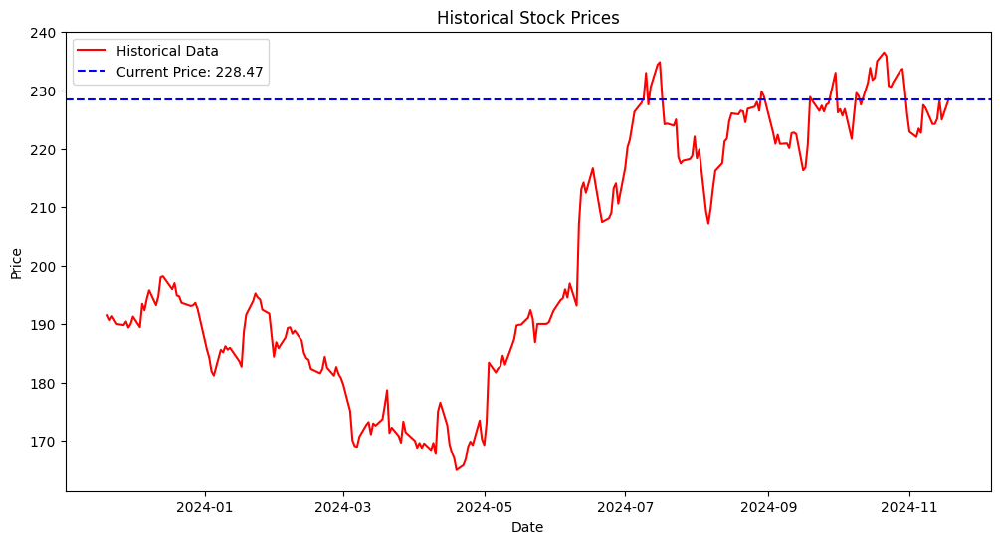

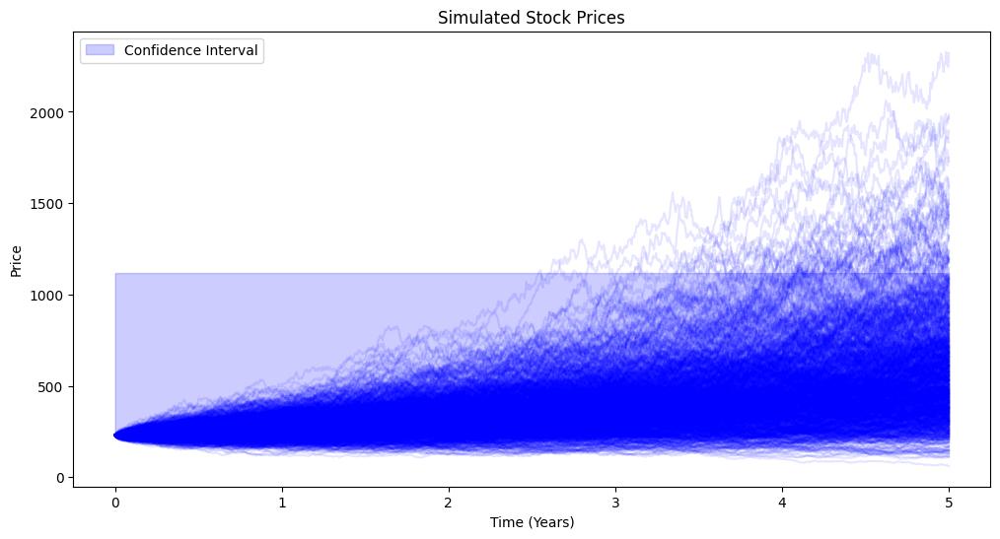

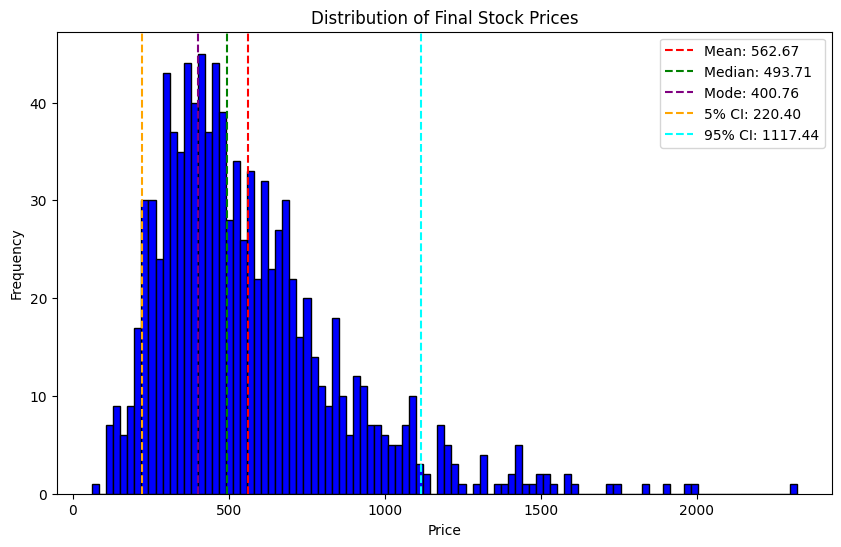

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_final_price_distribution(final_prices):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=100, color='blue', edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)] 
    lower_bound = np.percentile(final_prices, 5)  # 5% confidence interval
    upper_bound = np.percentile(final_prices, 95)  # 95% confidence interval

    # Add vertical lines
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    # Fetch stock data and calculate metrics
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    # Simulate GBM
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)
    # Calculate confidence intervals
    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot historical data
    plot_historical(historical, S0)
    # Plot simulated data
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    # Plot final price distribution
    plot_final_price_distribution(final_prices)

# Parameters
ticker = "AAPL"
T = 5
dt = 1/252
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


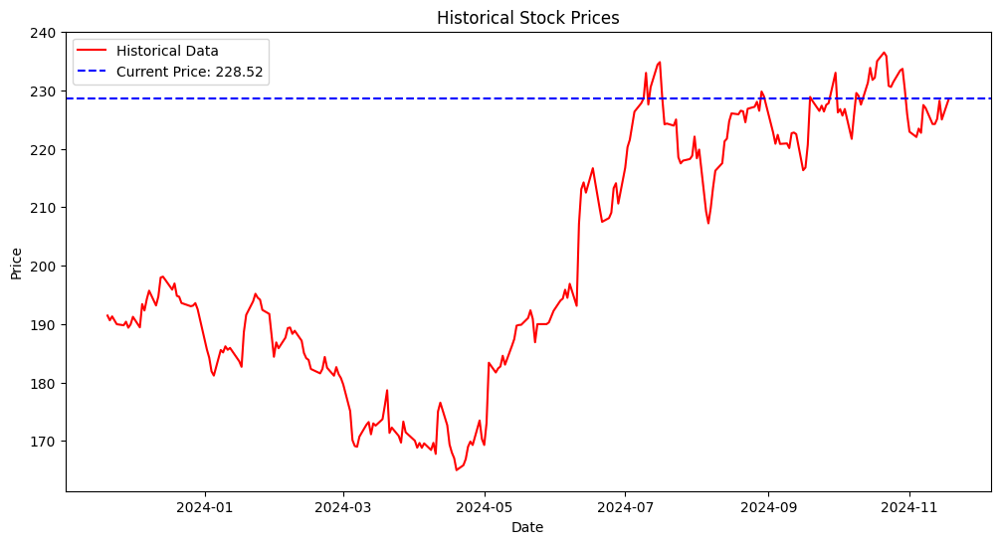

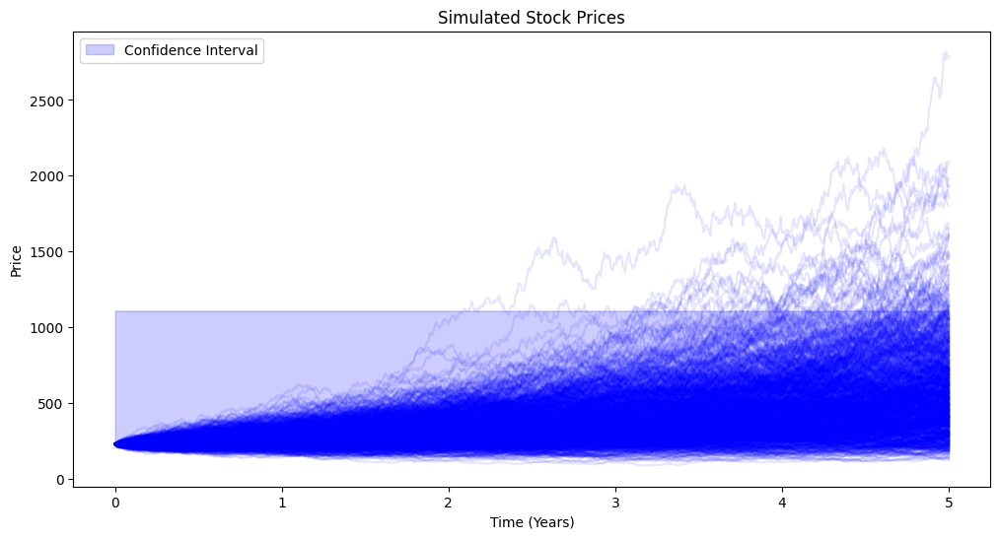

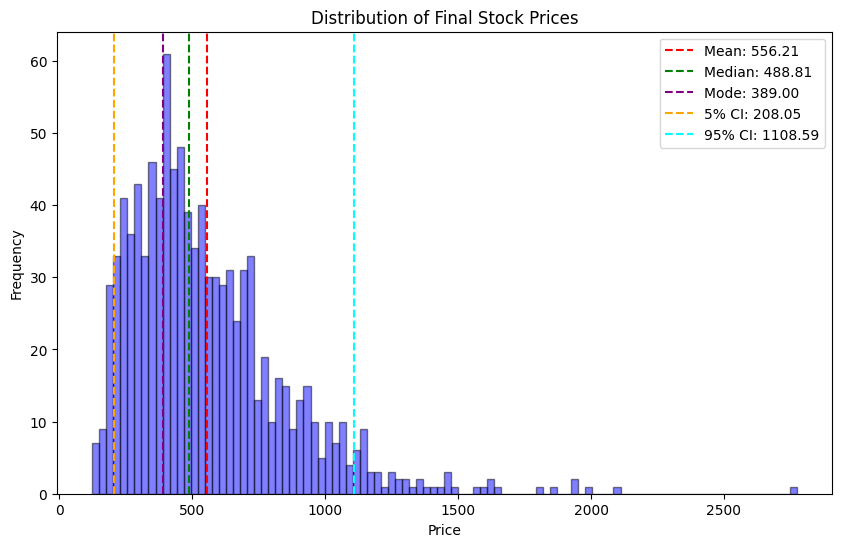

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_final_price_distribution(final_prices):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=100, color='blue', alpha=0.5, edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)] 
    lower_bound = np.percentile(final_prices, 5)  # 5% confidence interval
    upper_bound = np.percentile(final_prices, 95)  # 95% confidence interval

    # Add vertical lines
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    # Fetch stock data and calculate metrics
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    # Simulate GBM
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)
    # Calculate confidence intervals
    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot historical data
    plot_historical(historical, S0)
    # Plot simulated data
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    # Plot final price distribution
    plot_final_price_distribution(final_prices)

# Parameters
ticker = "AAPL"
T = 5
dt = 1/252
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


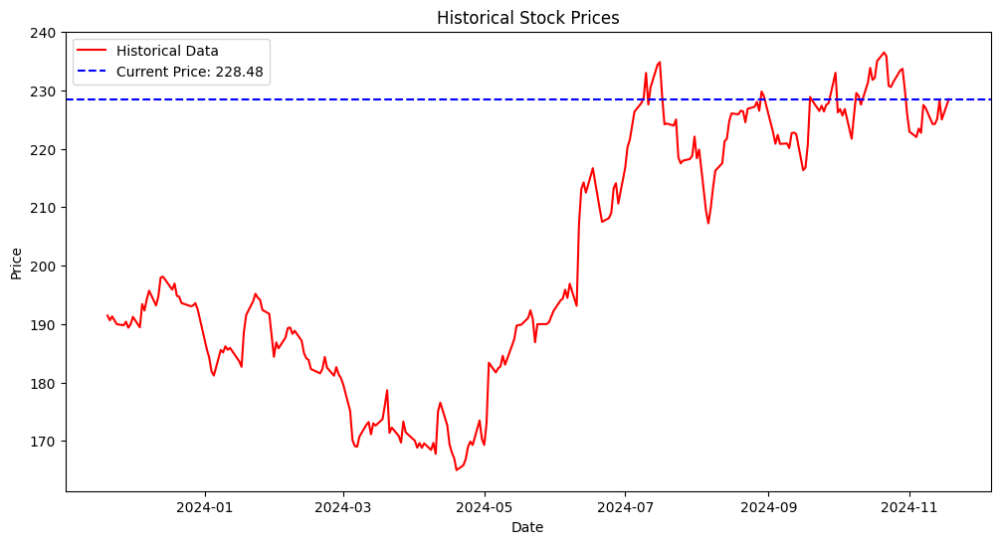

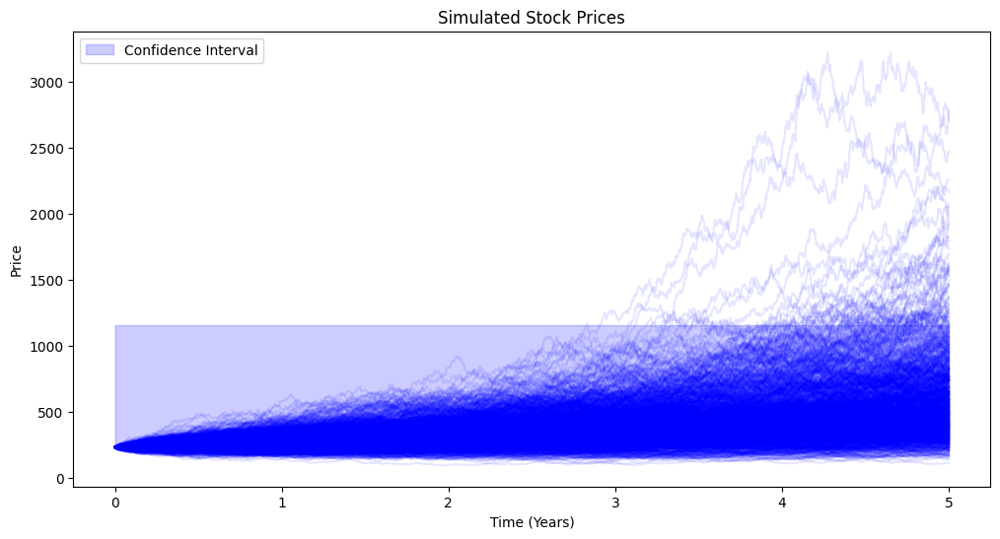

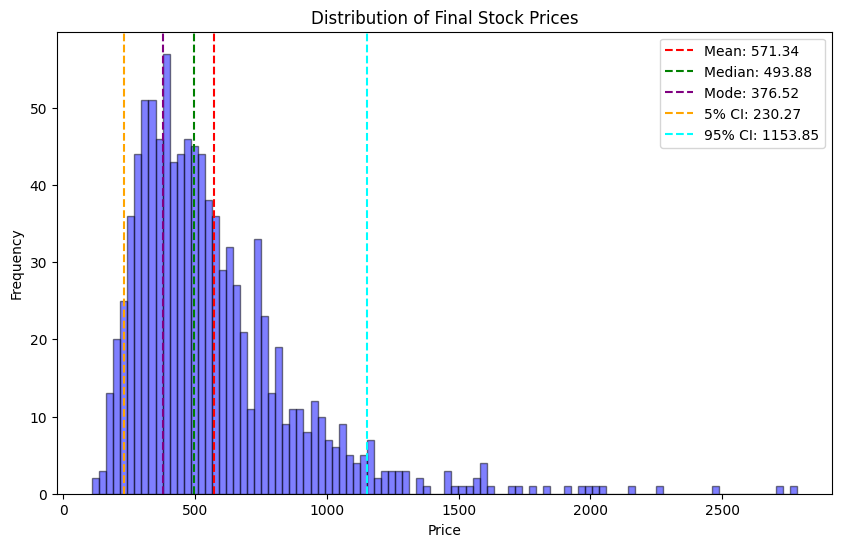

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_final_price_distribution(final_prices):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=100, color='blue', alpha=0.5, edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)] 
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)

    # Add vertical lines
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    # Fetch stock data and calculate metrics
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    # Simulate GBM
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)
    # Calculate confidence intervals
    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot historical data
    plot_historical(historical, S0)
    # Plot simulated data
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    # Plot final price distribution
    plot_final_price_distribution(final_prices)

# Parameters
ticker = "AAPL"
T = 5
dt = 1/252
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


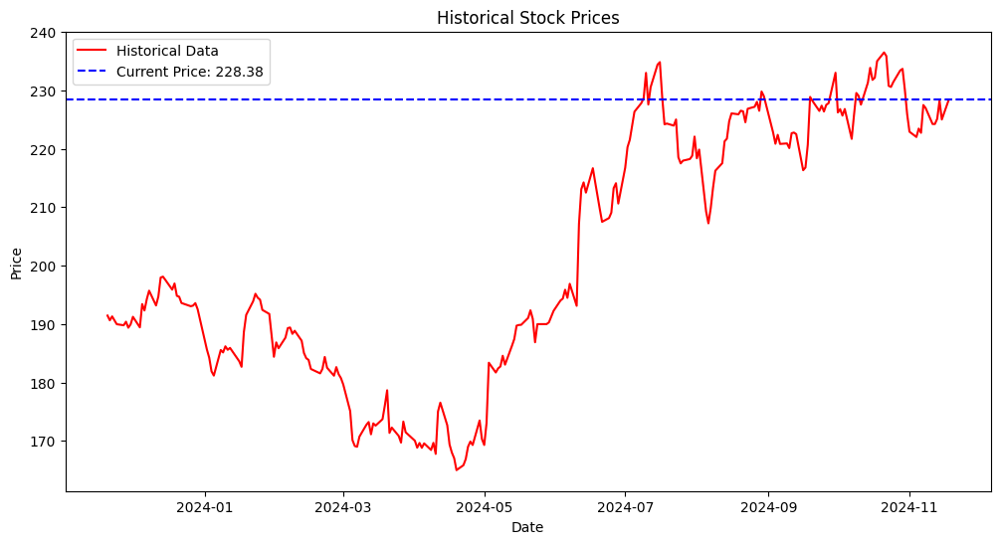

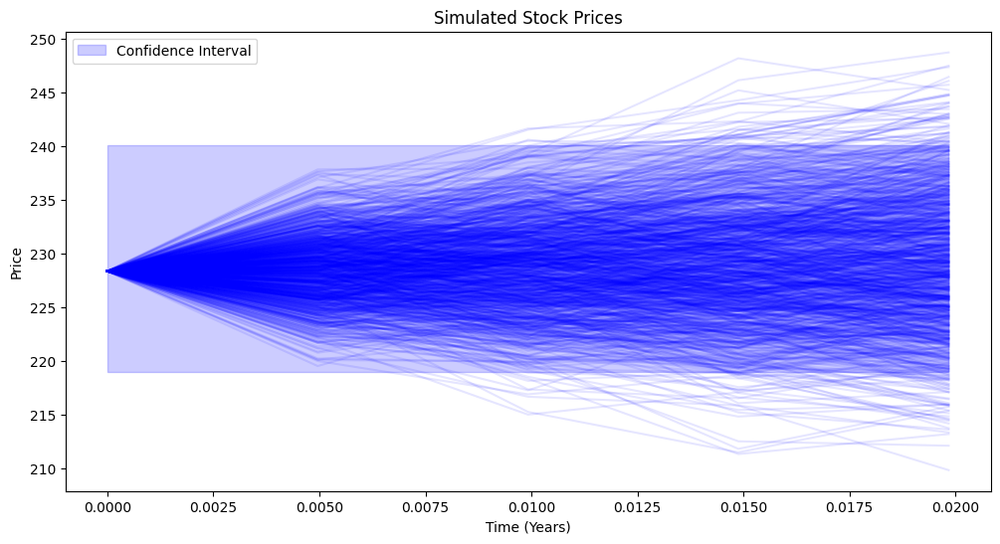

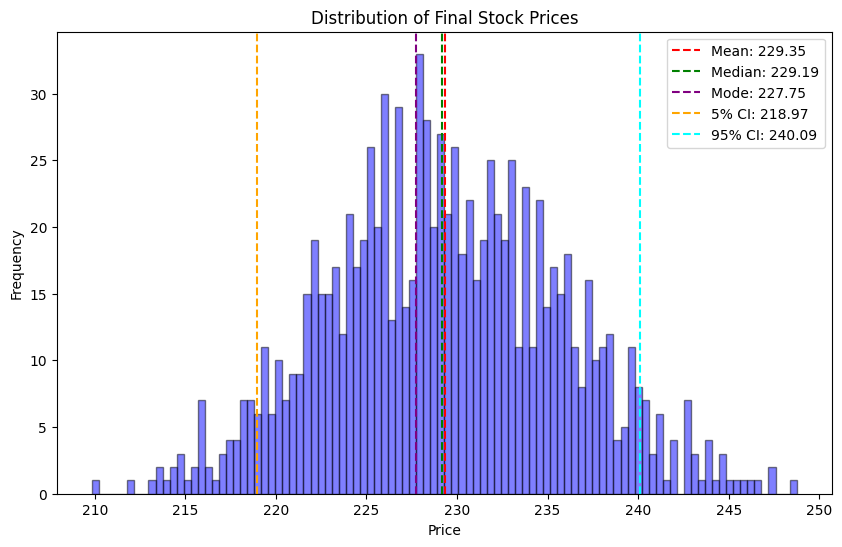

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_final_price_distribution(final_prices):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=100, color='blue', alpha=0.5, edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)] 
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)

    # Add vertical lines
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)

    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot Charts
    plot_historical(historical, S0)
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    plot_final_price_distribution(final_prices)

# Parameters
ticker = "AAPL"
T = 5/252
dt = 1/252
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


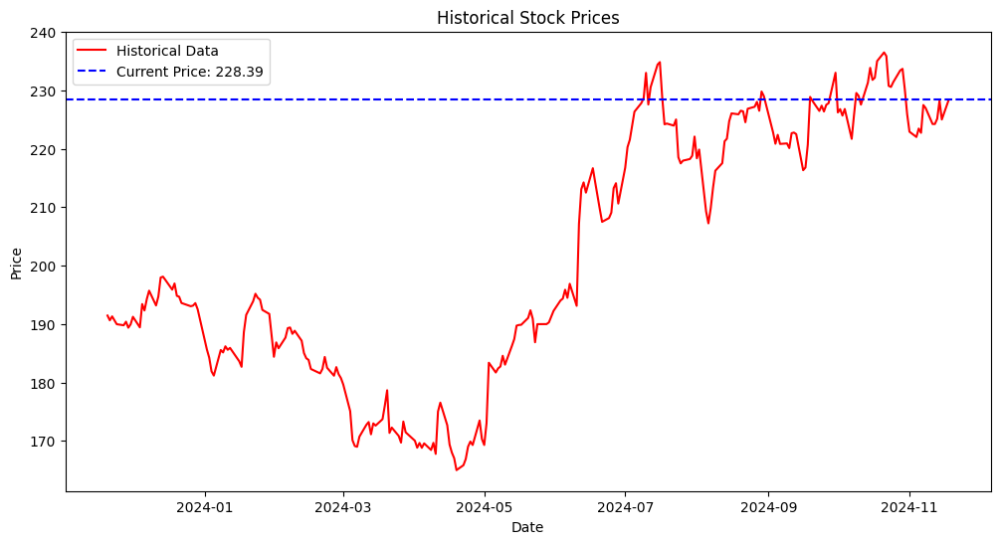

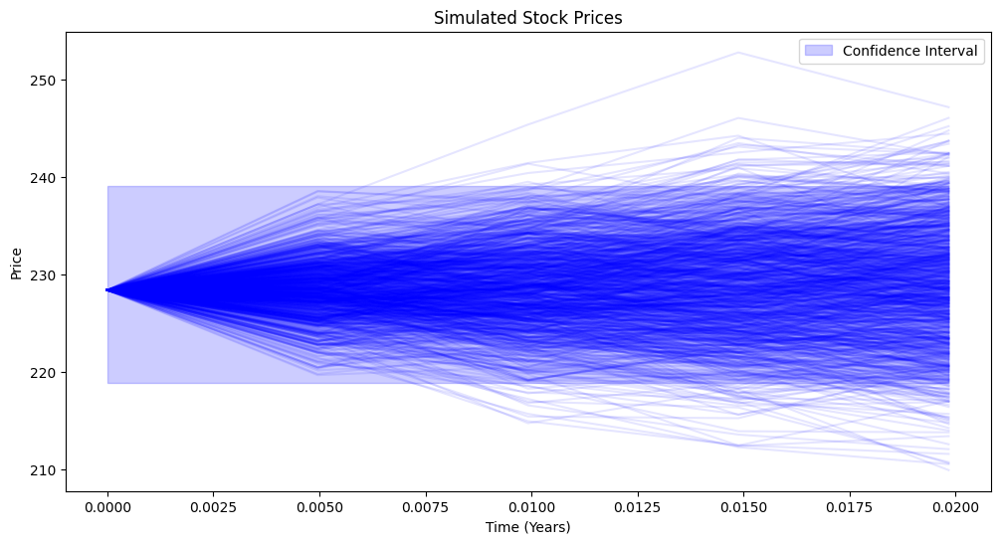

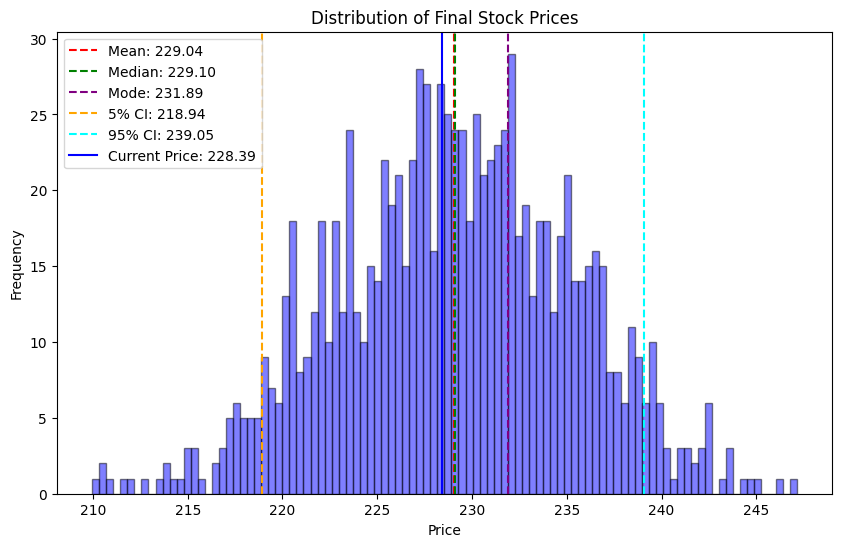

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_final_price_distribution(final_prices, current_price):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=100, color='blue', alpha=0.5, edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)] 
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)

    # Add vertical lines
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    plt.axvline(current_price, color='blue', linestyle='-', label=f'Current Price: {current_price:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)

    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot Charts
    plot_historical(historical, S0)
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    plot_final_price_distribution(final_prices, S0)

# Parameters
ticker = "AAPL"
T = 5/252
dt = 1/252
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_final_price_distribution(final_prices, current_price):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=100, color='blue', alpha=0.5, edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)] 
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)

    # Add vertical lines
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    plt.axvline(current_price, color='blue', linestyle='-', label=f'Current Price: {current_price:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)

    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot Charts
    plot_historical(historical, S0)
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    plot_final_price_distribution(final_prices, S0)

# Parameters
ticker = "AAPL"
T = 0.5/252
dt = 1/252
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


IndexError: index 0 is out of bounds for axis 0 with size 0

[*********************100%%**********************]  1 of 1 completed


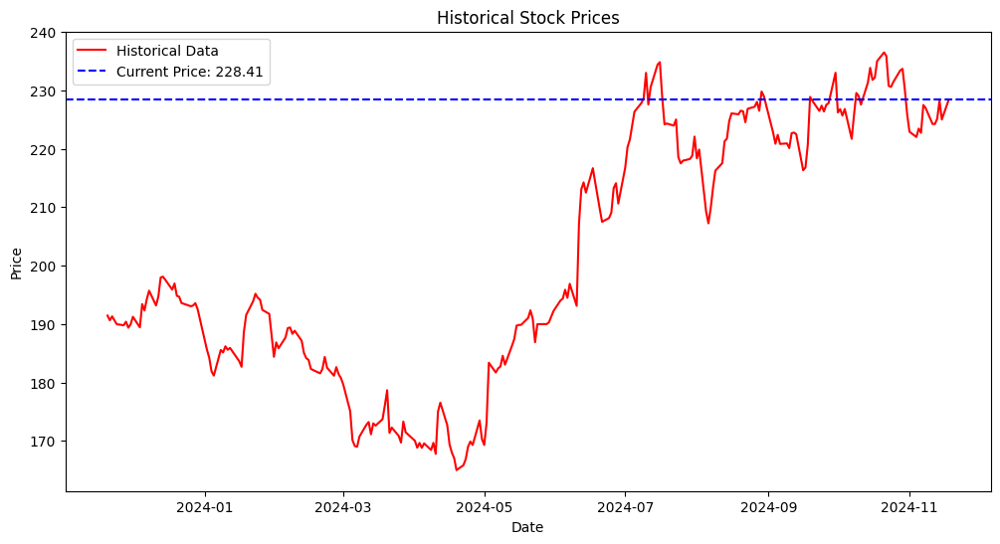

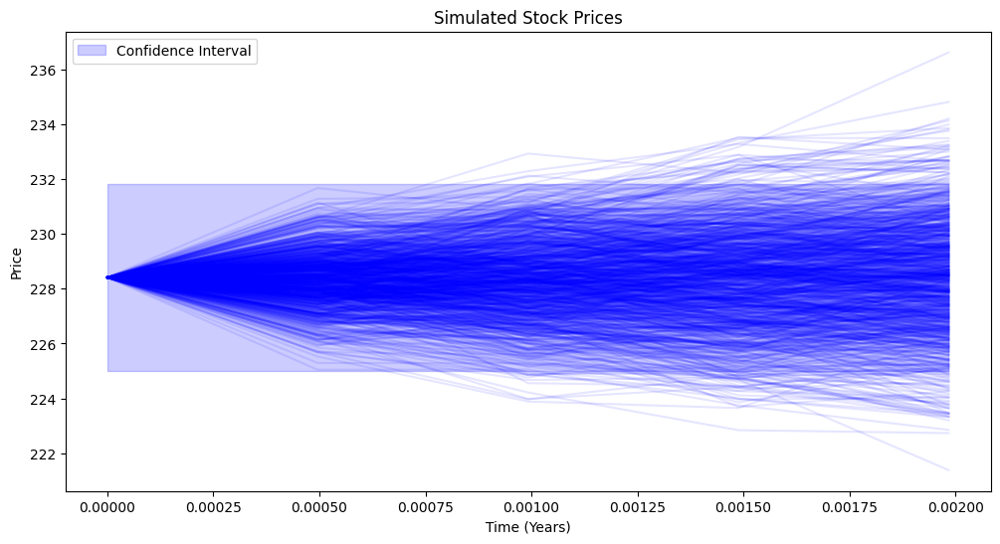

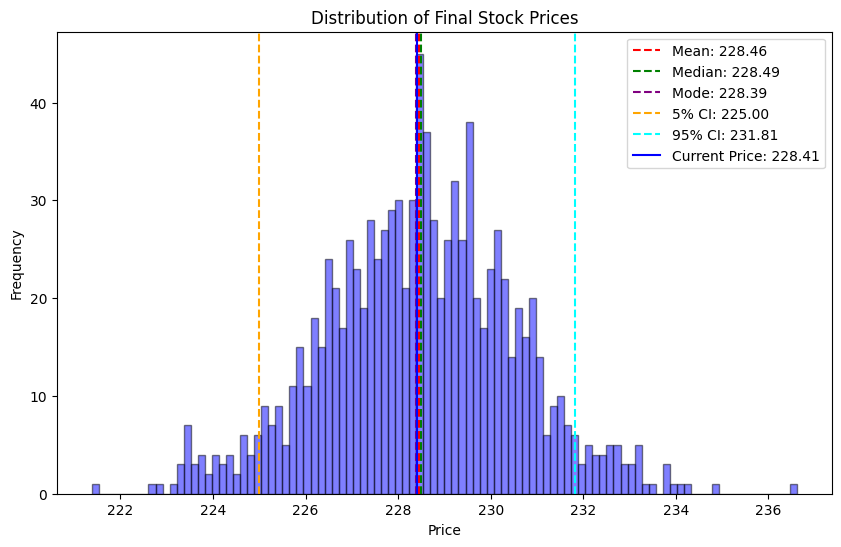

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_final_price_distribution(final_prices, current_price):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=100, color='blue', alpha=0.5, edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)] 
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)

    # Add vertical lines
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    plt.axvline(current_price, color='blue', linestyle='-', label=f'Current Price: {current_price:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)

    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot Charts
    plot_historical(historical, S0)
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    plot_final_price_distribution(final_prices, S0)

# Parameters
ticker = "AAPL"
T = 0.5/252
dt = 1/2520
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


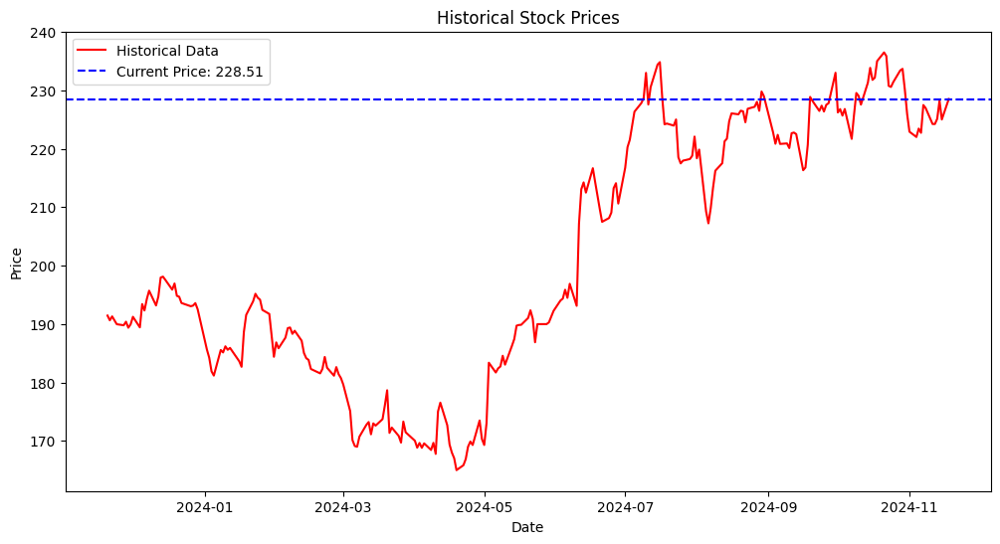

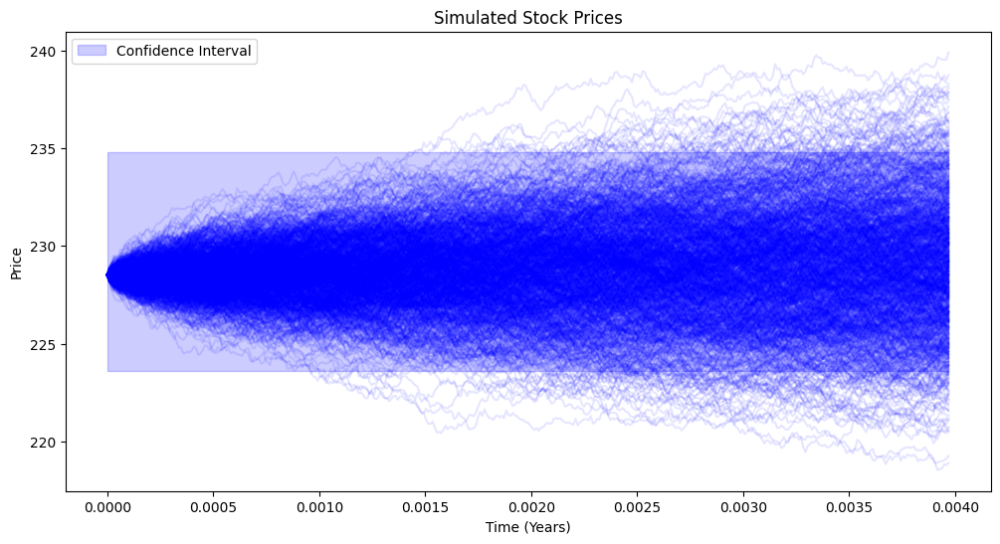

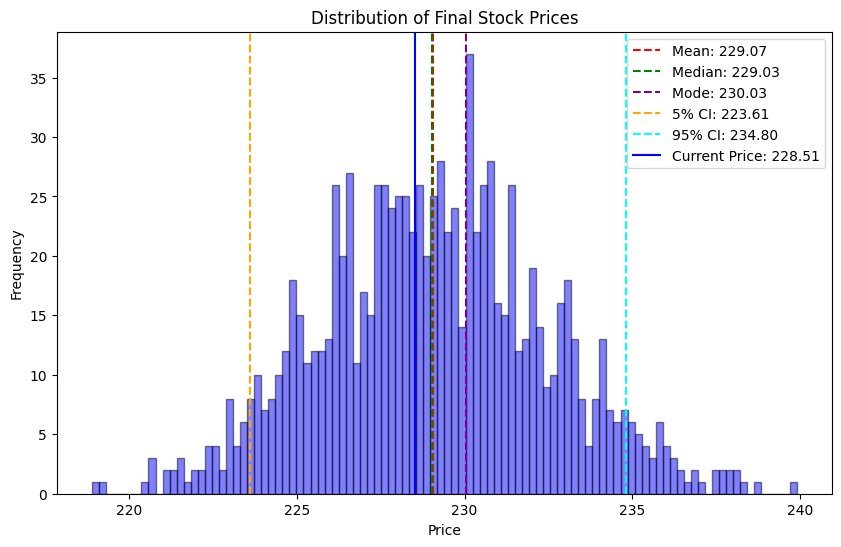

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_final_price_distribution(final_prices, current_price):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=100, color='blue', alpha=0.5, edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)] 
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)

    # Add vertical lines
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    plt.axvline(current_price, color='blue', linestyle='-', label=f'Current Price: {current_price:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)

    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot Charts
    plot_historical(historical, S0)
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    plot_final_price_distribution(final_prices, S0)

# Parameters
ticker = "AAPL"
T = 1/252 #one day
dt = 1/98280 #number of minutes the stock market is open
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


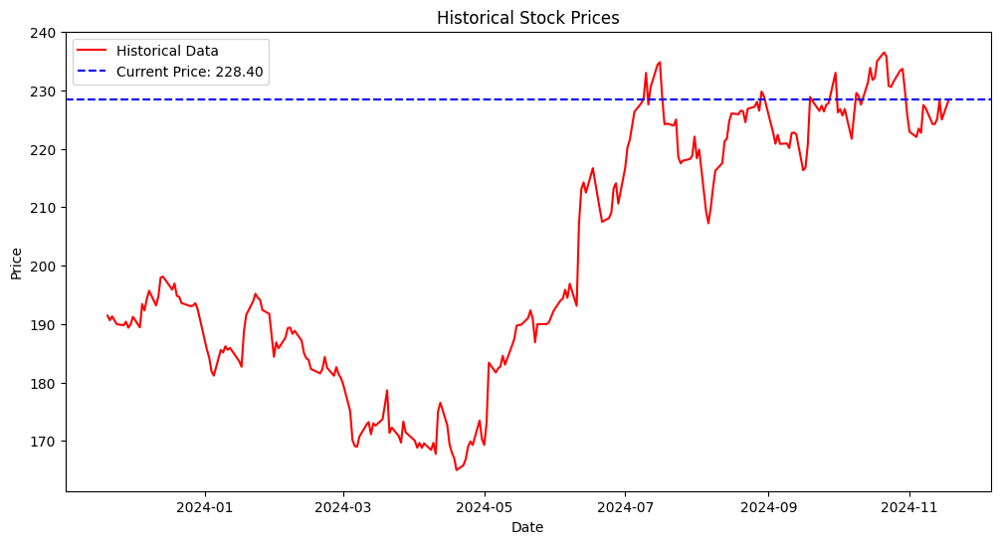

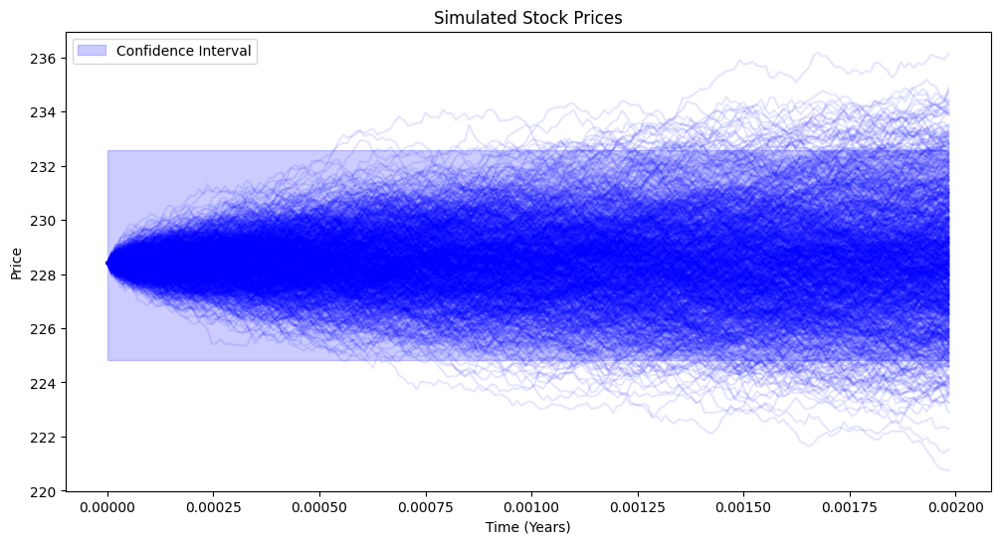

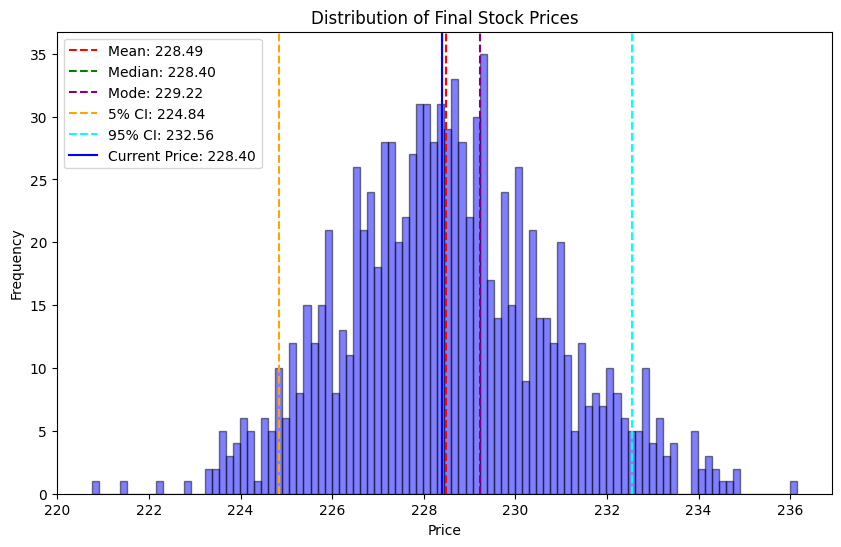

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_final_price_distribution(final_prices, current_price):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=100, color='blue', alpha=0.5, edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)] 
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)

    # Add vertical lines
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    plt.axvline(current_price, color='blue', linestyle='-', label=f'Current Price: {current_price:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)

    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot Charts
    plot_historical(historical, S0)
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    plot_final_price_distribution(final_prices, S0)

# Parameters
ticker = "AAPL"
T = 0.5/252 #one day
dt = 1/98280 #number of minutes the stock market is open
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


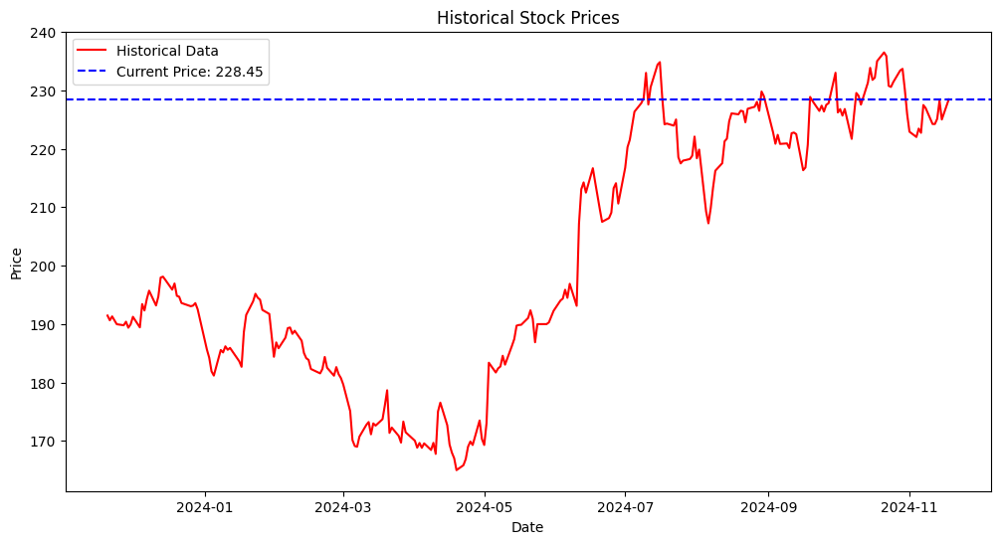

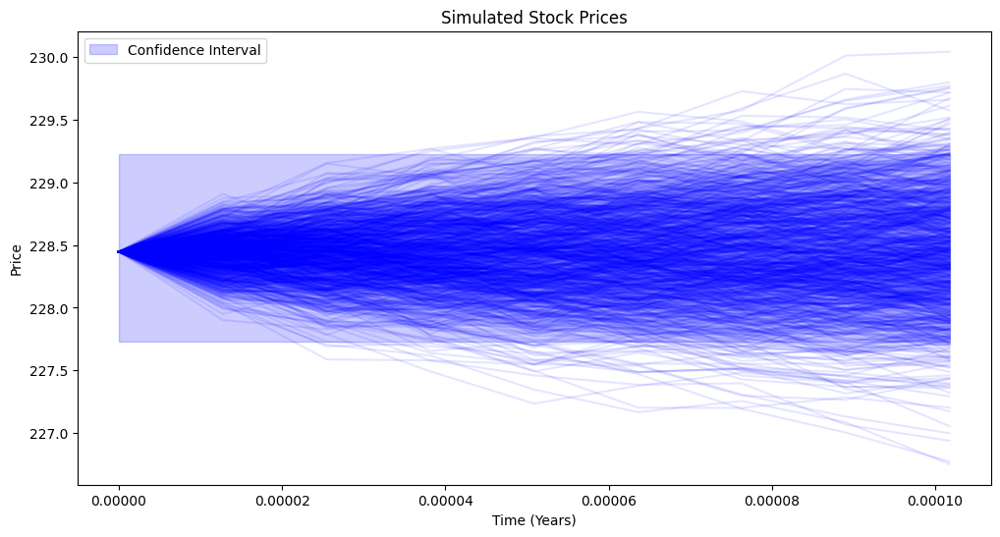

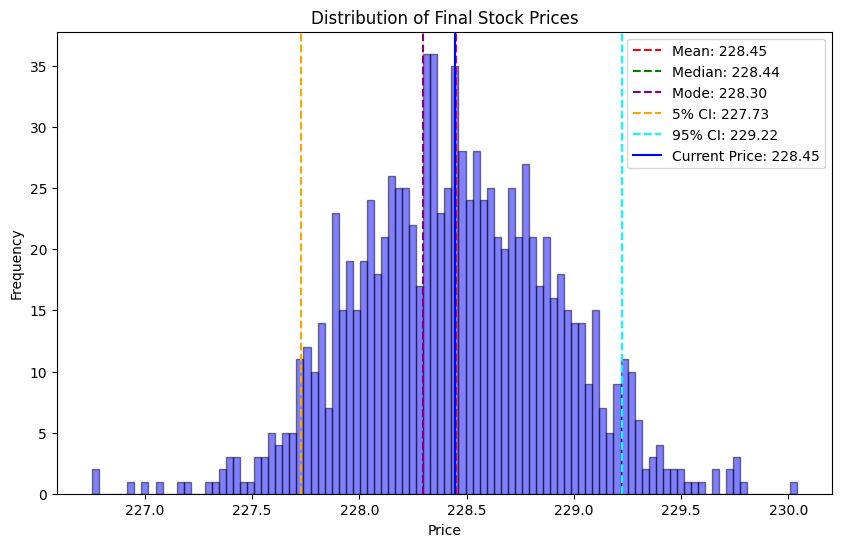

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_final_price_distribution(final_prices, current_price):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=100, color='blue', alpha=0.5, edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)] 
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)

    # Add vertical lines
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    plt.axvline(current_price, color='blue', linestyle='-', label=f'Current Price: {current_price:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)

    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot Charts
    plot_historical(historical, S0)
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    plot_final_price_distribution(final_prices, S0)

# Parameters
ticker = "AAPL"
T = 10/98280 #one day
dt = 1/98280 #number of minutes the stock market is open
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


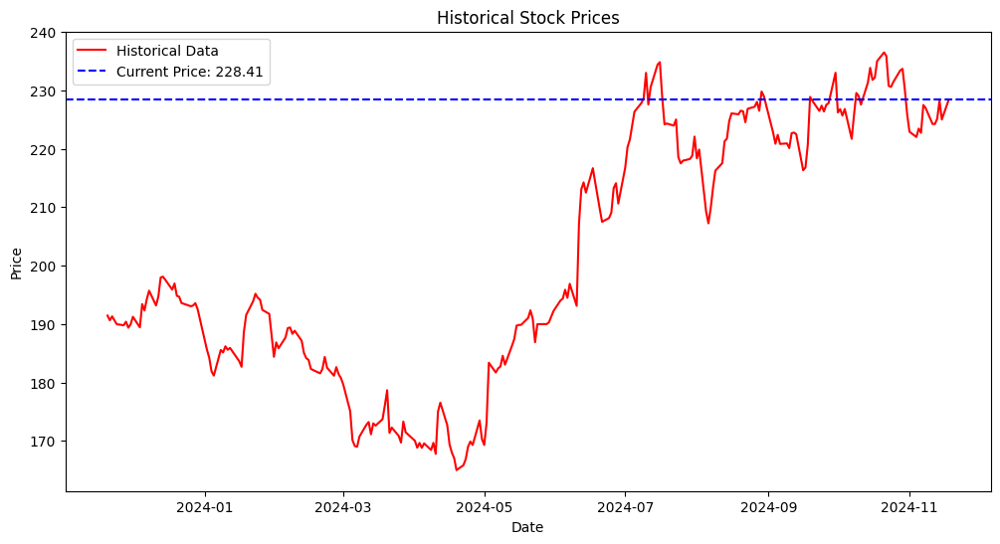

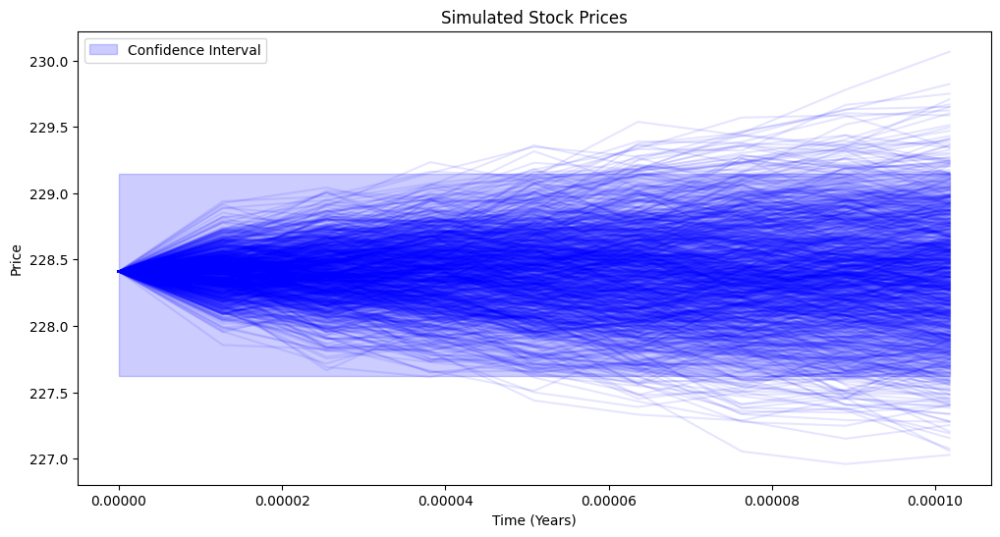

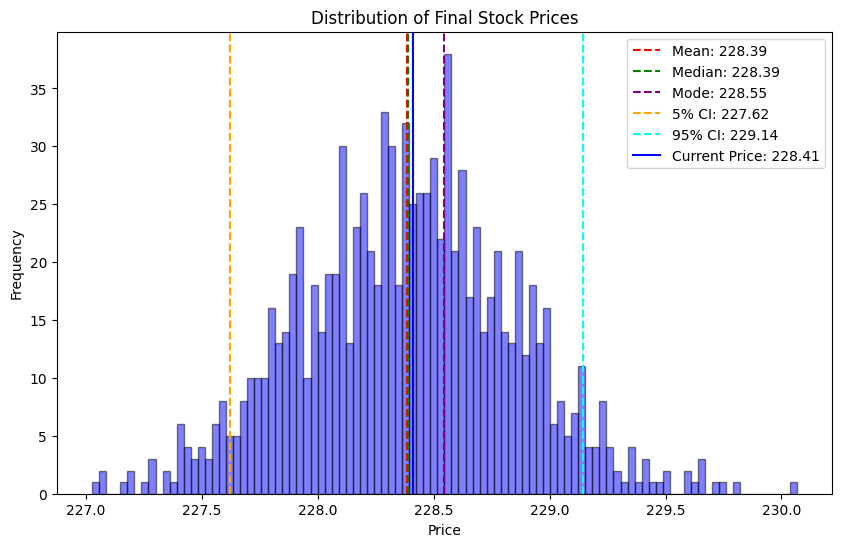

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_final_price_distribution(final_prices, current_price):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=100, color='blue', alpha=0.5, edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)] 
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)

    # Add vertical lines
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    plt.axvline(current_price, color='blue', linestyle='-', label=f'Current Price: {current_price:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)

    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot Charts
    plot_historical(historical, S0)
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    plot_final_price_distribution(final_prices, S0)

# Parameters
ticker = "AAPL"
T = 10/98280 #10 minutes
dt = 1/98280 #number of minutes the stock market is open
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


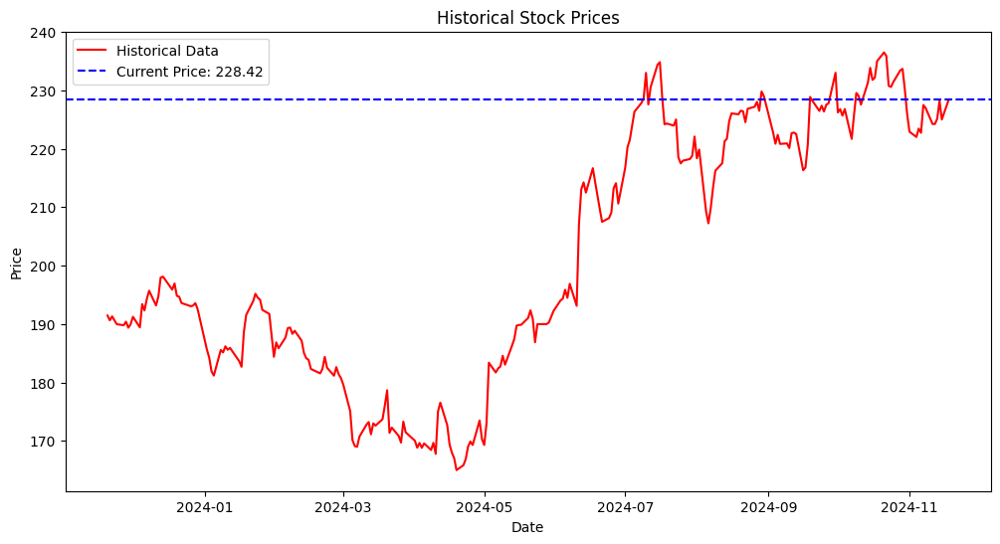

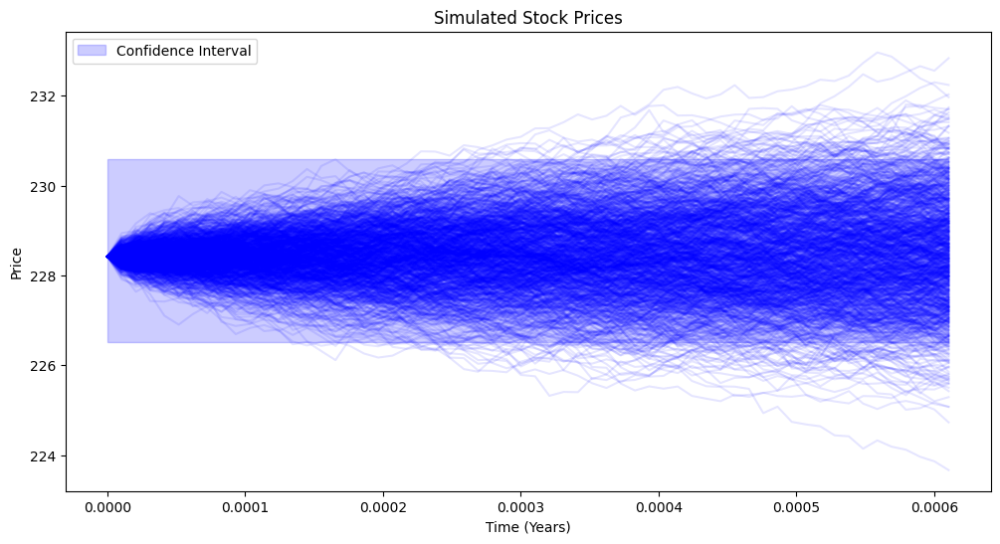

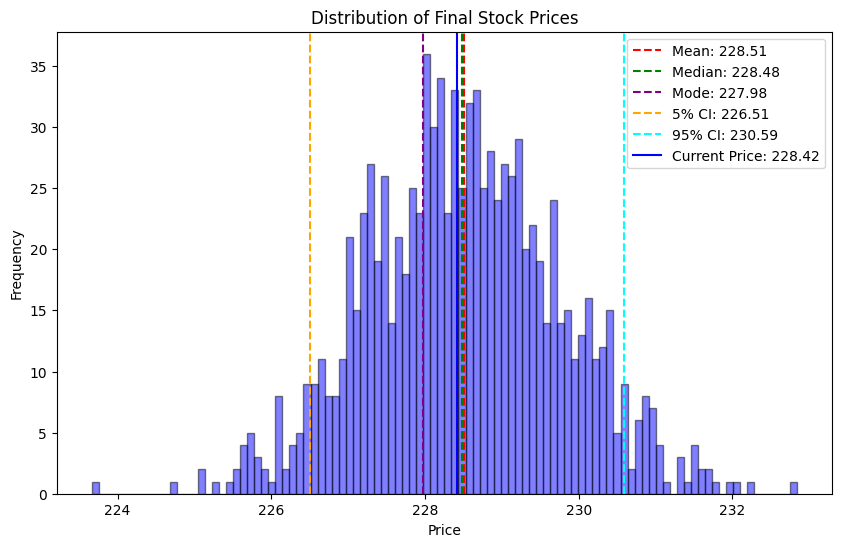

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    # Calculate daily returns
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

# Plot Historical Data
def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

# Plot Simulated Data
def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_final_price_distribution(final_prices, current_price):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=100, color='blue', alpha=0.5, edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)] 
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)

    # Add vertical lines
    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    plt.axvline(current_price, color='blue', linestyle='-', label=f'Current Price: {current_price:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)

    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot Charts
    plot_historical(historical, S0)
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    plot_final_price_distribution(final_prices, S0)

# Parameters
ticker = "AAPL"
T = 60/98280 #60 minutes
dt = 1/98280 #number of minutes the stock market is open
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


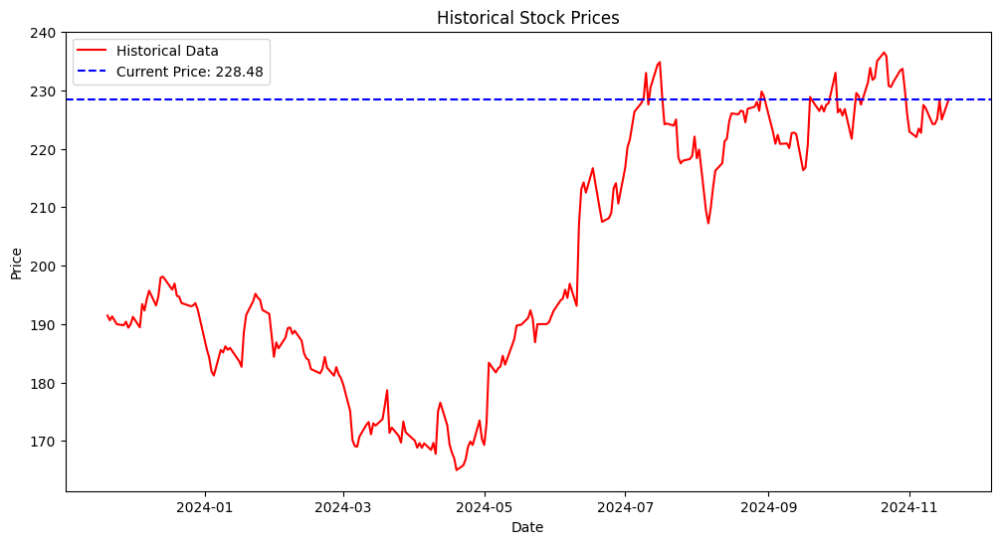

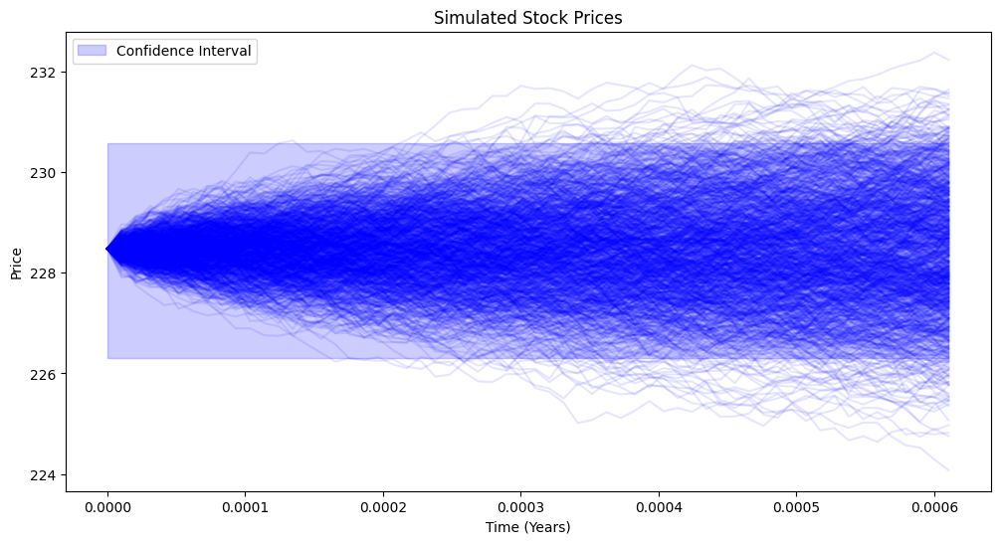

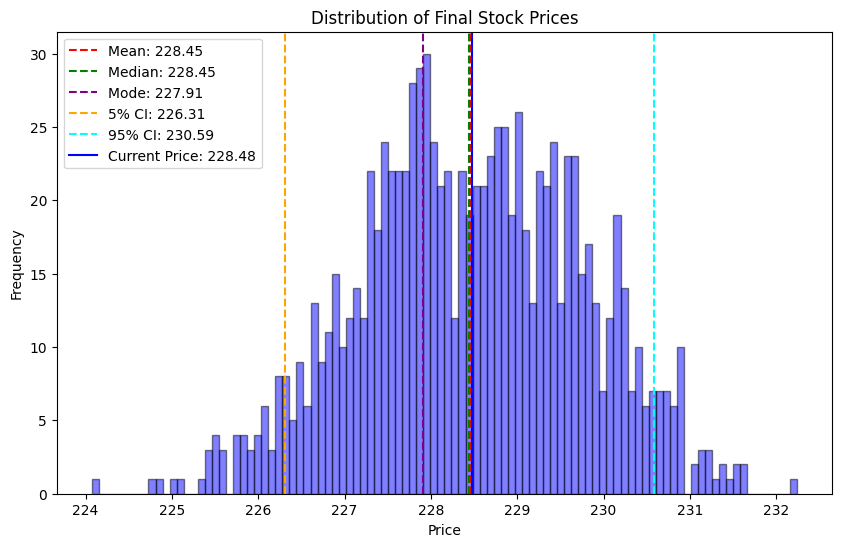

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_final_price_distribution(final_prices, current_price):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=100, color='blue', alpha=0.5, edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)] 
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)

    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    plt.axvline(current_price, color='blue', linestyle='-', label=f'Current Price: {current_price:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)

    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot Charts
    plot_historical(historical, S0)
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    plot_final_price_distribution(final_prices, S0)

# Parameters
ticker = "AAPL"
T = 60/98280 #60 minutes
dt = 1/98280 #number of minutes the stock market is open
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


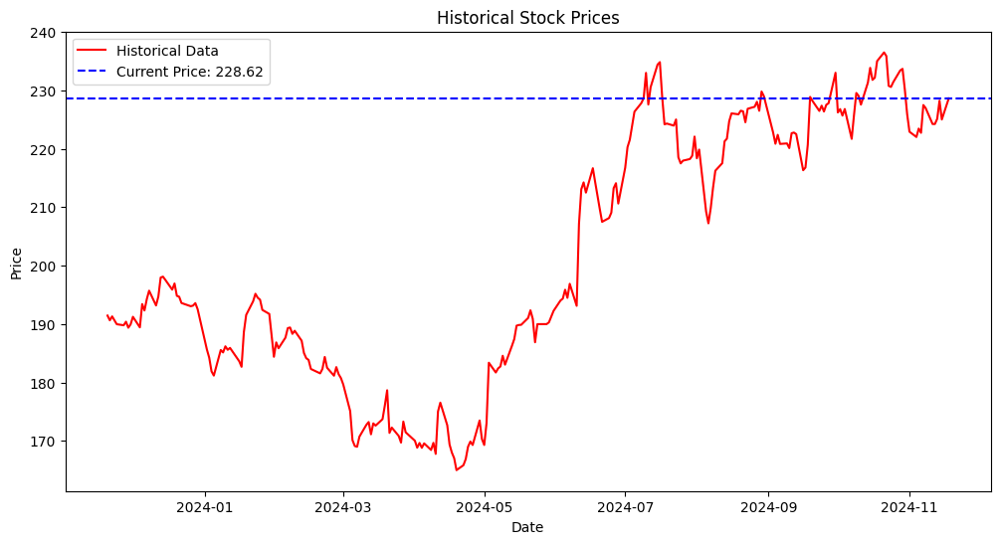

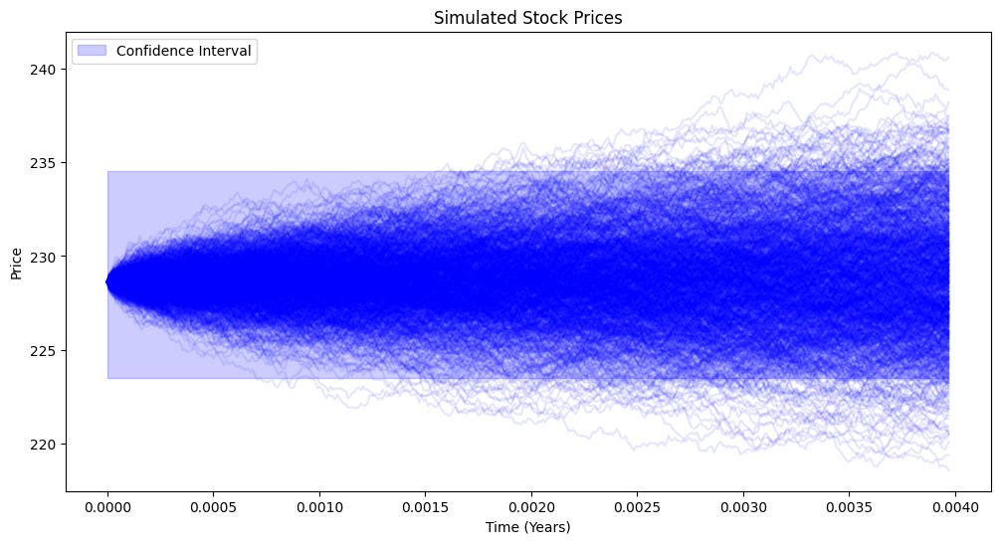

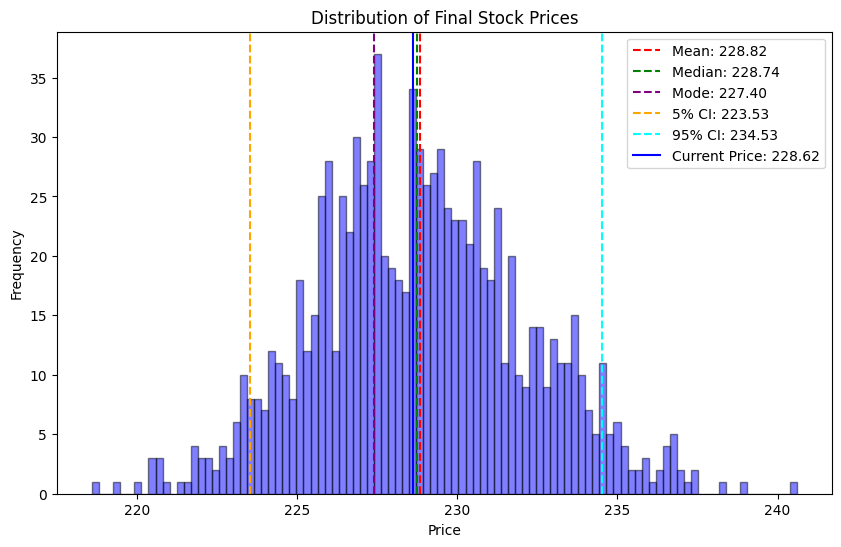

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_final_price_distribution(final_prices, current_price):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=100, color='blue', alpha=0.5, edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)] 
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)

    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    plt.axvline(current_price, color='blue', linestyle='-', label=f'Current Price: {current_price:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)

    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot Charts
    plot_historical(historical, S0)
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    plot_final_price_distribution(final_prices, S0)

# Parameters
ticker = "AAPL"
T = 390/98280 #60 minutes
dt = 1/98280 #number of minutes the stock market is open
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


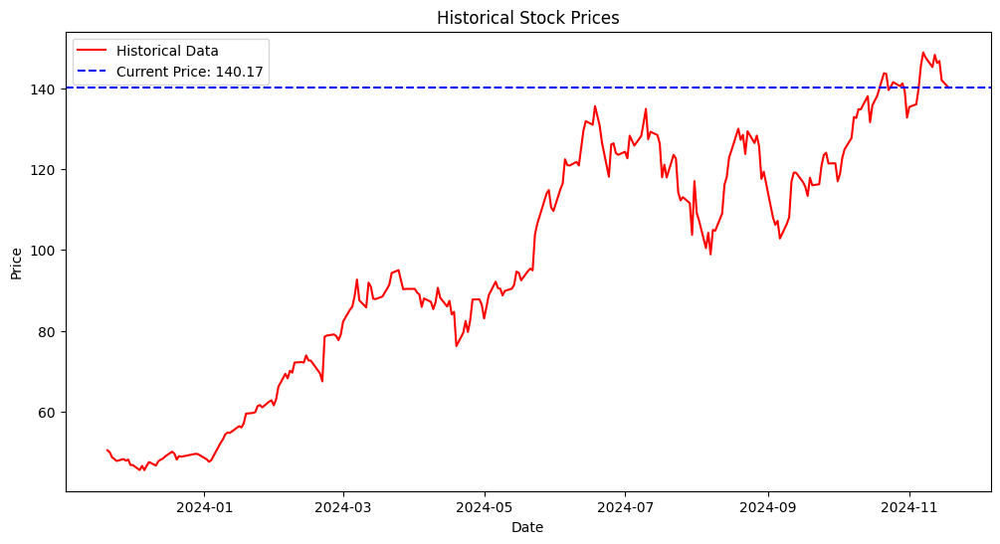

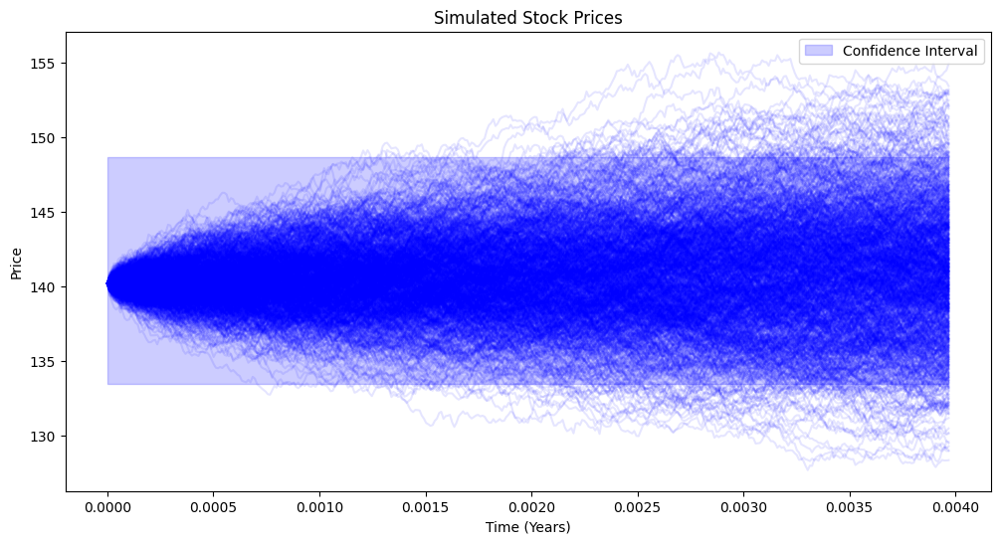

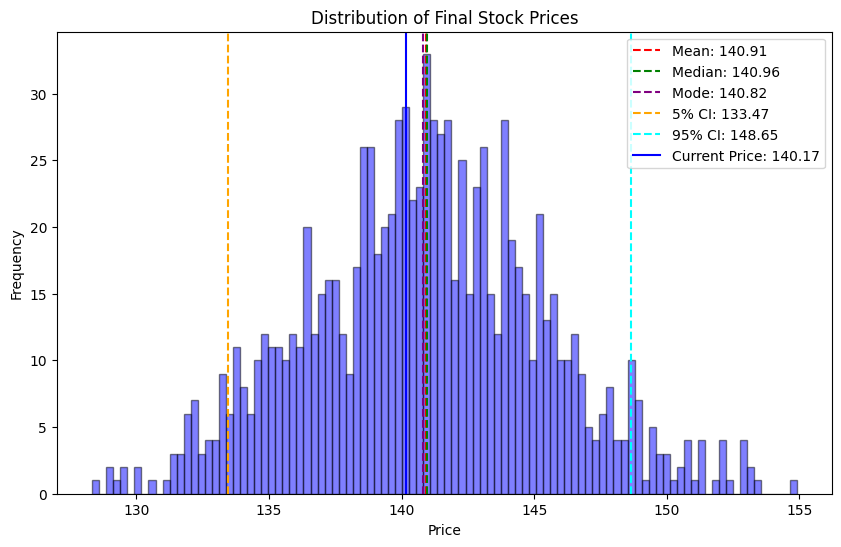

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_final_price_distribution(final_prices, current_price):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=100, color='blue', alpha=0.5, edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)] 
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)

    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    plt.axvline(current_price, color='blue', linestyle='-', label=f'Current Price: {current_price:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)

    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot Charts
    plot_historical(historical, S0)
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    plot_final_price_distribution(final_prices, S0)

# Parameters
ticker = "NVDA"
T = 390/98280 #60 minutes
dt = 1/98280 #number of minutes the stock market is open
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


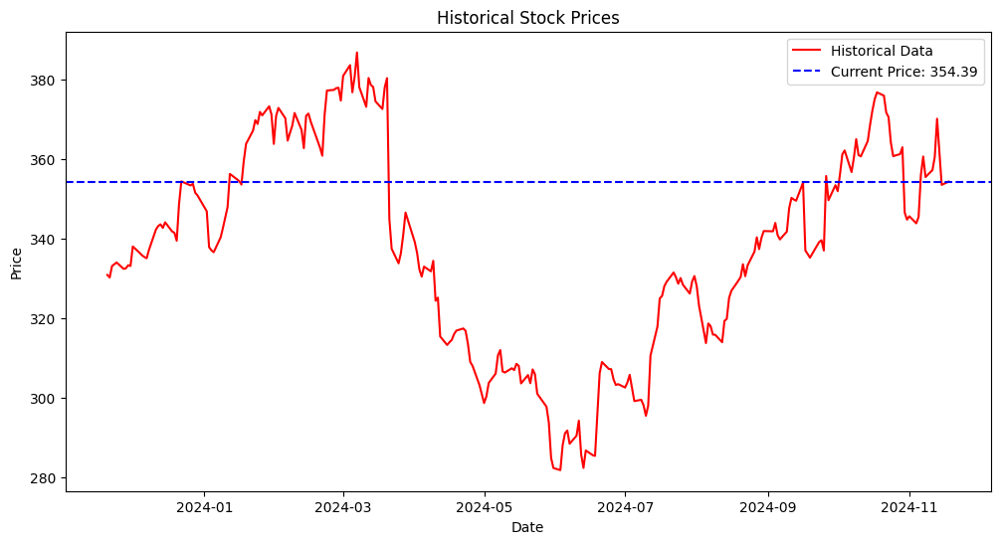

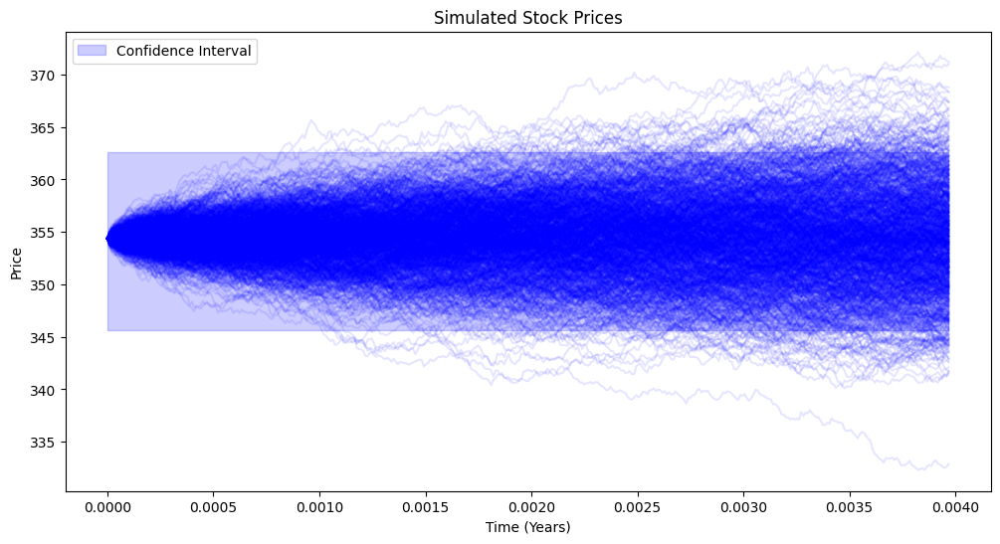

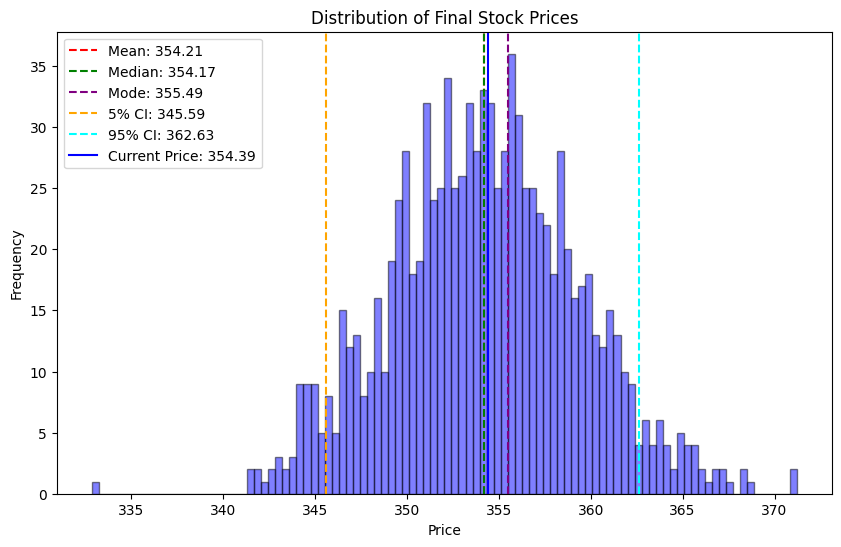

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_final_price_distribution(final_prices, current_price):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=100, color='blue', alpha=0.5, edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)] 
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)

    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    plt.axvline(current_price, color='blue', linestyle='-', label=f'Current Price: {current_price:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)

    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot Charts
    plot_historical(historical, S0)
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    plot_final_price_distribution(final_prices, S0)

# Parameters
ticker = "ACN"
T = 390/98280 #60 minutes
dt = 1/98280 #number of minutes the stock market is open
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_final_price_distribution(final_prices, current_price):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=100, color='blue', alpha=0.5, edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)] 
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)

    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    plt.axvline(current_price, color='blue', linestyle='-', label=f'Current Price: {current_price:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)

    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot Charts
    plot_historical(historical, S0)
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    plot_final_price_distribution(final_prices, S0)

# Parameters
ticker = "ACN"
T = 10
dt = 1/98280 #number of minutes the stock market is open
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


KeyboardInterrupt: 

[*********************100%%**********************]  1 of 1 completed


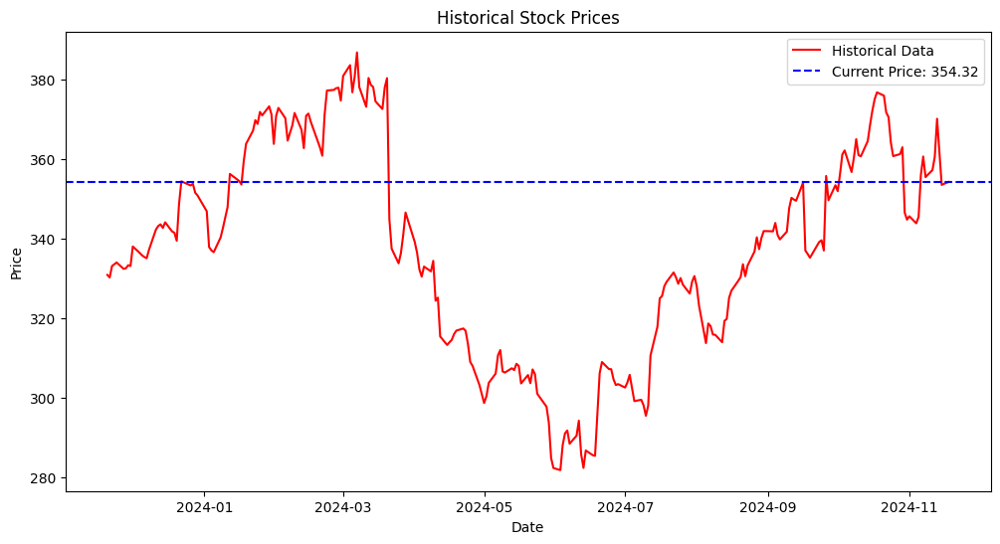

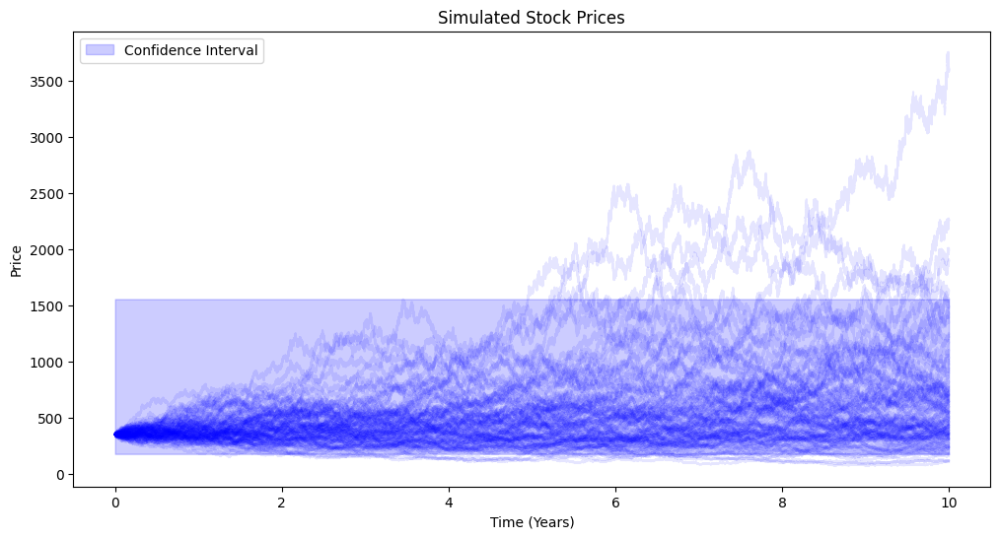

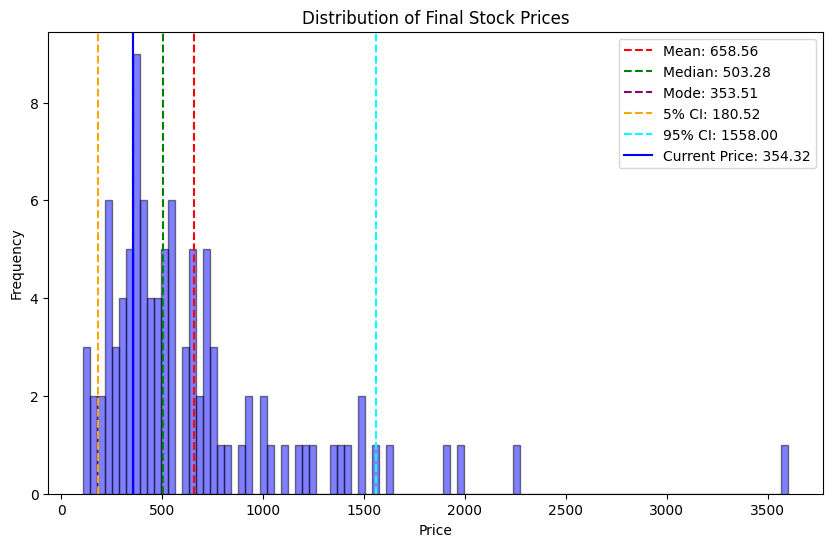

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_final_price_distribution(final_prices, current_price):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=100, color='blue', alpha=0.5, edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)] 
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)

    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    plt.axvline(current_price, color='blue', linestyle='-', label=f'Current Price: {current_price:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)

    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot Charts
    plot_historical(historical, S0)
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    plot_final_price_distribution(final_prices, S0)

# Parameters
ticker = "ACN"
T = 10
dt = 1/98280 #number of minutes the stock market is open
simulations = 100

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


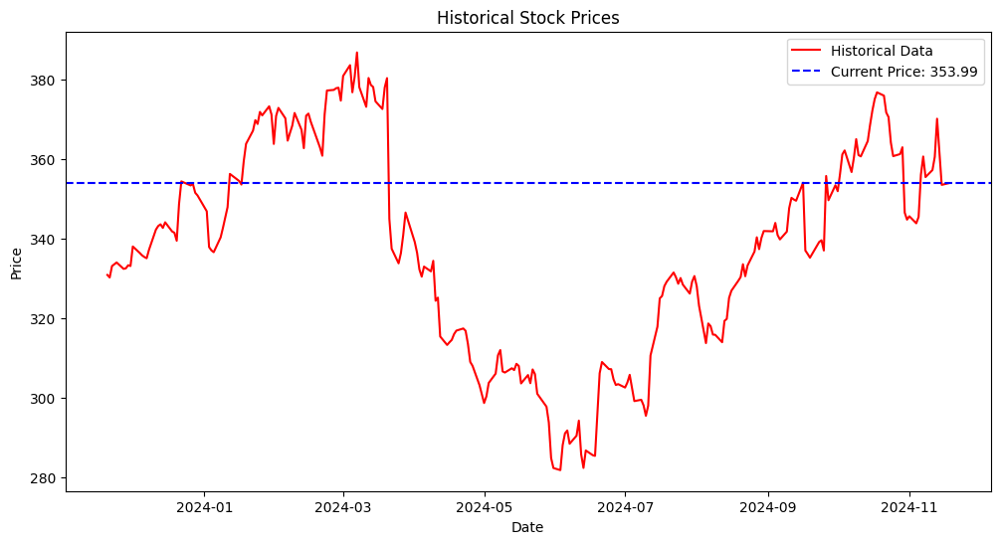

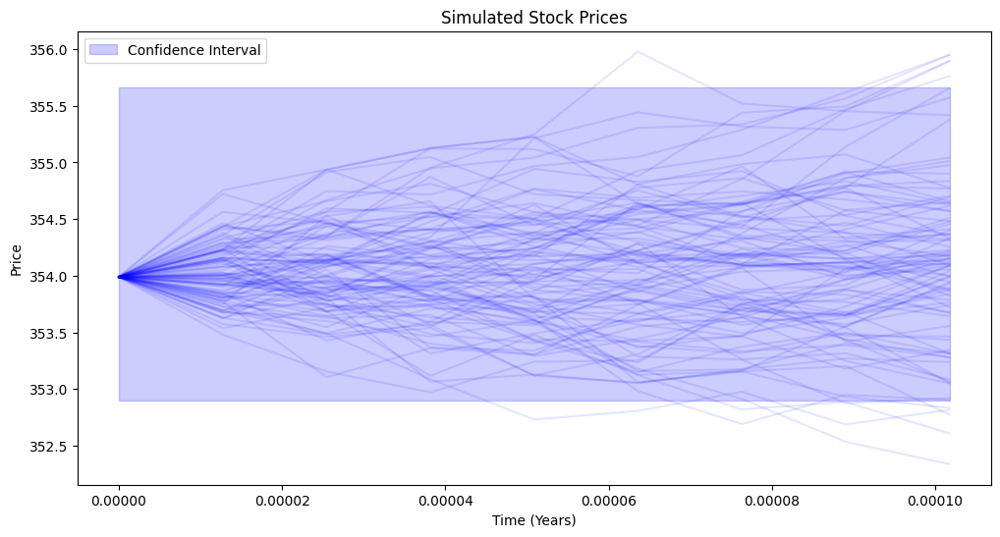

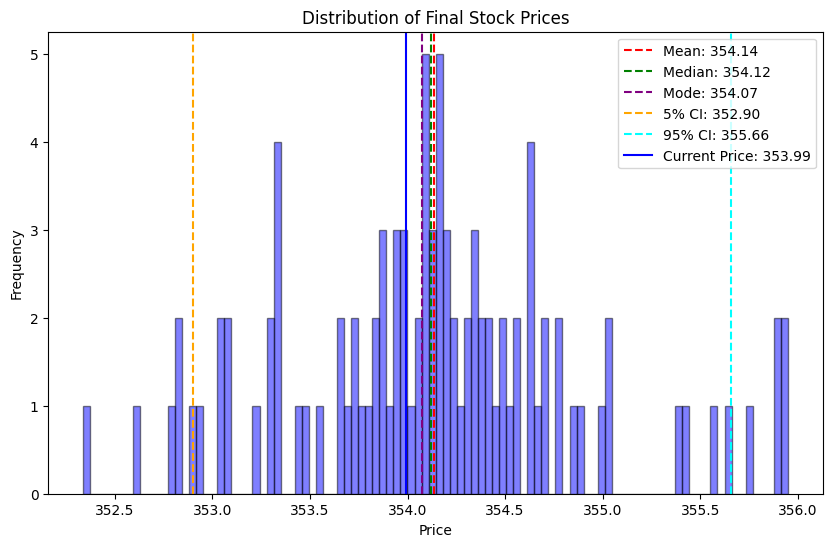

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_final_price_distribution(final_prices, current_price):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=100, color='blue', alpha=0.5, edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)] 
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)

    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    plt.axvline(current_price, color='blue', linestyle='-', label=f'Current Price: {current_price:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)

    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot Charts
    plot_historical(historical, S0)
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    plot_final_price_distribution(final_prices, S0)

# Parameters
ticker = "ACN"
T = 10/98280
dt = 1/98280 #number of minutes the stock market is open
simulations = 100

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


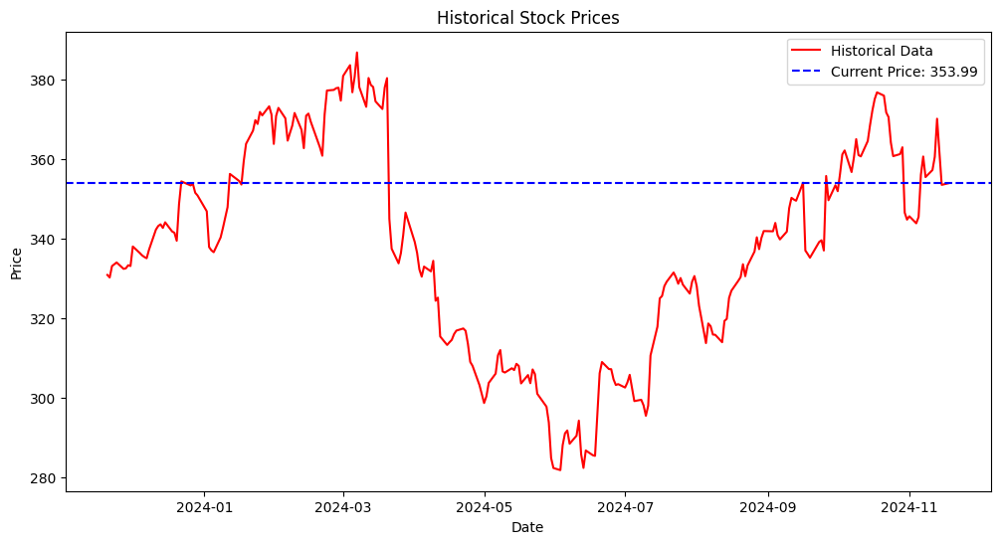

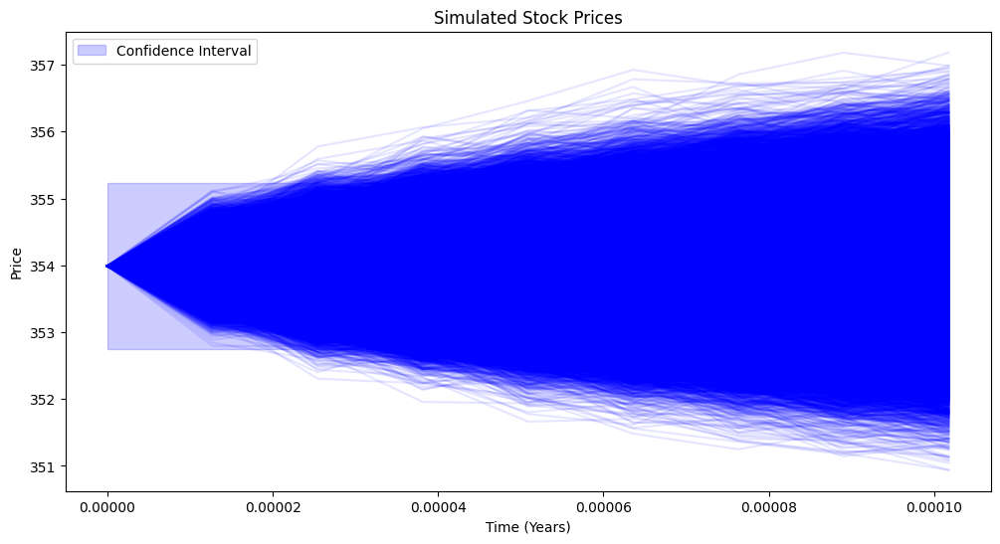

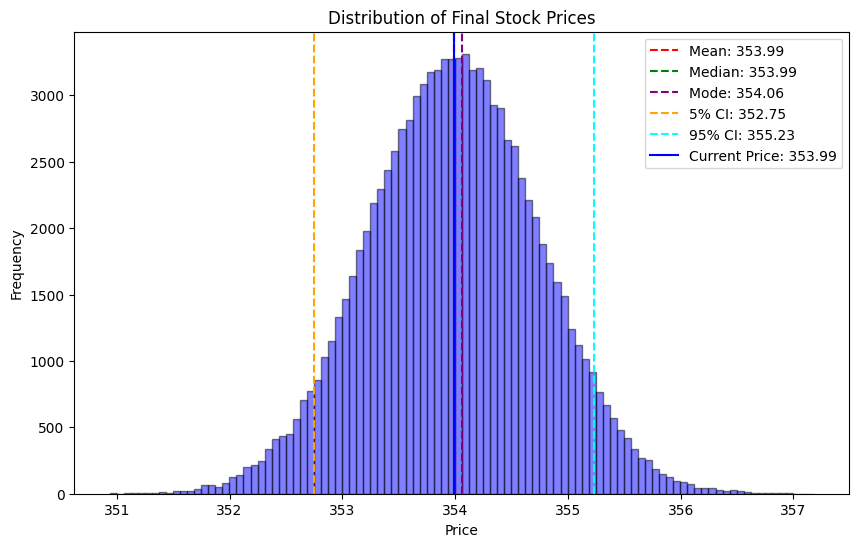

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_final_price_distribution(final_prices, current_price):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=100, color='blue', alpha=0.5, edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)] 
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)

    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    plt.axvline(current_price, color='blue', linestyle='-', label=f'Current Price: {current_price:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)

    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot Charts
    plot_historical(historical, S0)
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    plot_final_price_distribution(final_prices, S0)

# Parameters
ticker = "ACN"
T = 10/98280
dt = 1/98280 #number of minutes the stock market is open
simulations = 100000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


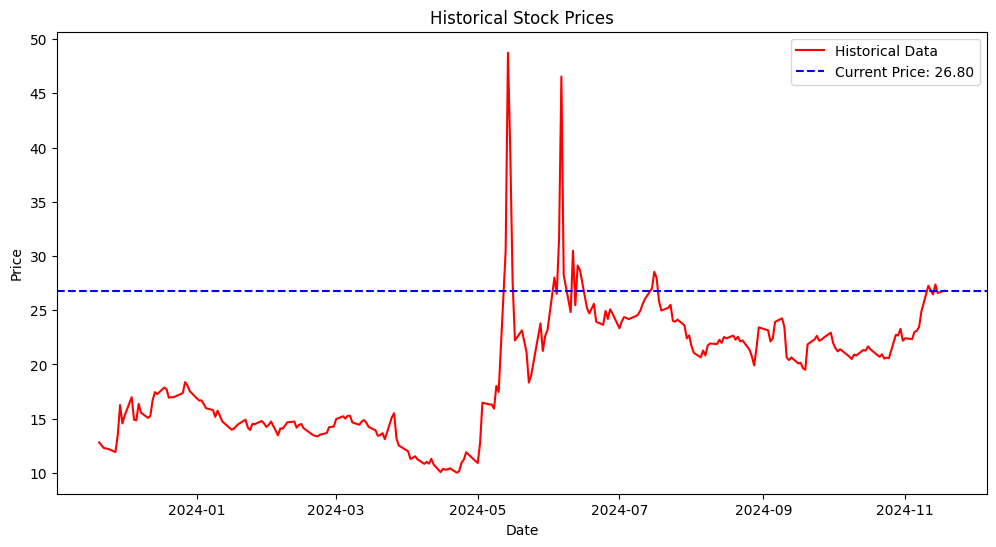

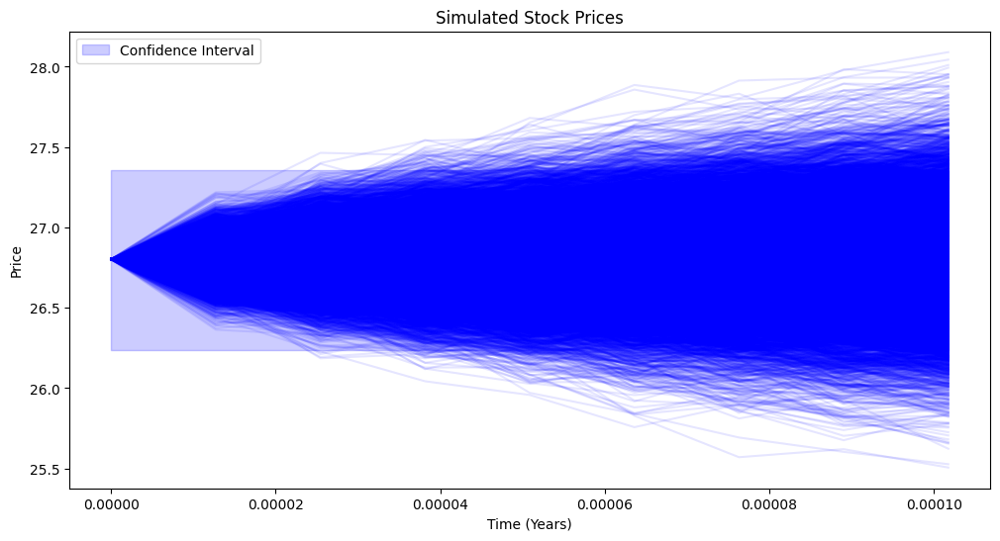

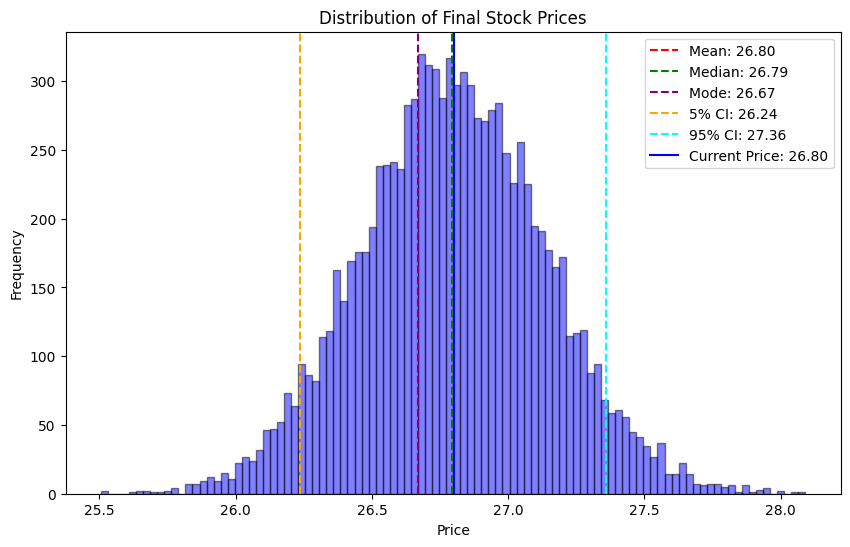

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_final_price_distribution(final_prices, current_price):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=100, color='blue', alpha=0.5, edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)] 
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)

    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    plt.axvline(current_price, color='blue', linestyle='-', label=f'Current Price: {current_price:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)

    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot Charts
    plot_historical(historical, S0)
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    plot_final_price_distribution(final_prices, S0)

# Parameters
ticker = "GME"
T = 10/98280
dt = 1/98280 #number of minutes the stock market is open
simulations = 10000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

[*********************100%%**********************]  1 of 1 completed


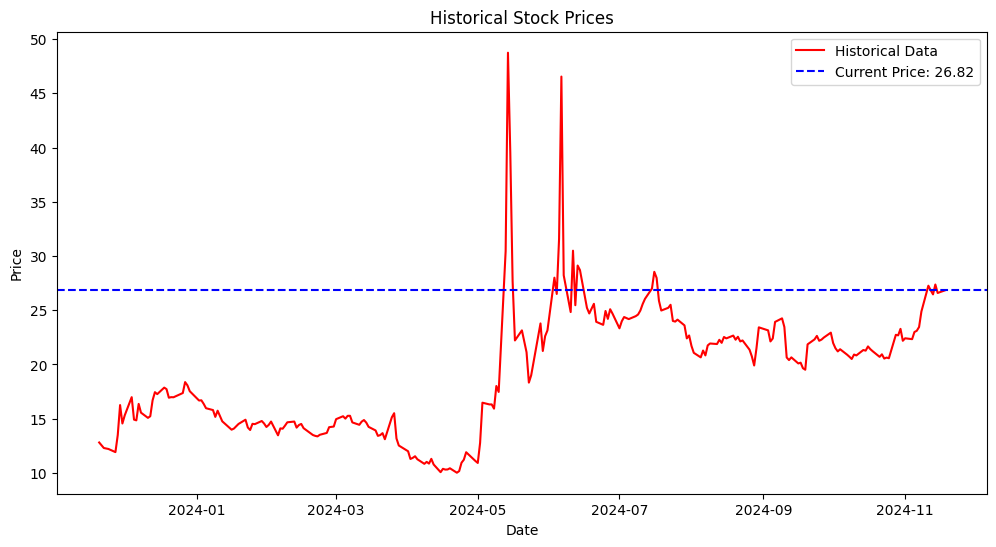

KeyboardInterrupt: 

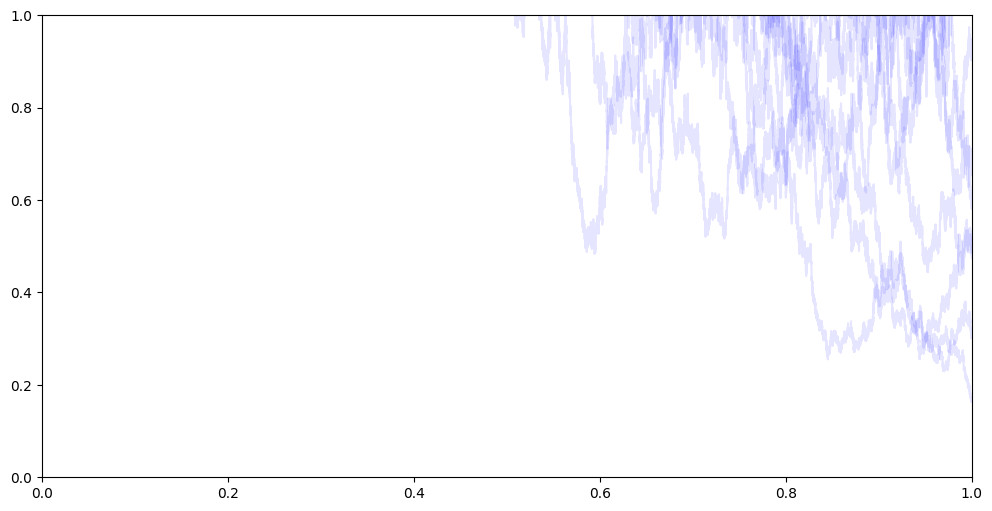

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_final_price_distribution(final_prices, current_price):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=100, color='blue', alpha=0.5, edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)] 
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)

    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    plt.axvline(current_price, color='blue', linestyle='-', label=f'Current Price: {current_price:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)

    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot Charts
    plot_historical(historical, S0)
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    plot_final_price_distribution(final_prices, S0)

# Parameters
ticker = "GME"
T = 5
dt = 1/98280 #number of minutes the stock market is open
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

# Geometric Brownian Motion Simulator
def simulate_gbm(S0, mu, sigma, T, dt, simulations):
    steps = int(T / dt)
    time = np.linspace(0, T, steps)
    prices = np.zeros((steps, simulations))
    prices[0] = S0
    for t in range(1, steps):
        dW = np.random.normal(0, np.sqrt(dt), simulations)
        prices[t] = prices[t - 1] * np.exp((mu - 0.5 * sigma**2) * dt + sigma * dW)
    return time, prices

def fetch_stock_data_and_metrics(ticker, period="1y"):
    data = yf.download(ticker, period=period)
    historical_prices = data['Close']
    daily_returns = np.log(historical_prices / historical_prices.shift(1)).dropna()
    mu = daily_returns.mean() * 252
    sigma = daily_returns.std() * np.sqrt(252)
    current_price = historical_prices.iloc[-1]
    return current_price, mu, sigma, historical_prices

def plot_historical(historical, current_price):
    plt.figure(figsize=(12, 6))
    plt.plot(historical, color='red', label='Historical Data')
    plt.axhline(current_price, color='blue', linestyle='--', label=f'Current Price: {current_price:.2f}')
    plt.title("Historical Stock Prices")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_simulations(time, simulated, confidence_interval):
    plt.figure(figsize=(12, 6))
    plt.plot(time, simulated, alpha=0.1, color='blue')
    plt.fill_between(time, confidence_interval[0], confidence_interval[1], color='blue', alpha=0.2, label='Confidence Interval')
    plt.title("Simulated Stock Prices")
    plt.xlabel("Time (Years)")
    plt.ylabel("Price")
    plt.legend()
    plt.show()

def plot_final_price_distribution(final_prices, current_price):
    plt.figure(figsize=(10, 6))
    counts, bins, _ = plt.hist(final_prices, bins=100, color='blue', alpha=0.5, edgecolor='black')
    
    mean_price = np.mean(final_prices)
    median_price = np.median(final_prices)
    mode_price = bins[np.argmax(counts)] 
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)

    plt.axvline(mean_price, color='red', linestyle='--', label=f'Mean: {mean_price:.2f}')
    plt.axvline(median_price, color='green', linestyle='--', label=f'Median: {median_price:.2f}')
    plt.axvline(mode_price, color='purple', linestyle='--', label=f'Mode: {mode_price:.2f}')
    plt.axvline(lower_bound, color='orange', linestyle='--', label=f'5% CI: {lower_bound:.2f}')
    plt.axvline(upper_bound, color='cyan', linestyle='--', label=f'95% CI: {upper_bound:.2f}')
    plt.axvline(current_price, color='blue', linestyle='-', label=f'Current Price: {current_price:.2f}')
    
    plt.title("Distribution of Final Stock Prices")
    plt.xlabel("Price")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()


# Main Implementation
def monte_carlo_simulation(ticker, T, dt, simulations):
    S0, mu, sigma, historical = fetch_stock_data_and_metrics(ticker)
    time, simulated = simulate_gbm(S0, mu, sigma, T, dt, simulations)

    final_prices = simulated[-1]
    lower_bound = np.percentile(final_prices, 5)
    upper_bound = np.percentile(final_prices, 95)
    # Plot Charts
    plot_historical(historical, S0)
    plot_simulations(time, simulated, (lower_bound, upper_bound))
    plot_final_price_distribution(final_prices, S0)

# Parameters
ticker = "GME"
T = 5
dt = 1/252 #number of minutes the stock market is open
simulations = 1000

# Run Monte Carlo Simulation
monte_carlo_simulation(ticker, T, dt, simulations)

: 